In [ ]:
# in this notebook, I will try to fit a model relating the mean behavior of L4, L2/3, SST and VIP cells

In [ ]:
# load the data

In [1]:
import pyute as ut
import autograd.numpy as np
import matplotlib.pyplot as plt
import sklearn
import h5py
import pdb
import scipy.optimize as sop
from mpl_toolkits.mplot3d import Axes3D
import sklearn.discriminant_analysis as skd
import autograd.scipy.special as ssp
from autograd import elementwise_grad as egrad
from autograd import grad
from autograd import jacobian
from autograd import hessian
import size_contrast_analysis as sca
import scipy.stats as sst
import sim_utils
from importlib import reload
reload(sim_utils)
import calnet.utils
import calnet.fitting_spatial_feature_opto
import calnet.calnet as cc
import opto_utils
import glob
import scipy.signal as ssi
%matplotlib notebook

/Users/dan/Documents/code/downloads/OASIS/oasis/functions.py:14: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  "just not the slower interior point methods we compared to in the papers.")


In [2]:
dsbase = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/'
dsnames = [dsbase+x+'_data_struct.hdf5' for x in ['pyr_l4','pyr_l23','sst_l23','vip_l23','pv_l23']]
for dsname in dsnames:
    print(dsname)
    with ut.hdf5read(dsname) as ds:
        keylist = list(ds.keys())
        for key in keylist:
            print(key)
            if 'size_contrast_0' in ds[key].keys():
                print('SC')
            if 'figure_ground_0' in ds[key].keys():
                print('FG')
    #     print(keylist)

/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l4_data_struct.hdf5
session_181127_M10073
SC
session_190202_M10075
SC
FG
session_190304_M10077
SC
FG
session_190607_M10443
SC
FG
session_190620_M10616
SC
FG
session_190620_M10619
SC
FG
session_190624_M10615
SC
session_190627_M10616
SC
FG
session_190701_M10615
SC
FG
session_191212_M0762
SC
/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l23_data_struct.hdf5
session_181205_M10130
SC
session_181209_M8536
SC
FG
session_181213_M8536
SC
session_181214_M10130
SC
session_190102_M10130
SC
session_190128_M8982
SC
FG
session_190130_M9667
SC
FG
session_190131_M9355
SC
FG
session_190208_M9355
SC
FG
session_190212_M8536
SC
FG
session_191002_M0293
SC
session_191108_M0403
SC
session_200822_M0771
SC
FG
/Users/dan/Documents/notebooks/mossing-PC/shared_data/sst_l23_data_struct.hdf5
session_180713_M9053
SC
FG
session_180714_M9053
SC
FG
session_180802_M9053
SC
session_180821_M9417
SC
FG
session_181117_M10039
SC
FG
session_181120_M10039
SC


In [3]:
to_exclude = ['session_'+exptname for exptname in ['180714_M9053','180321_M7955', '180519_M8959', '180531_M8961', '180618_M8956','190202_M10075', '190620_M10619']]
tuning,uparam,displacement,pval = sim_utils.compute_tuning(dsnames[-1],datafield='decon',running=False,expttype='retinotopy_0')
modal_uparam_ret = uparam[0].copy()

<HDF5 group "/session_191105_M0589" (12 members)>
decon
1.0
<HDF5 group "/session_191220_M0589" (12 members)>
decon
1.0
<HDF5 group "/session_191229_M0892" (12 members)>
decon
1.0
<HDF5 group "/session_200102_M0892" (12 members)>
decon
0.8477366255144033
<HDF5 group "/session_200108_M0891" (12 members)>
decon
0.9794238683127572
<HDF5 group "/session_200620_M0891" (13 members)>
decon
0.7448559670781894
<HDF5 group "/session_200621_M0893" (13 members)>
decon
0.07818930041152264


In [4]:
modal_uparam_ret

[array([-20., -15., -10.,  -5.,   0.,   5.,  10.,  15.,  20.]),
 array([-16., -11.,  -6.,  -1.,   4.,   9.,  14.,  19.,  24.])]

In [5]:
to_exclude = ['session_'+exptname for exptname in ['180714_M9053','180321_M7955', '180519_M8959', '180531_M8961', '180618_M8956','190202_M10075', '190620_M10619']]
tuning,uparam,displacement,pval = sim_utils.compute_tuning(dsnames[-1],datafield='decon',running=False,expttype='size_contrast_0')
modal_uparam = uparam[0].copy()

<HDF5 group "/session_191105_M0589" (12 members)>
decon
1.0
<HDF5 group "/session_191220_M0589" (12 members)>
decon
0.9995039682539683
<HDF5 group "/session_191229_M0892" (12 members)>
decon
0.9995039682539683
<HDF5 group "/session_200102_M0892" (12 members)>
decon
0.9350198412698413
<HDF5 group "/session_200108_M0891" (12 members)>
decon
0.8606150793650794
<HDF5 group "/session_200620_M0891" (13 members)>
decon
0.44543650793650796


/Users/dan/Documents/code/adesnal/pyute.py:1199: RuntimeWarning: Mean of empty slice
  tuning[:,itype] = np.nanmean(data[cell_criteria][:,these_trials],1)


<HDF5 group "/session_200621_M0893" (13 members)>
decon
0.5277777777777778


/Users/dan/Documents/code/adesnal/pyute.py:1199: RuntimeWarning: Mean of empty slice
  tuning[:,itype] = np.nanmean(data[cell_criteria][:,these_trials],1)


In [6]:
tuning,uparam,displacement,pval = sim_utils.compute_tuning(dsnames[-2],datafield='decon',running=False,expttype='figure_ground_0')
modal_uparam_fg = uparam[0].copy()

<HDF5 group "/session_180321_M7955" (8 members)>
decon
0.08333333333333333
<HDF5 group "/session_180412_M7955" (8 members)>
<HDF5 group "/session_180516_M8956" (9 members)>
decon
0.67
<HDF5 group "/session_180519_M8959" (9 members)>
decon
0.159375
<HDF5 group "/session_180528_M8959" (9 members)>
decon
0.4875
<HDF5 group "/session_180531_M8961" (9 members)>
decon
0.395
<HDF5 group "/session_180618_M8956" (9 members)>
decon
0.125
<HDF5 group "/session_180719_M8961" (8 members)>
<HDF5 group "/session_180720_M8961" (8 members)>
<HDF5 group "/session_180903_M8961" (9 members)>
decon
0.3075
<HDF5 group "/session_190710_M0208" (13 members)>
decon
0.7375
<HDF5 group "/session_191215_M0385" (13 members)>
decon
0.7875
<HDF5 group "/session_200103_M0388" (13 members)>
decon
0.915


In [85]:
ret_map_distance = False
pval_cutoff = 0.05

In [86]:
to_exclude = ['session_'+exptname for exptname in ['180714_M9053','180321_M7955', '180519_M8959', '180531_M8961', '180618_M8956','190202_M10075', '190620_M10619']]

reload(sim_utils)
reload(calnet.utils)
reload(ut)
dsnames = [dsbase+x+'_data_struct.hdf5' for x in ['pyr_l4','pyr_l23','sst_l23','vip_l23','pv_l23']]
# dsnames = dsnames[4:]
# dsnames = [dsnames[0],dsnames[2],dsnames[3],dsnames[4]]
ncelltypes = len(dsnames)
selection = [None for itype in range(ncelltypes)]
for itype in range(ncelltypes):
    with ut.hdf5read(dsnames[itype]) as ds:
        keylist = list(ds.keys())
        nexpt = len(keylist)
        to_keep = np.array([k not in to_exclude for k in keylist])
        selection[itype] = np.arange(nexpt)[to_keep]
# selection = utils.default_selection()
# selection[1] = [0,1,2,3,4,5,7,8,9]
# selection[3] = None
reload(calnet.utils)
# itype = 2
# rs,expt_ids = calnet.utils.gen_rs_modal_uparam_expt(dsnames=[dsnames[itype]],selection=[selection[itype]],running=False,modal_uparam=modal_uparam,expttype='size_contrast_0',pval_cutoff=1.1,average_ori=False,dcutoff=10.)
rs_ret,rs_sem_ret,expt_ids_ret,roi_ids_ret,disps_ret = [[None for irun in range(2)] for ivar in range(5)]
for irun in range(2):
    rs_ret[irun],rs_sem_ret[irun],expt_ids_ret[irun],roi_ids_ret[irun],disps_ret[irun] = calnet.utils.gen_rs_modal_uparam_expt_with_sem(dsnames=dsnames,selection=selection,running=irun,\
                                                                    modal_uparam=modal_uparam_ret,expttype='retinotopy_0',\
                                                                    pval_cutoff=pval_cutoff,average_ori=False,dcutoff=10.,\
                                                                    run_cutoff=1,running_pct_cutoff=0.2,use_uparam=False,ret_map_distance=ret_map_distance)
#     tunings,tunings_sem,uparams,displacements,pvals = calnet.utils.gen_rs_modal_uparam_expt_with_sem(dsnames=dsnames,selection=selection,running=irun,\
#                                                                     modal_uparam=modal_uparam_ret,expttype='retinotopy_0',\
#                                                                     pval_cutoff=0.05,average_ori=False,dcutoff=10.,\
#                                                                     run_cutoff=1,running_pct_cutoff=0.2,use_uparam=False)
# ut.mkdir('data')
# np.save('data/celltype_rate_summary.npy',rs)
# rs = np.load('data/celltype_rate_summary.npy',allow_pickle=True)

/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l4_data_struct.hdf5
<HDF5 group "/session_181127_M10073" (8 members)>
decon
0.7870370370370371
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190202_M10075" (9 members)>
decon
0.3425925925925926


/Users/dan/Documents/code/adesnal/pyute.py:1220: RuntimeWarning: Mean of empty slice
  tuning[:,itype] = np.nanmean(this_data,1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190304_M10077" (9 members)>
decon
0.5771604938271605
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190607_M10443" (9 members)>
decon
0.04938271604938271
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190620_M10616" (9 members)>
decon
0.46502057613168724
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190620_M10619" (9 members)>
decon
0.9259259259259259
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190624_M10615" (8 members)>
decon
0.012345679012345678
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190627_M10616" (9 members)>
decon
0.8600823045267489
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190701_M10615" (9 members)>
decon
0.19753086419753085
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_191212_M0762" (12 members)>
decon
0.691358024691

now subtracting center of rg for retinotopy expts
<HDF5 group "/session_181213_M8536" (8 members)>
decon
0.6635802469135802
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_181214_M10130" (8 members)>
decon
0.1882716049382716
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190102_M10130" (8 members)>
decon
0.09567901234567901
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190128_M8982" (9 members)>
decon
0.09259259259259259
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190130_M9667" (9 members)>
decon
0.8641975308641975
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190131_M9355" (9 members)>
decon
0.16358024691358025
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190208_M9355" (9 members)>
decon
0.10185185185185185
now subtracting center of rg for retinotopy expts
<HDF5 group "/session_190212_M8536" (9 members)>
decon
0.9166666666666666
no

<KeysViewHDF5 ['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_contrast', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_parameters', 'stimulus_size_deg', 't_offset']>
<KeysViewHDF5 ['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_amplitude', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'rf_sigma', 'rf_sq_error', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_id', 'stimulus_location_x_deg', 'stimulus_location_y_deg', 'stimulus_parameters', 't_offset']>
x location: [-12.  -7.  -2.   3.   8.  13.  18.  23.  28.]
y location: [-20. -15. -10.  -5.   0.   5.  10.  15.  20.]
[20. 20.]
[28. 20.]
[28. 20.]
[8 0]
[b'stimulus_location_y_deg' b'stimulus_location_x_deg']


<IPython.core.display.Javascript object>


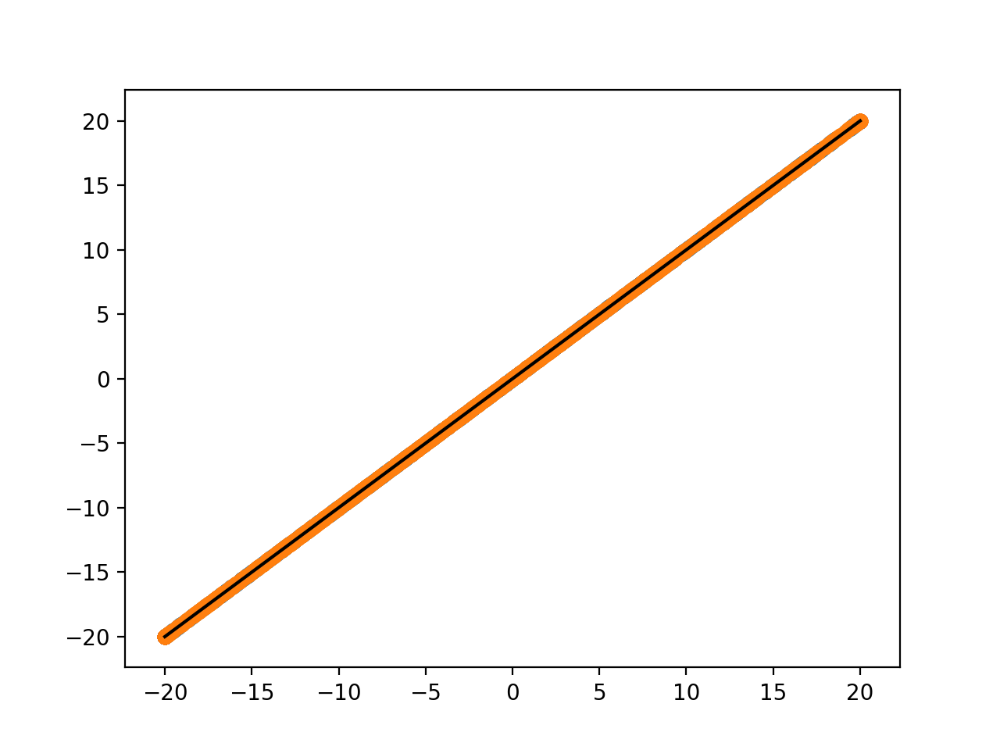

In [87]:
with ut.hdf5read(dsnames[0]) as ds:
    keylist = list(ds.keys())
    ikey = 7
    d1 = (ds[keylist[ikey]]['retinotopy_0']['rf_distance_deg'][:])
    d2 = (ds[keylist[ikey]]['size_contrast_0']['rf_distance_deg'][:])
#     print(ds[keylist[ikey]]['retinotopy_0'].keys())
    xmean = np.mean(ds[keylist[ikey]]['retinotopy_0']['stimulus_location_x_deg'][:])
    print(ds[keylist[ikey]]['size_contrast_0'].keys())
    print(ds[keylist[ikey]]['retinotopy_0'].keys())
    print('x location: '+str(ds[keylist[ikey]]['retinotopy_0']['stimulus_location_x_deg'][:]))
    print('y location: '+str(ds[keylist[ikey]]['retinotopy_0']['stimulus_location_y_deg'][:]))
    ymean = np.mean(ds[keylist[ikey]]['retinotopy_0']['stimulus_location_y_deg'][:])
    print(ds[keylist[ikey]]['size_contrast_0']['rf_displacement_deg'][:].max(1))
    print(ds[keylist[ikey]]['retinotopy_0']['rf_displacement_deg'][:].max(1))
    print(ds[keylist[ikey]]['retinotopy_0']['rf_ctr'][:].max(1))
    print(ds[keylist[ikey]]['size_contrast_0']['stim_offset_deg'][:])
    zmean = ds[keylist[ikey]]['size_contrast_0']['stim_offset_deg'][:]
    print(ds[keylist[ikey]]['retinotopy_0']['stimulus_parameters'][:])
    plt.figure()
    idim = 0
    ry = ds[keylist[ikey]]['retinotopy_0']['rf_displacement_deg'][:]-zmean[:,np.newaxis]#-np.array((xmean,ymean))[:,np.newaxis]#[:,idim]
    rx = ds[keylist[ikey]]['size_contrast_0']['rf_displacement_deg'][:]#[:,idim]
    for idim in range(2):
        plt.scatter(rx[idim],ry[idim])
    plt.plot((-20,20),(-20,20),c='k')

In [88]:
ry.shape

(2, 1518)

In [89]:
iid = 0
np.sum(expt_ids_ret[0][0][0]==iid)

439

In [90]:
iid = 0
np.sum(expt_ids[0][0][0]==iid)

1335

In [91]:
npix = 9
nmsk = int((npix+1)/2)
npix = modal_uparam_ret[0].size
ret_msk = np.zeros((nmsk,npix,npix),dtype='bool')
for i in range(nmsk):
    ret_msk[i][4-i:4+i+1,4-i:4+i+1] = True
    if i>0:
        ret_msk[i][np.any(ret_msk[:i],axis=0)] = False

<IPython.core.display.Javascript object>


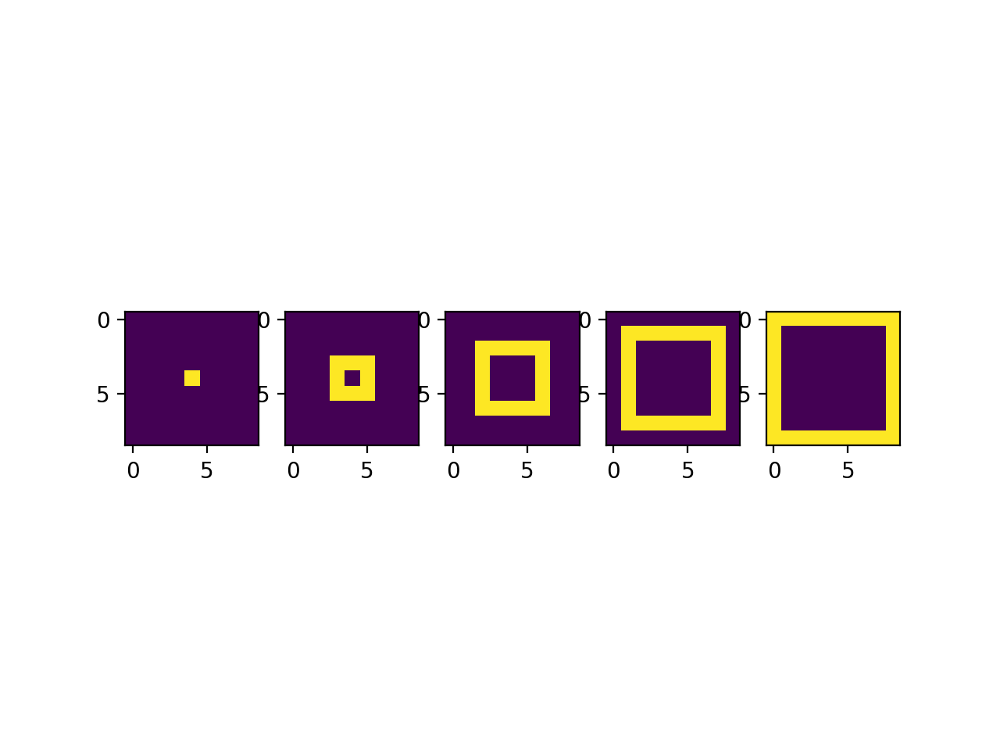

In [92]:
plt.figure()
for i in range(5):
    plt.subplot(1,5,i+1)
    plt.imshow(ret_msk[i])

<IPython.core.display.Javascript object>


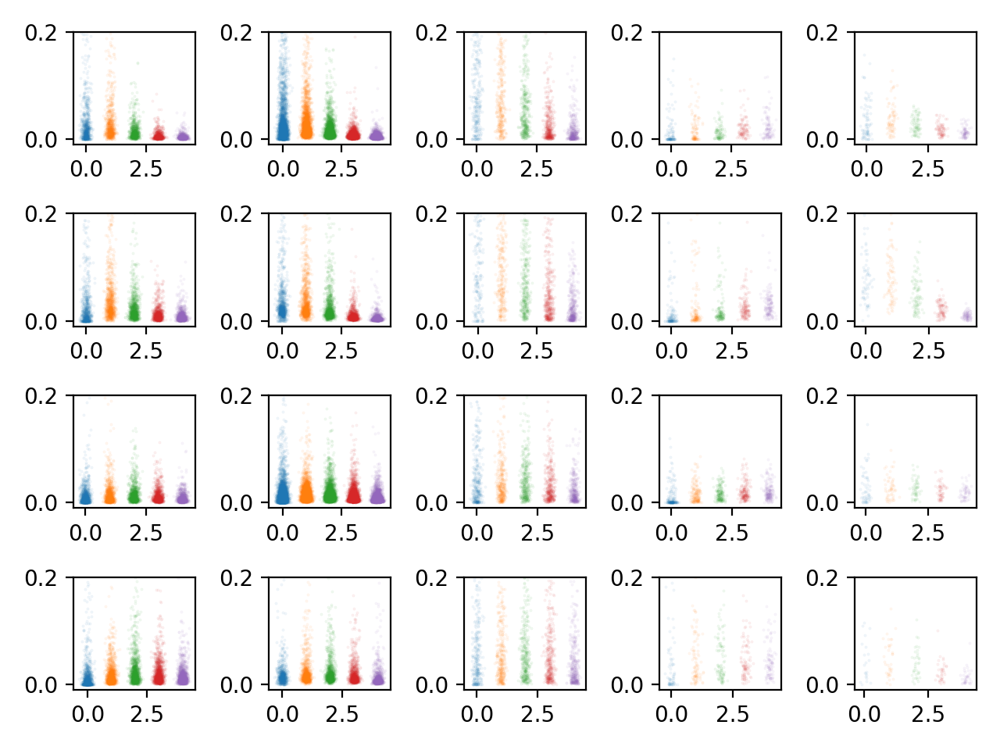

In [93]:
plt.figure()
rs_ret_avg = [None for ialign in range(2)]#rs_ret.copy()
for irun in range(2):
    rs_ret_avg[irun] = [None for itype in range(5)]
    for itype in range(5):
        rs_ret_avg[irun][itype] = [None for ialign in range(2)]
        for ialign in range(2):
#             if itype==1:
#                 rs_ret_avg[irun][itype][ialign]  = np.zeros((l23_rs_ret[irun][0][ialign].shape[0],nmsk))
#             else:
            rs_ret_avg[irun][itype][ialign]  = np.zeros((rs_ret[irun][itype][ialign].shape[0],nmsk))
            plt.subplot(4,nmsk,10*ialign+5*irun+itype+1)
            for imsk in range(nmsk):
#                 if itype==1:
#                     this_ret_avg = np.nanmean(l23_rs_ret[irun][0][ialign][:,ret_msk[imsk]],1)
#                 else:
                this_ret_avg = np.nanmean(rs_ret[irun][itype][ialign][:,ret_msk[imsk]],1)
                rs_ret_avg[irun][itype][ialign][:,imsk] = this_ret_avg
                plt.scatter(imsk*np.ones((this_ret_avg.shape[0],))+0.1*np.random.randn(rs_ret[irun][itype][ialign].shape[0]),this_ret_avg,s=0.1,alpha=0.1)
            plt.ylim((-0.01,0.2))
#             plt.imshow(np.nanmean(rs_ret[irun][itype][ialign],0))
plt.tight_layout()

In [94]:
to_exclude = ['session_'+exptname for exptname in ['180714_M9053','180321_M7955', '180519_M8959', '180531_M8961', '180618_M8956','190202_M10075', '190620_M10619']]

reload(sim_utils)
reload(calnet.utils)
reload(ut)
dsnames = [dsbase+x+'_data_struct.hdf5' for x in ['pyr_l4','pyr_l23','sst_l23','vip_l23','pv_l23']]
# dsnames = dsnames[4:]
# dsnames = [dsnames[0],dsnames[2],dsnames[3],dsnames[4]]
ncelltypes = len(dsnames)
selection = [None for itype in range(ncelltypes)]
for itype in range(ncelltypes):
    with ut.hdf5read(dsnames[itype]) as ds:
        keylist = list(ds.keys())
        nexpt = len(keylist)
        to_keep = np.array([k not in to_exclude for k in keylist])
        selection[itype] = np.arange(nexpt)[to_keep]
# selection = utils.default_selection()
# selection[1] = [0,1,2,3,4,5,7,8,9]
# selection[3] = None
reload(calnet.utils)
# itype = 2
# rs,expt_ids = calnet.utils.gen_rs_modal_uparam_expt(dsnames=[dsnames[itype]],selection=[selection[itype]],running=False,modal_uparam=modal_uparam,expttype='size_contrast_0',pval_cutoff=1.1,average_ori=False,dcutoff=10.)
rs,rs_sem,expt_ids,roi_ids = [[None for irun in range(2)] for ivar in range(4)]
for irun in range(2):
    rs[irun],rs_sem[irun],expt_ids[irun],roi_ids[irun],_ = calnet.utils.gen_rs_modal_uparam_expt_with_sem(dsnames=dsnames,selection=selection,running=irun,\
                                                                    modal_uparam=modal_uparam,expttype='size_contrast_0',\
                                                                    pval_cutoff=pval_cutoff,average_ori=False,dcutoff=10.,\
                                                                    run_cutoff=1,running_pct_cutoff=0.2,ret_map_distance=ret_map_distance)
#     tunings,tunings_sesm,uparams,displacements,pvals = calnet.utils.gen_rs_modal_uparam_expt_with_sem(dsnames=dsnames,selection=selection,running=irun,\
#                                                                     modal_uparam=modal_uparam,expttype='size_contrast_0',\
#                                                                     pval_cutoff=0.05,average_ori=False,dcutoff=10.,\
#                                                                     run_cutoff=1,running_pct_cutoff=0.2)
# ut.mkdir('data')
# np.save('data/celltype_rate_summary.npy',rs)
# rs = np.load('data/celltype_rate_summary.npy',allow_pickle=True)

/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l4_data_struct.hdf5
<HDF5 group "/session_181127_M10073" (8 members)>
decon
0.7428571428571429
<HDF5 group "/session_190202_M10075" (9 members)>
decon
0.5569444444444445
<HDF5 group "/session_190304_M10077" (9 members)>
decon
0.5048611111111111
<HDF5 group "/session_190607_M10443" (9 members)>
decon
0.08888888888888889
<HDF5 group "/session_190620_M10616" (9 members)>
decon
0.44246031746031744
<HDF5 group "/session_190620_M10619" (9 members)>
decon
0.5386904761904762
<HDF5 group "/session_190624_M10615" (8 members)>
decon
0.02628968253968254
<HDF5 group "/session_190627_M10616" (9 members)>
decon
0.6815476190476191
<HDF5 group "/session_190701_M10615" (9 members)>
decon
0.5401785714285714
<HDF5 group "/session_191212_M0762" (12 members)>
decon
0.6994047619047619
/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l23_data_struct.hdf5
<HDF5 group "/session_181205_M10130" (8 members)>
decon
0.695
<HDF5 group "/session_181209

<HDF5 group "/session_200620_M0891" (13 members)>
decon
0.6612103174603174
<HDF5 group "/session_200621_M0893" (13 members)>
decon
0.5873015873015873


In [95]:
dsnames = [dsbase+x+'_data_struct.hdf5' for x in ['pyr_l4','pyr_l23','sst_l23','vip_l23','pv_l23']]
for dsname in dsnames:
    with ut.hdf5read(dsname) as ds:
        keylist = list(ds.keys())
        print(keylist)
        for key in keylist:
            print(('retinotopy_0' in ds[key],'size_contrast_0' in ds[key],'figure_ground_0' in ds[key]))

['session_181127_M10073', 'session_190202_M10075', 'session_190304_M10077', 'session_190607_M10443', 'session_190620_M10616', 'session_190620_M10619', 'session_190624_M10615', 'session_190627_M10616', 'session_190701_M10615', 'session_191212_M0762']
(True, True, False)
(True, True, True)
(True, True, True)
(True, True, True)
(True, True, True)
(True, True, True)
(True, True, False)
(True, True, True)
(True, True, True)
(True, True, False)
['session_181205_M10130', 'session_181209_M8536', 'session_181213_M8536', 'session_181214_M10130', 'session_190102_M10130', 'session_190128_M8982', 'session_190130_M9667', 'session_190131_M9355', 'session_190208_M9355', 'session_190212_M8536', 'session_191002_M0293', 'session_191108_M0403', 'session_200822_M0771']
(True, True, False)
(True, True, True)
(True, True, False)
(True, True, False)
(True, True, False)
(True, True, True)
(True, True, True)
(True, True, True)
(True, True, True)
(True, True, True)
(True, True, False)
(True, True, False)
(True, 

In [96]:
to_exclude = ['session_'+exptname for exptname in ['180714_M9053','180321_M7955', '180519_M8959', '180531_M8961', '180618_M8956','190202_M10075', '190620_M10619']]

expttype = 'figure_ground_0'

reload(sim_utils)
reload(calnet.utils)
reload(ut)
dsnames = [dsbase+x+'_data_struct.hdf5' for x in ['pyr_l4','pyr_l23','sst_l23','vip_l23','pv_l23']]
# dsnames = dsnames[3:]
# dsnames = [dsnames[0],dsnames[2],dsnames[3],dsnames[4]]
ncelltypes = len(dsnames)
selection = [None for itype in range(ncelltypes)]
for itype in range(ncelltypes):
    with ut.hdf5read(dsnames[itype]) as ds:
        keylist = list(ds.keys())
        nexpt = len(keylist)
        to_keep = np.array([k not in to_exclude for k in keylist])
        selection[itype] = np.arange(nexpt)[to_keep]
# selection = utils.default_selection()
# selection[1] = [0,1,2,3,4,5,7,8,9]
# selection[3] = None
reload(calnet.utils)
# itype = 2
# rs,expt_ids = calnet.utils.gen_rs_modal_uparam_expt(dsnames=[dsnames[itype]],selection=[selection[itype]],running=False,modal_uparam=modal_uparam,expttype='size_contrast_0',pval_cutoff=1.1,average_ori=False,dcutoff=10.)
rs_fg,rs_sem_fg,expt_ids_fg,roi_ids_fg = [[None for irun in range(2)] for ivar in range(4)]
for irun in range(2):
    rs_fg[irun],rs_sem_fg[irun],expt_ids_fg[irun],roi_ids_fg[irun],_ = calnet.utils.gen_rs_modal_uparam_expt_with_sem(dsnames=dsnames,selection=selection,running=irun,\
                                                                    modal_uparam=modal_uparam_fg,expttype=expttype,\
                                                                    pval_cutoff=pval_cutoff,average_ori=False,dcutoff=10.,\
                                                                    run_cutoff=1,running_pct_cutoff=0.2,ret_map_distance=ret_map_distance)
# ut.mkdir('data')
# np.save('data/celltype_rate_summary.npy',rs)
# rs = np.load('data/celltype_rate_summary.npy',allow_pickle=True)

/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l4_data_struct.hdf5
<HDF5 group "/session_181127_M10073" (8 members)>
<HDF5 group "/session_190202_M10075" (9 members)>
decon
0.49
<HDF5 group "/session_190304_M10077" (9 members)>
decon
0.61
<HDF5 group "/session_190607_M10443" (9 members)>
decon
0.0825
<HDF5 group "/session_190620_M10616" (9 members)>
decon
0.41625
<HDF5 group "/session_190620_M10619" (9 members)>
decon
0.775
<HDF5 group "/session_190624_M10615" (8 members)>
<HDF5 group "/session_190627_M10616" (9 members)>
decon
0.93625
<HDF5 group "/session_190701_M10615" (9 members)>
decon
0.67
<HDF5 group "/session_191212_M0762" (12 members)>
/Users/dan/Documents/notebooks/mossing-PC/shared_data/pyr_l23_data_struct.hdf5
<HDF5 group "/session_181205_M10130" (8 members)>
<HDF5 group "/session_181209_M8536" (9 members)>
decon
0.7975
<HDF5 group "/session_181213_M8536" (8 members)>
<HDF5 group "/session_181214_M10130" (8 members)>
<HDF5 group "/session_190102_M10130" (8 member

<HDF5 group "/session_180618_M8956" (9 members)>
decon
0.9675
<HDF5 group "/session_180719_M8961" (8 members)>
<HDF5 group "/session_180720_M8961" (8 members)>
<HDF5 group "/session_180903_M8961" (9 members)>
decon
0.8675
<HDF5 group "/session_190710_M0208" (13 members)>
decon
0.37375
<HDF5 group "/session_191215_M0385" (13 members)>
decon
0.3
<HDF5 group "/session_200103_M0388" (13 members)>
decon
0.18333333333333332
/Users/dan/Documents/notebooks/mossing-PC/shared_data/pv_l23_data_struct.hdf5
<HDF5 group "/session_191105_M0589" (12 members)>
<HDF5 group "/session_191220_M0589" (12 members)>
<HDF5 group "/session_191229_M0892" (12 members)>
<HDF5 group "/session_200102_M0892" (12 members)>
<HDF5 group "/session_200108_M0891" (12 members)>
<HDF5 group "/session_200620_M0891" (13 members)>
decon
0.47833333333333333
<HDF5 group "/session_200621_M0893" (13 members)>
decon
0.295
non-numerical parameter
non-numerical parameter
non-numerical parameter
non-numerical parameter
non-numerical pa

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


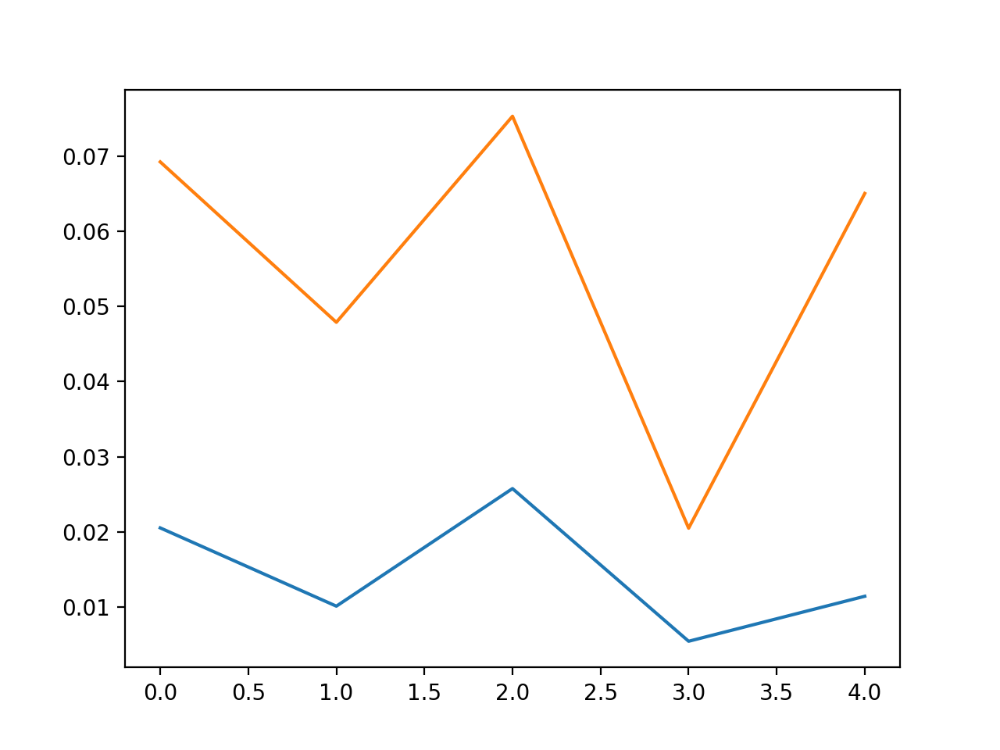

In [627]:
plt.figure()
# plt.plot(np.nanmean(vip_rs_fg[1][0][0],2).T,alpha=0.01)
for irun in range(2):
    plt.plot(np.nanmean(np.nanmean(vip_rs_fg[irun][0][0],2),0))

<IPython.core.display.Javascript object>


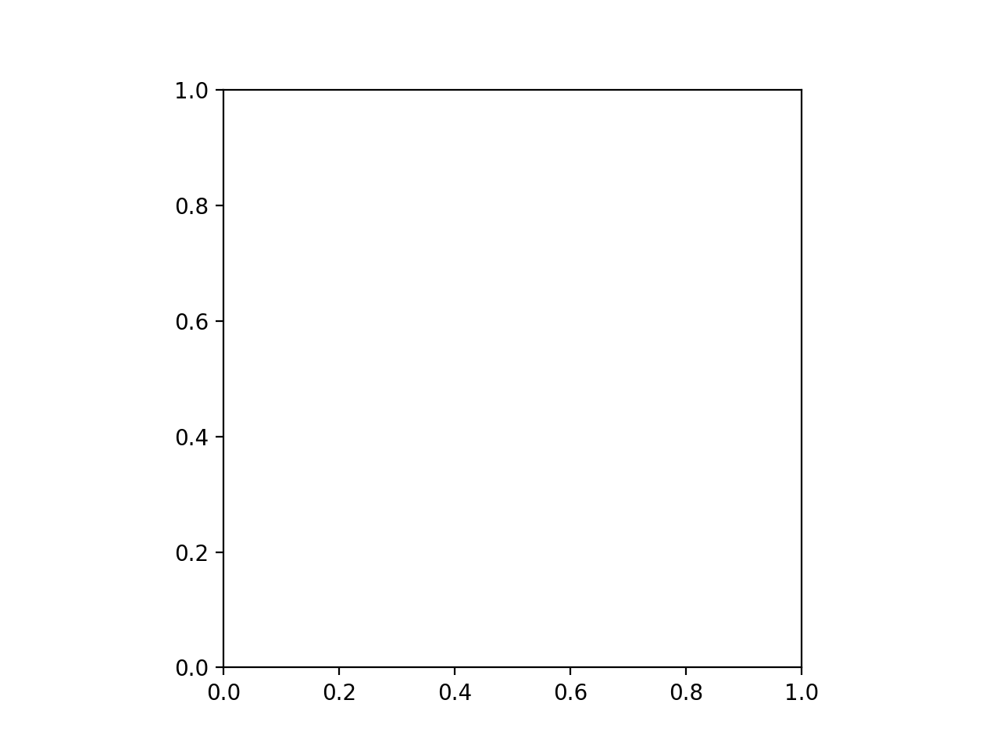

TypeError: Invalid shape () for image data

In [1299]:
irun = 0
itype = 1
ialign = 0 
plt.figure()
plt.imshow(np.nanmean(rs_ret[irun][itype][ialign]))

In [78]:
dsnames = [dsbase+x+'_data_struct.hdf5' for x in ['pyr_l4','pyr_l23','sst_l23','vip_l23','pv_l23']]
fnames = [dsname.split('/')[-1] for dsname in dsnames]
dsnames = ['/Users/dan/Documents/notebooks/mossing-PC/' + fname for fname in fnames]

In [79]:
dsnames

['/Users/dan/Documents/notebooks/mossing-PC/pyr_l4_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/pyr_l23_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/sst_l23_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/vip_l23_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/pv_l23_data_struct.hdf5']

In [107]:
for icelltype in range(5):
    with ut.hdf5read(dsnames[icelltype]) as ds:
        keylist = list(ds.keys())
        print(keylist)
        for key in keylist:
            partlist = list(ds[key].keys())
#             print(partlist)
            expttype1 = 'size_contrast_0'
            expttype2 = 'figure_ground_0'
            if expttype1 in partlist and expttype2 in partlist:
                print(ds[key][expttype1]['decon'].shape)
                print(ds[key][expttype2]['decon'].shape)
        print('\n')

['session_181127_M10073', 'session_190202_M10075', 'session_190304_M10077', 'session_190607_M10443', 'session_190620_M10616', 'session_190620_M10619', 'session_190624_M10615', 'session_190627_M10616', 'session_190701_M10615', 'session_191212_M0762']
(890, 1440, 24)
(890, 400, 24)
(1765, 1440, 24)
(1765, 400, 24)
(1314, 1440, 24)
(1314, 400, 24)
(1379, 2016, 24)
(1379, 800, 24)
(1500, 2016, 24)
(1500, 600, 24)
(1518, 2016, 24)
(1518, 800, 24)
(1449, 2016, 24)
(1449, 800, 24)


['session_181205_M10130', 'session_181209_M8536', 'session_181213_M8536', 'session_181214_M10130', 'session_190102_M10130', 'session_190128_M8982', 'session_190130_M9667', 'session_190131_M9355', 'session_190208_M9355', 'session_190212_M8536', 'session_191002_M0293', 'session_191108_M0403', 'session_200822_M0771']
(1688, 1400, 20)
(1688, 400, 20)
(1344, 1440, 24)
(1344, 400, 24)
(1316, 1440, 24)
(1316, 400, 24)
(1131, 1440, 24)
(1131, 400, 24)
(1445, 1440, 24)
(1445, 400, 24)
(959, 1440, 24)
(959, 400, 24)
(2270, 

In [1824]:
for icelltype in range(5):
    with ut.hdf5read(dsnames[icelltype]) as ds:
        keylist = list(ds.keys())
        for key in keylist:
            partlist = list(ds[key].keys())
            expttype1 = 'size_contrast_0'
            expttype2 = 'figure_ground_0'
            expttype3 = 'retinotopy_0'
            print(key)
            xmean = ds[key][expttype3]['stimulus_location_x_deg'][:].mean()
            ymean = ds[key][expttype3]['stimulus_location_y_deg'][:].mean()
            ret_center = np.array((xmean,ymean))
            if expttype1 in partlist and ds[key][expttype3]['stimulus_location_x_deg'][:].size==9:
                sc_center = ds[key][expttype1]['stim_offset_deg'][:]
#                 print(np.mean(np.abs(ret_center-sc_center)))
            if expttype1 in partlist and expttype2 in partlist:
                rfd1 = ds[key][expttype1]['rf_displacement_deg'][:]
                rfd2 = ds[key][expttype2]['rf_displacement_deg'][:]
                rfd3 = ds[key][expttype3]['rf_displacement_deg'][:] - ds[key][expttype1]['stim_offset_deg'][:][:,np.newaxis]
                print(np.mean(np.abs(rfd1-rfd2)))
                print(np.mean(np.abs(rfd1-rfd3)))
        print('\n')

session_181127_M10073
session_190202_M10075
0.0
0.0
session_190304_M10077
0.0
0.0
session_190607_M10443
0.0
0.0
session_190620_M10616
0.0
0.0
session_190620_M10619
0.0
0.0
session_190624_M10615
session_190627_M10616
0.0
0.0
session_190701_M10615
0.0
0.0
session_191212_M0762


session_181205_M10130
session_181209_M8536
0.0
0.0
session_181213_M8536
session_181214_M10130
session_190102_M10130
session_190128_M8982
0.0
0.0
session_190130_M9667
0.0
0.0
session_190131_M9355
0.0
0.0
session_190208_M9355
0.0
0.0
session_190212_M8536
0.0
0.0
session_191002_M0293
session_191108_M0403
session_200822_M0771
0.0
0.0


session_180713_M9053
0.0
0.0
session_180714_M9053
0.0
0.0
session_180802_M9053
session_180821_M9417
6.5
0.0
session_181117_M10039
0.0
0.0
session_181120_M10039
session_181121_M10039
session_191224_M0390
0.0
0.0
session_200109_M0755
0.0
0.0
session_200819_M0638
0.0
0.0


session_180321_M7955
session_180412_M7955
session_180516_M8956
0.0
0.0
session_180519_M8959
0.0
0.0
session_180528_M89

In [168]:
with ut.hdf5read(dsnames[2]) as ds:
    key = 'session_180821_M9417'
    key = 'session_181117_M10039'
    expttypes = ['retinotopy_0','size_contrast_0','figure_ground_0']
    for expttype in expttypes:
        print(list(ds[key][expttype].keys()))
    for expttype in expttypes:
        print(ds[key][expttype]['stim_offset_deg'][:])

['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_amplitude', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'rf_sigma', 'rf_sq_error', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_id', 'stimulus_location_x_deg', 'stimulus_location_y_deg', 'stimulus_parameters', 't_offset']
['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_contrast', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_parameters', 'stimulus_size_deg', 't_offset']
['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_parameters', 'stimulus_type', 't_offset']
[0 0]
[-8  0]
[-8  0]


In [74]:
dsnames

['/Users/dan/Documents/notebooks/mossing-PC/shared_data/vip_l23_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/shared_data/pv_l23_data_struct.hdf5']

In [56]:
for icelltype in range(5):
    with ut.hdf5read(dsnames[icelltype]) as ds:
        keylist = list(ds.keys())
        for key in keylist:
            partlist = list(ds[key].keys())
            expttype1 = 'size_contrast_0'
            expttype2 = 'figure_ground_0'
            if expttype1 in partlist and expttype2 in partlist:
                print(list(ds[key][expttype1].keys()))
#                 rv1 = ds[key][expttype1]['ret_vars'][:]
#                 rv2 = ds[key][expttype2]['ret_vars'][:]
#                 print(np.mean(np.abs(rfd1-rfd2)))
        print('\n')

['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'pupil_area_trialwise_pix', 'pupil_ctr_trialwise_pix', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_contrast', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_parameters', 'stimulus_size_deg', 't_offset']
['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'pupil_area_trialwise_pix', 'pupil_ctr_trialwise_pix', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_contrast', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_parameters', 'stimulus_size_deg', 't_offset']
['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_contrast', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_parameters', 'stimulu

In [119]:
icelltype,irun,iS

(2, 0, 0)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


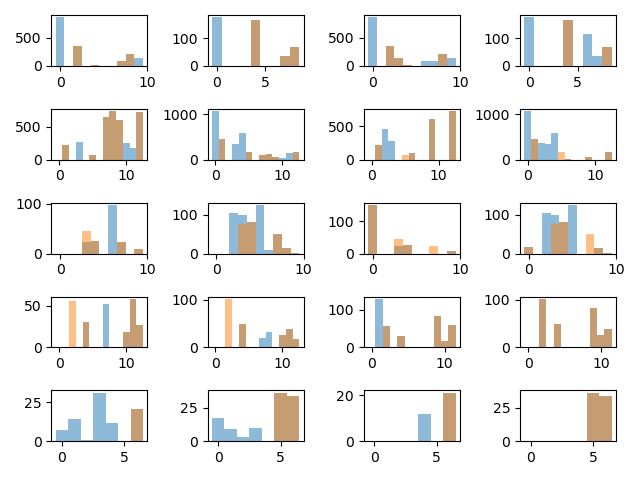

In [656]:
plt.figure()
for icelltype in range(5):
    for irun in range(2):
        for iS in range(2):
            plt.subplot(5,4,4*icelltype+2*irun+iS+1)
            plt.hist(expt_ids[irun][icelltype][iS],bins=np.arange(expt_ids[irun][icelltype][iS].max()+2)-0.5,alpha=0.5)
            plt.hist(expt_ids_fg[irun][icelltype][iS],bins=np.arange(expt_ids[irun][icelltype][iS].max()+2)-0.5,alpha=0.5)
plt.tight_layout()        
    

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


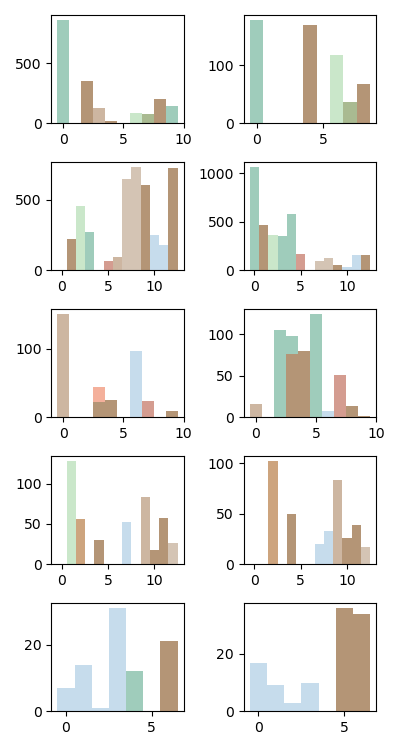

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


In [662]:
plt.figure(figsize=(4,7.5))
for icelltype in range(5):
    for irun in range(2):
        for iS in range(2):
            plt.subplot(5,2,2*icelltype+iS+1)
            plt.hist(expt_ids[irun][icelltype][iS],bins=np.arange(expt_ids[irun][icelltype][iS].max()+2)-0.5,alpha=0.25)
            plt.hist(expt_ids_fg[irun][icelltype][iS],bins=np.arange(expt_ids[irun][icelltype][iS].max()+2)-0.5,alpha=0.25)
plt.tight_layout()        

In [126]:
nS = 2
nT = 2
nN = 36
nP = 2
nQ = 4
ncelltypes = 5


<IPython.core.display.Javascript object>


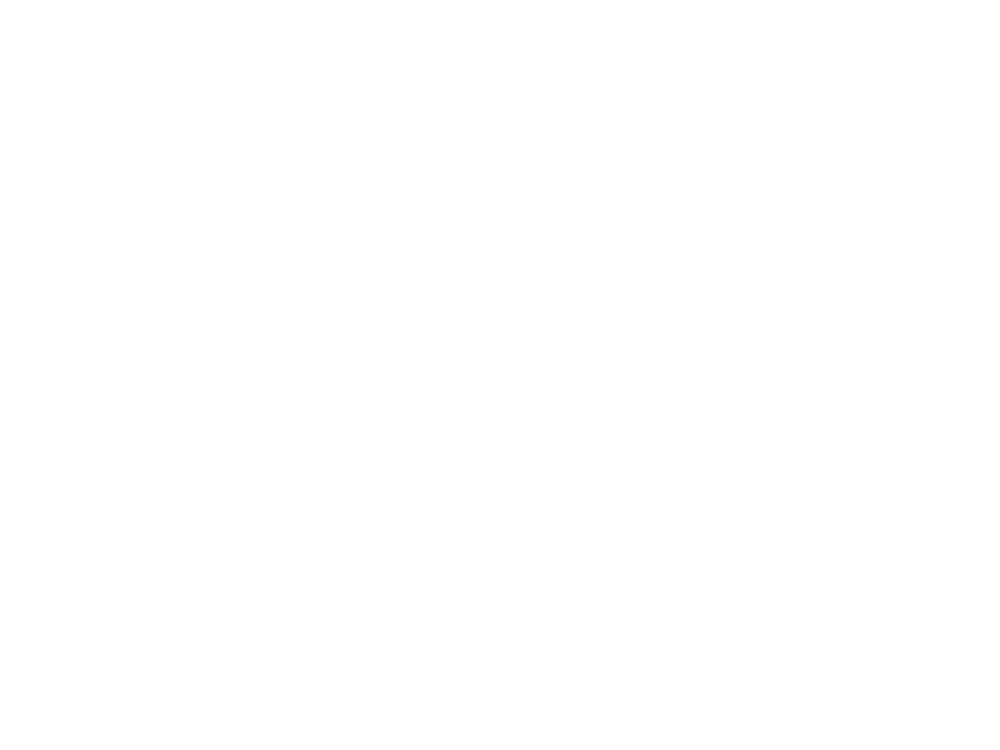

NameError: name 'rso' is not defined

In [21]:
irun = 0
plt.figure()
for itype in range(5):
    for ialign in range(2):
        plt.subplot(5,2,2*itype+ialign+1)
        plt.imshow(np.nanmean(np.nanmean(rso[irun][itype][ialign],3),0))

<IPython.core.display.Javascript object>


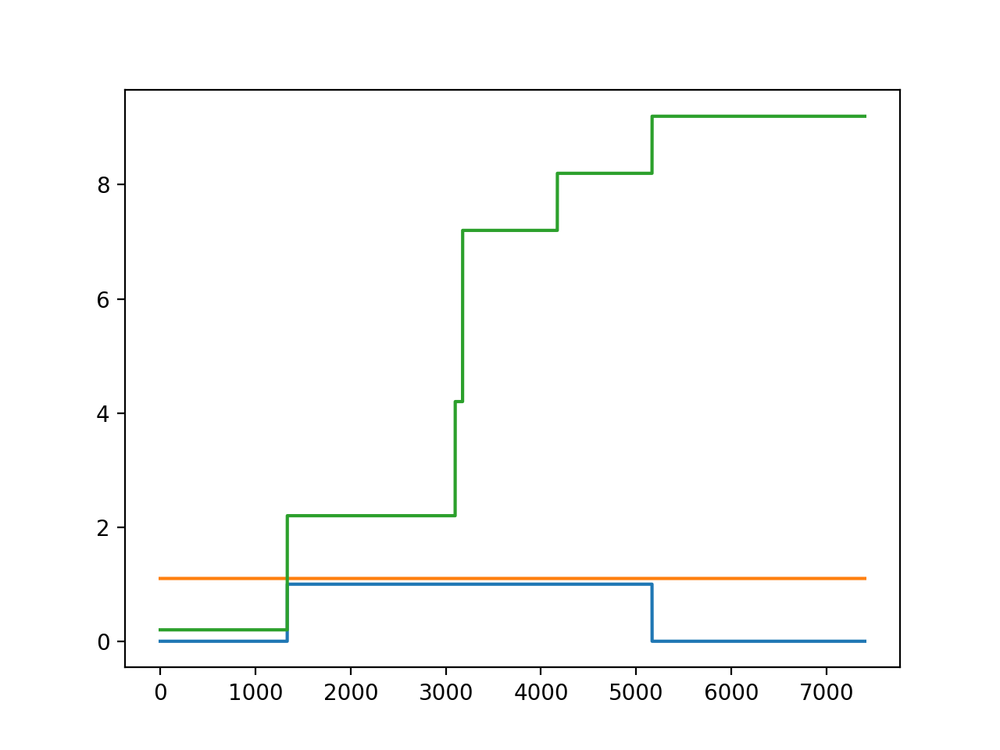

In [481]:
plt.figure()
plt.plot(~np.isnan(Rs_fg[0][0][:,0,0]))
plt.plot(~np.isnan(Rs[0][0][:,0,0,0])+0.1)
plt.plot(expt_ids[0][0][0]+0.2)

In [1879]:
reload(calnet.utils)
reload(ut)
nsize,ncontrast,ndir = 6,6,8
nstim_fg = 5 # number of figure-ground stims
ids_to_exclude = [np.array((2,3,3)),np.array((3,2,4))]
ori_dirs = [[0,4],[2,6]] #[[0,4],[1,3,5,7],[2,6]] #[np.arange(8)]#
nT = len(ori_dirs)
nS = len(rs[0][0])
irun = 0
# entry_fg = [np.array((0,0,2,2,0)),np.array((0,0,2,2,2))] # entry corresponding to the 0 degree direction 
entry_fg = [np.array((0,0,2,2,0)),np.array((0,0,2,2,0))] # entry corresponding to the 0 degree direction 
# for the grating on the "receptive field location" for this pixel
    
rso = [[[None,None] for i in range(len(rs[irun]))] for irun in range(2)]
rso_fg = [[[None,None] for i in range(len(rs[irun]))] for irun in range(2)]
expt_ids_all = [[None,None] for i in range(len(rs[0]))]

def submerge_running(arr_list):
    rs_r = list(zip(*arr_list))
    return rs_r

for _ in range(1):
    for iR,(trs,trs_fg,ei,ei_fg) in enumerate(zip(submerge_running(rs),submerge_running(rs_fg),submerge_running(expt_ids),submerge_running(expt_ids_fg))):
        if iR == 1:
            trs = submerge_running(l23_rs)[0]
            trs_fg = submerge_running(l23_rs_fg)[0]
            ei = submerge_running(l23_expt_ids)[0]
            ei_fg = submerge_running(l23_expt_ids_fg)[0]
        if True:
            print(iR)
            for ialign in range(nS):
#                 r_flat = r[ialign][:,:nsize,:].reshape((r[ialign].shape[0],-1))
#                 r_fg_flat = r_fg[ialign].reshape((r_fg[ialign].shape[0],-1))
                these_eis = [ei[irun][ialign] for irun in range(2)]
                these_eis_fg = [ei_fg[irun][ialign] for irun in range(2)]
                these_trs = [trs[irun][ialign] for irun in range(2)]
                these_trs_fg = [trs_fg[irun][ialign] for irun in range(2)]
                if iR in ids_to_exclude[0]:
                    these_ids_to_exclude = ids_to_exclude[1][ids_to_exclude[0]==iR]
                    these_trs = [these_trs[irun][~np.in1d(these_eis[irun],these_ids_to_exclude)] for irun in range(2)]
                    these_trs_fg = [these_trs_fg[irun][~np.in1d(these_eis_fg[irun],these_ids_to_exclude)] for irun in range(2)]
                    these_eis = [these_eis[irun][~np.in1d(these_eis[irun],these_ids_to_exclude)] for irun in range(2)]
                    these_eis_fg = [these_eis_fg[irun][~np.in1d(these_eis_fg[irun],these_ids_to_exclude)] for irun in range(2)]
                args = zip(these_trs+these_trs_fg,these_eis+these_eis_fg)
                rs_list,ei_all,ni_all = calnet.utils.align_all_by_neuron(*args)
                rs_neuron0,rs_neuron1,rs_fg_neuron0,rs_fg_neuron1 = rs_list
                rs_neuron_both = np.concatenate((rs_neuron0[:,np.newaxis],rs_neuron1[:,np.newaxis]),axis=1)
                rs_fg_neuron_both = np.concatenate((rs_fg_neuron0[:,np.newaxis],rs_fg_neuron1[:,np.newaxis]),axis=1)
                rs_fg_neuron_both = ut.circ_align_to_entry_axiswise(rs_fg_neuron_both,entry_fg[ialign],based_axis=2,entry_axis=3)
                expt_ids_all[iR][ialign] = ei_all
                rs_neuron_both[:,:,:,0,:] = np.nanmean(np.nanmean(rs_neuron_both[:,:,:,0,:],-1),-1)[:,:,np.newaxis,np.newaxis]
                rs_fg_neuron_both[:,:,0,:] = np.nanmean(rs_fg_neuron_both[:,:,0,:],-1)[:,:,np.newaxis]
                rs_neuron_both,rs_fg_neuron_both = opto_utils.sort_all_by_pref_dir(([rs_neuron_both],4),([rs_fg_neuron_both],3))
                for irun in range(2):
                    rso[irun][iR][ialign] = rs_neuron_both[0][:,irun]
                    rso_fg[irun][iR][ialign] = rs_fg_neuron_both[0][:,irun]

0
[857, 857, 0, 0]
[348, 348, 348, 348]
[0, 131, 0, 131]
[19, 19, 19, 19]
[0, 84, 0, 0]
[95, 95, 95, 0]
[201, 201, 201, 201]
[144, 144, 0, 0]


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/opto_utils.py:312: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/opto_utils.py:321: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rs_sort[ir][iroi] = rs_sort[ir][iroi][slicer]
/Users/dan/Documents/code/adesnal/opto_utils.py:324: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  others_sort

[177, 177, 0, 0]
[168, 168, 168, 168]
[0, 118, 0, 0]
[18, 18, 18, 0]
[68, 68, 68, 68]
1
[574, 574, 574, 574]
[0, 627, 0, 0]
[595, 595, 0, 0]
[220, 220, 0, 0]
[131, 0, 131, 131]
[0, 93, 0, 93]
[647, 0, 647, 0]
[798, 0, 798, 0]
[602, 602, 602, 602]
[252, 0, 0, 0]
[297, 0, 0, 0]
[801, 801, 801, 801]
[1065, 1065, 0, 0]
[110, 110, 110, 110]
[0, 192, 0, 0]
[27, 27, 0, 0]
[361, 361, 0, 0]
[107, 0, 107, 107]
[0, 6, 0, 6]
[100, 0, 100, 0]
[60, 0, 60, 0]
[51, 51, 51, 51]
[39, 0, 0, 0]
[39, 0, 0, 0]
[82, 82, 82, 82]
2
[0, 151, 0, 151]
[105, 105, 0, 0]
[73, 73, 73, 73]
[78, 78, 0, 0]
[97, 0, 0, 0]
[55, 0, 55, 55]
[13, 13, 13, 13]
[9, 9, 9, 9]
[0, 16, 0, 16]
[33, 33, 33, 33]
[46, 46, 0, 0]
[8, 0, 0, 0]
[20, 0, 20, 20]
[1, 1, 1, 1]
3
[0, 111, 0, 0]
[52, 0, 0, 0]
[0, 134, 0, 134]
[18, 18, 18, 18]
[58, 58, 58, 58]
[27, 0, 27, 0]
[0, 17, 0, 0]
[20, 0, 0, 0]
[33, 0, 0, 0]
[0, 33, 0, 33]
[26, 26, 26, 26]
[39, 39, 39, 39]
[17, 0, 17, 0]
4
[2, 0, 0, 0]
[14, 0, 0, 0]
[2, 0, 0, 0]
[31, 0, 0, 0]
[12, 12, 0, 0

In [1668]:
expt_ids_all[2][0].shape

(581,)

<IPython.core.display.Javascript object>


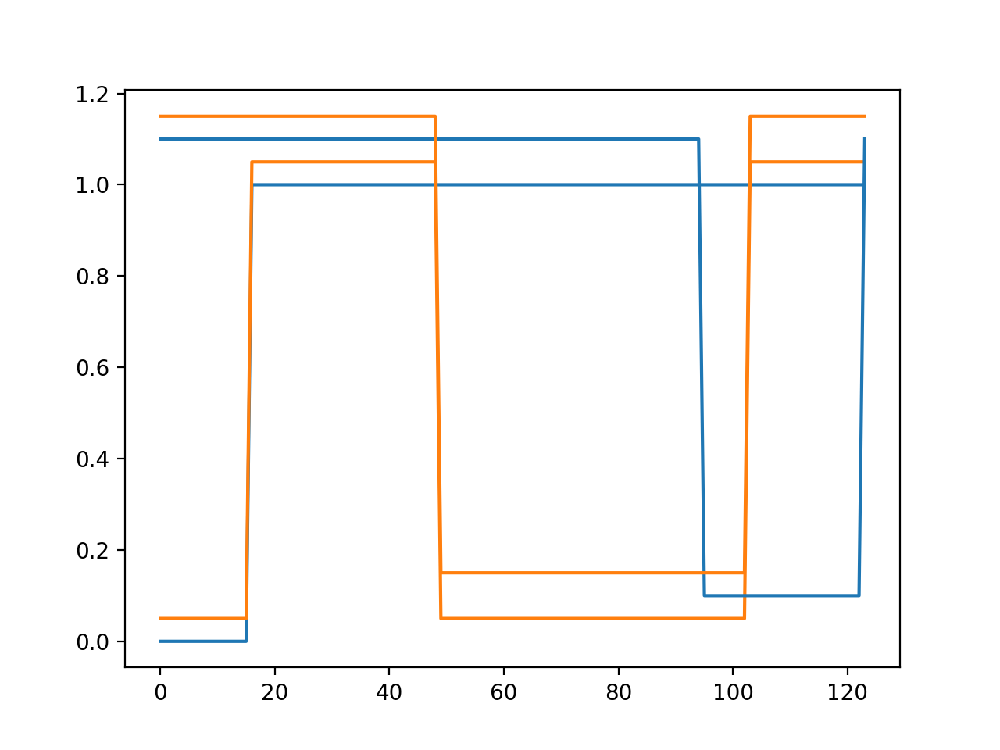

In [1691]:
iR,ialign = 2,1
plt.figure()
delta = 0.05
for irun in range(2):
    plt.plot(((~np.isnan(rso[irun][iR][ialign])).sum(1).sum(1).sum(1)>0)+2*delta*irun,c='C0')
    plt.plot(((~np.isnan(rso_fg[irun][iR][ialign])).sum(1).sum(1)>0)+2*delta*irun+delta,c='C1')
# expt_ids_all[iR][ialign].shape

In [1434]:
rrs = [submerge_running(rr) for rr in [rs,rs_fg,rs_ret]]
rrs = submerge_running(rrs)

In [227]:
pdb.pm()

> /Users/dan/Documents/code/adesnal/opto_utils.py(324)sort_all_by_pref_dir()
-> other_slicers[iother][other_ori_axes[iother]] = order
(Pdb) [len(os) for os in other_slicers]
[3, 2, 2]
(Pdb) other_ori_axes[iother]
3
(Pdb) exit


In [1477]:
args[0][1]

array([0., 0., 0., ..., 9., 9., 9.])

In [97]:
reload(calnet.utils)
reload(ut)
nsize,ncontrast,ndir = 6,6,8
nstim_fg = 5 # number of figure-ground stims
ids_to_exclude = [np.array((2,3,3)),np.array((3,2,4))]
ori_dirs = [[0,4],[2,6]] #[[0,4],[1,3,5,7],[2,6]] #[np.arange(8)]#
nT = len(ori_dirs)
nS = len(rs[0][0])
irun = 0
# entry_fg = [np.array((0,0,2,2,0)),np.array((0,0,2,2,2))] # entry corresponding to the 0 degree direction 
entry_fg = [np.array((0,0,2,2,0)),np.array((0,0,2,2,0))] # entry corresponding to the 0 degree direction 
# for the grating on the "receptive field location" for this pixel
    
rso = [[[None,None] for i in range(len(rs[irun]))] for irun in range(2)]
rso_fg = [[[None,None] for i in range(len(rs[irun]))] for irun in range(2)]
rso_ret = [[[None,None] for i in range(len(rs[irun]))] for irun in range(2)]
expt_ids_all = [[None,None] for i in range(len(rs[0]))]

def submerge_top_level(arr_list):
    rs_r = list(zip(*arr_list))
    return rs_r

rrs = submerge_top_level([submerge_top_level(rr) for rr in [rs,rs_fg,rs_ret_avg]])
eeis = submerge_top_level([submerge_top_level(eei) for eei in [expt_ids,expt_ids_fg,expt_ids_ret]])

startat = 0

for _ in range(1):
    for iR,(trs,eis) in enumerate(zip(rrs[startat:],eeis[startat:])):
#         if iR == 1:
#             trs[:2] = [submerge_top_level(rr)[0] for rr in [l23_rs,l23_rs_fg,l23_rs_ret_avg]]
#             eis = [submerge_top_level(eei)[0] for eei in [l23_expt_ids,l23_expt_ids_fg,l23_expt_ids_ret]]
#             trs_fg = submerge_running(l23_rs_fg)[0]
#             ei = submerge_running(l23_expt_ids)[0]
#             ei_fg = submerge_running(l23_expt_ids_fg)[0]
        if True:
            print(iR)
            for ialign in range(nS):
                these_eis = [[ei[irun][ialign] for irun in range(2)] for ei in eis]
                these_trs = [[tr[irun][ialign] for irun in range(2)] for tr in trs]
                if iR in ids_to_exclude[0]:
                    these_ids_to_exclude = ids_to_exclude[1][ids_to_exclude[0]==iR]
                    for itr in range(len(these_eis)):
                        these_trs[itr] = [these_trs[itr][irun][~np.in1d(these_eis[itr][irun],these_ids_to_exclude)] for irun in range(2)]
                        these_eis[itr] = [these_eis[itr][irun][~np.in1d(these_eis[itr][irun],these_ids_to_exclude)] for irun in range(2)]
                these_trl = []
                list(map(these_trl.extend,these_trs))
                these_eil = []
                list(map(these_eil.extend,these_eis))
                args = list(zip(these_trl,these_eil))
                rs_list,ei_all,ni_all = calnet.utils.align_all_by_neuron(*args)
                rs_neuron_both_list = [np.concatenate((r0[:,np.newaxis],r1[:,np.newaxis]),axis=1) for r0,r1 in zip(rs_list[0::2],rs_list[1::2])]
                rs_neuron_both,rs_fg_neuron_both,rs_ret_neuron_both = rs_neuron_both_list
                rs_fg_neuron_both = ut.circ_align_to_entry_axiswise(rs_fg_neuron_both,entry_fg[ialign],based_axis=2,entry_axis=3)
                expt_ids_all[iR][ialign] = ei_all
                rs_neuron_both[:,:,:,0,:] = np.nanmean(np.nanmean(rs_neuron_both[:,:,:,0,:],-1),-1)[:,:,np.newaxis,np.newaxis]
                rs_fg_neuron_both[:,:,0,:] = np.nanmean(rs_fg_neuron_both[:,:,0,:],-1)[:,:,np.newaxis]
                rs_neuron_both,rs_fg_neuron_both = opto_utils.sort_all_by_pref_dir(([rs_neuron_both],4),([rs_fg_neuron_both],3))
                for irun in range(2):
                    rso[irun][iR][ialign] = rs_neuron_both[0][:,irun]
                    rso_fg[irun][iR][ialign] = rs_fg_neuron_both[0][:,irun]
                    rso_ret[irun][iR][ialign] = rs_ret_neuron_both[:,irun]

0
[439, 439, 0, 0, 439, 439]
[178, 178, 178, 178, 178, 178]
[0, 84, 0, 84, 0, 84]
[32, 32, 32, 32, 32, 32]
[0, 50, 0, 0, 0, 50]
[38, 38, 38, 0, 38, 0]
[139, 139, 139, 139, 0, 139]
[61, 61, 0, 0, 61, 61]
[595, 595, 0, 0, 595, 595]
[170, 170, 170, 170, 170, 170]
[0, 47, 0, 47, 0, 47]
[155, 155, 155, 155, 155, 155]
[0, 152, 0, 0, 0, 152]
[75, 75, 75, 0, 75, 0]
[130, 130, 130, 130, 0, 130]
[83, 83, 0, 0, 83, 83]
1
[325, 325, 325, 325, 325, 325]
[0, 405, 0, 0, 405, 405]
[378, 378, 0, 0, 378, 0]
[148, 148, 0, 0, 148, 0]
[90, 0, 90, 90, 90, 0]
[0, 39, 0, 39, 0, 39]
[368, 0, 368, 0, 368, 0]
[415, 0, 415, 0, 415, 0]
[460, 460, 460, 460, 0, 460]
[118, 0, 0, 0, 118, 0]
[152, 0, 0, 0, 152, 0]
[464, 464, 464, 464, 464, 0]
[1065, 1065, 0, 0, 1065, 0]
[359, 359, 359, 359, 359, 359]
[0, 414, 0, 0, 414, 414]
[244, 244, 0, 0, 244, 0]
[433, 433, 0, 0, 433, 0]
[148, 0, 148, 148, 148, 0]
[0, 60, 0, 60, 0, 60]
[379, 0, 379, 0, 379, 0]
[443, 0, 443, 0, 443, 0]
[193, 193, 193, 193, 0, 193]
[173, 0, 0, 0, 173,

In [55]:
def decompose_HW(this_data):
    nrow,ncol = this_data.shape
    normH_factor = np.nanmean(this_data,1)
    this_data_norm = this_data/normH_factor[:,np.newaxis]
    nan_msk = ~np.isnan(this_data_norm)
    def cost(H,W):
        return np.sum((this_data_norm - H[:,np.newaxis]*W[np.newaxis,:])[nan_msk]**2)
    def cost_(x):
        return cost(x[:nrow],x[nrow:nrow+ncol])
    H0 = np.ones((nrow,))
    W0 = np.nanmean(this_data_norm,0)
    W0[np.isnan(W0)] = 0
    
#     H = H0.copy()
#     W = W0.copy()
#     W = np.linalg.pinv(H[:,np.newaxis]) @ this_data_norm
#     H = this_data_norm @ np.linalg.pinv(W[np.newaxis,:])
#     return H,W
    
    x0 = np.concatenate((H0,W0),axis=0)
    bounds = [(0,np.inf) for _ in x0]
    fprime = grad(cost_)
    x,val,res = sop.fmin_l_bfgs_b(cost_,x0,fprime=fprime,bounds=bounds)
    H,W = x[:nrow],x[nrow:nrow+ncol]
    print('%f; %f'%(cost(H,W),cost(H0,W0)))
    normW_factor = np.mean(W)
    H = H*normH_factor*normW_factor
    W = W/normW_factor
#     print(res['success'])
    return H,W,res

def decompose_HWUV(this_data,V,H0,W0,U0):
    nrow,ncol = this_data.shape
    ndim = V.shape[0]
    normH_factor = np.nanmean(this_data,1)
    this_data_norm = this_data/normH_factor[:,np.newaxis]
    nan_msk = ~np.isnan(this_data_norm)
    print([np.sum(np.isnan(x)) for x in [H0,W0,U0]])
    
    def cost(H,W,U):
#         return np.sum((this_data_norm - H[:,np.newaxis]*W[np.newaxis,:])[nan_msk]**2)
        return np.sum((this_data_norm - H[:,np.newaxis]*(W[np.newaxis,:] + U @ V))[nan_msk]**2)
    def cost_(x):
        amplitude = x[:nrow]
        mean_tuning = x[nrow:nrow+ncol]
        u = x[nrow+ncol:nrow+ncol+nrow*ndim].reshape((nrow,ndim))
        return cost(amplitude,mean_tuning,u)
    
    x0 = np.concatenate((H0,W0,U0.flatten()),axis=0)
    bounds = [(0,np.inf) for _ in x0[:nrow+ncol]] + [(-np.inf,np.inf) for _ in x0[nrow+ncol:]]
    fprime = grad(cost_)
    x,val,res = sop.fmin_l_bfgs_b(cost_,x0,fprime=fprime,bounds=bounds)
    print(res)
    H,W,U = x[:nrow],x[nrow:nrow+ncol],x[nrow+ncol:].reshape((nrow,ndim))
    print('%f; %f'%(cost(H,W,U),cost(H0,W0,U0)))
    normW_factor = np.mean(W)
    H = H*normH_factor*normW_factor
    W = W/normW_factor
    U = U/normW_factor
#     print(res['success'])
    return H,W,U,res

In [56]:
def sum_to_1(r):
    R = r.reshape((r.shape[0],-1))
    most_non_nan = np.mean(~np.isnan(R),axis=1)>0.75
    all_snn_non_nan = np.isnan(R[most_non_nan]).sum(0)==0
    print((most_non_nan.mean(),all_snn_non_nan.mean(),np.isnan(R[most_non_nan]).mean(0).min()))
    R = R/np.nansum(R[:,all_snn_non_nan],axis=1)[:,np.newaxis]
    return R

def norm_to_mean(r):
    R = r.reshape((r.shape[0],-1))
    most_non_nan = np.mean(~np.isnan(R),axis=1)>0.75
    all_snn_non_nan = np.isnan(R[most_non_nan]).sum(0)==0
    print((most_non_nan.mean(),all_snn_non_nan.mean(),np.isnan(R[most_non_nan]).mean(0).min()))
    R = R/np.nanmean(R[:,all_snn_non_nan],axis=1)[:,np.newaxis]
    return R

def norm_ignore_nans(r):
    R = r.reshape((r.shape[0],-1))
    amplitude,mean_tuning,res = decompose_HW(R)
    Rnorm = R/amplitude[:,np.newaxis]
    return Rnorm,amplitude,mean_tuning

def pinv_ignore_nans(r,V,amplitude0,mean_tuning0,U0):
    R = r.reshape((r.shape[0],-1))
    amplitude,mean_tuning,U,res = decompose_HWUV(R,V,amplitude0,mean_tuning0,U0)
    Rnorm = R/amplitude[:,np.newaxis]
#     print(res)
    return Rnorm,amplitude,mean_tuning,U

def pinv_ignore_nans(r,V):
    R = r.reshape((r.shape[0],-1))
    amplitude,mean_tuning,U,res = decompose_HWUV(R,V,amplitude0,mean_tuning0,U0)
    Rnorm = R/amplitude[:,np.newaxis]
#     print(res)
    return U

def nancov(r):
    R = r.reshape((r.shape[0],-1))
    Rcov = np.zeros((R.shape[1],R.shape[1]),dtype='float')
    n_non_nan = np.zeros((R.shape[1],R.shape[1]),dtype='int')
    for iR in range(R.shape[0]): # for each neuron
        vec_non_nan = (~np.isnan(R[iR])) # find the stims for which the tuning curve is non-nan
        if vec_non_nan.sum()>0:
            full_to_add = np.zeros(((R.shape[1],R.shape[1])))
            to_add = R[iR,vec_non_nan][:,np.newaxis]*R[iR,vec_non_nan][np.newaxis,:]
            bool_mat = (vec_non_nan[:,np.newaxis] & vec_non_nan[np.newaxis,:])
            full_to_add.flat[np.where(bool_mat.flat)[0]] = to_add.flat
            Rcov = Rcov + full_to_add
            n_non_nan = n_non_nan + (bool_mat)
    Rcov = Rcov/n_non_nan
    return Rcov

ndims = 5

Rso = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]
Rso_fg = [[[None,None] for i in range(len(rso_fg[irun]))] for irun in range(2)]
Rso_mean = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]
Rso_cov = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]
# Rso_weights = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]

for irun in range(2):
    for iR,(r,r_fg) in enumerate(zip(rso[irun],rso_fg[irun])):
        if iR<5:
            print(iR)
            for ialign in range(nS):
                r_flat = r[ialign][:,:nsize,:].reshape((r[ialign].shape[0],-1))
                r_fg_flat = r_fg[ialign].reshape((r_fg[ialign].shape[0],-1))
                this_data = np.concatenate((r_flat,r_fg_flat),axis=1)
                # 1. fit amplitude, mean tuning
                # 2. divide by amplitude, subtract mean tuning
                this_summed_data,amplitude,mean_tuning = norm_ignore_nans(this_data)
                # 3. compute nancov
                rcov = nancov(this_summed_data-mean_tuning[np.newaxis,:])
                rcov[np.isnan(rcov)] = 0
                # 4. perform svd on nancov: s, v
                u,s,v = np.linalg.svd(rcov)
                
#                 # 5. re-optimize the other variables with s, v fixed
#                 V = (np.diag(s[:ndims]) @ v[:ndims,:])
#                 amplitude0,mean_tuning0,U0 = amplitude.copy(),mean_tuning.copy(),np.zeros((amplitude.shape[0],ndims))
#                 amplitude0[np.isnan(amplitude0)] = 0
#                 this_summed_data,amplitude,mean_tuning,U = pinv_ignore_nans(this_data,V,amplitude0,mean_tuning0,U0)
                
#                 rcov = nancov(this_summed_data-mean_tuning[np.newaxis,:])
#                 # 4. perform svd on nancov: s, v
#                 u,s,v = np.linalg.svd(rcov)
                
#                 V = (np.diag(s[:ndims]) @ v[:ndims,:])
#                 amplitude0,mean_tuning0,U0 = amplitude.copy(),mean_tuning.copy(),np.zeros((amplitude.shape[0],ndims))
#                 amplitude0[np.isnan(amplitude0)] = 0
#                 this_summed_data,amplitude,mean_tuning,U = pinv_ignore_nans(this_data,V,amplitude0,mean_tuning0,U0)

                Rso[irun][iR][ialign] = this_summed_data[:,:r_flat.shape[1]].reshape(r_flat.shape[:1]+r[ialign].shape[1:])
                Rso_fg[irun][iR][ialign] = this_summed_data[:,r_flat.shape[1]:].reshape(r_flat.shape[:1]+r_fg[ialign].shape[1:])
                Rso_mean[irun][iR][ialign] = mean_tuning
                Rso_cov[irun][iR][ialign] = [(np.sqrt(s[idim]),v[idim]) for idim in range(ndims)]
#                 Rso_weights[irun][iR][ialign] = [U[:,idim] for idim in range(ndims)]

rso_run = submerge_running(rso)
rso_run_fg = submerge_running(rso_fg)
            
Rso_run = [[None,None] for i in range(len(rso_run))]
Rso_run_fg = [[None,None] for i in range(len(rso_run_fg))]
Rso_mean_run = [[None,None] for i in range(len(rso_run))]
Rso_cov_run = [[None,None] for i in range(len(rso_run))]

for iR,(r,r_fg) in enumerate(zip(rso_run,rso_run_fg)):
    if True:
        print(iR)
        for ialign in range(nS):
            r_flat = np.concatenate([r[irun][ialign][:,:nsize,:].reshape((r[irun][ialign].shape[0],-1)) for irun in range(2)],axis=1)
            r_fg_flat = np.concatenate([r_fg[irun][ialign].reshape((r_fg[irun][ialign].shape[0],-1)) for irun in range(2)],axis=1)
            this_data = np.concatenate((r_flat,r_fg_flat),axis=1)
            # 1. fit amplitude, mean tuning
            # 2. divide by amplitude, subtract mean tuning
            this_summed_data,amplitude,mean_tuning = norm_ignore_nans(this_data)
            # 3. compute nancov
            rcov = nancov(this_summed_data-mean_tuning[np.newaxis,:])
            rcov[np.isnan(rcov)] = 0
            # 4. perform svd on nancov: s, v
            u,s,v = np.linalg.svd(rcov)
#             un,sn,vn = np.linalg.svd(rncov)
            Rso_run[iR][ialign] = this_summed_data[:,:r_flat.shape[1]].reshape(r_flat.shape[:1]+(2,)+r[0][ialign].shape[1:])
            Rso_run_fg[iR][ialign] = this_summed_data[:,r_flat.shape[1]:].reshape(r_flat.shape[:1]+(2,)+r_fg[0][ialign].shape[1:])
            Rso_mean_run[iR][ialign] = mean_tuning
            Rso_cov_run[iR][ialign] = [(np.sqrt(s[idim]),v[idim]) for idim in range(ndims)]
            

0


KeyboardInterrupt: 

In [67]:
expt_ids_all[0][0].shape


(9414, 6, 6, 8)

In [70]:
rso[irun][0][0].shape
rso_fg[irun][0][0].shape

(9414, 5, 8)

In [98]:
def sum_to_1(r):
    R = r.reshape((r.shape[0],-1))
    most_non_nan = np.mean(~np.isnan(R),axis=1)>0.75
    all_snn_non_nan = np.isnan(R[most_non_nan]).sum(0)==0
    print((most_non_nan.mean(),all_snn_non_nan.mean(),np.isnan(R[most_non_nan]).mean(0).min()))
    R = R/np.nansum(R[:,all_snn_non_nan],axis=1)[:,np.newaxis]
    return R

def norm_to_mean(r):
    R = r.reshape((r.shape[0],-1))
    most_non_nan = np.mean(~np.isnan(R),axis=1)>0.75
    all_snn_non_nan = np.isnan(R[most_non_nan]).sum(0)==0
    print((most_non_nan.mean(),all_snn_non_nan.mean(),np.isnan(R[most_non_nan]).mean(0).min()))
    R = R/np.nanmean(R[:,all_snn_non_nan],axis=1)[:,np.newaxis]
    return R

def norm_ignore_nans(r):
    R = r.reshape((r.shape[0],-1))
    amplitude,mean_tuning,res = decompose_HW(R)
    Rnorm = R/amplitude[:,np.newaxis]
    return Rnorm,amplitude,mean_tuning

def norm_ignore_nans_by_expt(this_data,ei_all):
    uei = np.unique(ei_all)
    this_data_expt = np.zeros((len(uei),)+this_data.shape[1:])
    for iei,this_ei in enumerate(uei):
        this_data_expt[iei] = np.nanmean(this_data[ei_all==this_ei],0)
    _,amplitude,mean_tuning = norm_ignore_nans(this_data_expt)
    this_summed_data = np.zeros_like(this_data)
    for iei,this_ei in enumerate(uei):
        this_summed_data[ei_all==this_ei] = this_data[ei_all==this_ei]/amplitude[iei]
    return this_summed_data,amplitude,mean_tuning

def pinv_ignore_nans(r,V,amplitude0,mean_tuning0,U0):
    R = r.reshape((r.shape[0],-1))
    amplitude,mean_tuning,U,res = decompose_HWUV(R,V,amplitude0,mean_tuning0,U0)
    Rnorm = R/amplitude[:,np.newaxis]
#     print(res)
    return Rnorm,amplitude,mean_tuning,U

def pinv_ignore_nans(r,V):
    R = r.reshape((r.shape[0],-1))
    amplitude,mean_tuning,U,res = decompose_HWUV(R,V,amplitude0,mean_tuning0,U0)
    Rnorm = R/amplitude[:,np.newaxis]
#     print(res)
    return U

def nancov(r):
    R = r.reshape((r.shape[0],-1))
    Rcov = np.zeros((R.shape[1],R.shape[1]),dtype='float')
    n_non_nan = np.zeros((R.shape[1],R.shape[1]),dtype='int')
    for iR in range(R.shape[0]):
        vec_non_nan = (~np.isnan(R[iR]))
        if vec_non_nan.sum()>0:
            full_to_add = np.zeros(((R.shape[1],R.shape[1])))
            to_add = R[iR,vec_non_nan][:,np.newaxis]*R[iR,vec_non_nan][np.newaxis,:]
            bool_mat = (vec_non_nan[:,np.newaxis] & vec_non_nan[np.newaxis,:])
            full_to_add.flat[np.where(bool_mat.flat)[0]] = to_add.flat
            Rcov = Rcov + full_to_add
            n_non_nan = n_non_nan + (bool_mat)
    Rcov = Rcov/n_non_nan
    return Rcov

norm_by_expt = True

ndims = 5

Rso = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]
Rso_fg = [[[None,None] for i in range(len(rso_fg[irun]))] for irun in range(2)]
Rso_ret = [[[None,None] for i in range(len(rso_ret[irun]))] for irun in range(2)]
Rso_mean = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]
Rso_cov = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]
# Rso_weights = [[[None,None] for i in range(len(rso[irun]))] for irun in range(2)]

for irun in range(2):
    for iR,(r,r_fg,r_ret,ei_all) in enumerate(zip(rso[irun],rso_fg[irun],rso_ret[irun],expt_ids_all)):
        if iR<5:
            print(iR)
            for ialign in range(nS):
                r_flat = r[ialign][:,:nsize,:].reshape((r[ialign].shape[0],-1))
                r_fg_flat = r_fg[ialign].reshape((r_fg[ialign].shape[0],-1))
                r_ret_flat = r_ret[ialign]
                this_data = np.concatenate((r_flat,r_fg_flat,r_ret_flat),axis=1)
                if norm_by_expt:
                    this_summed_data,amplitude,mean_tuning = norm_ignore_nans_by_expt(this_data,ei_all[ialign])
                    # 1. fit amplitude, mean tuning
                    # 2. divide by amplitude, subtract mean tuning
                else:
                    this_summed_data,amplitude,mean_tuning = norm_ignore_nans(this_data)
                # 3. compute nancov
                rcov = nancov(this_summed_data-mean_tuning[np.newaxis,:])
                rcov[np.isnan(rcov)] = 0
                # 4. perform svd on nancov: s, v
                u,s,v = np.linalg.svd(rcov)
                
#                 # 5. re-optimize the other variables with s, v fixed
#                 V = (np.diag(s[:ndims]) @ v[:ndims,:])
#                 amplitude0,mean_tuning0,U0 = amplitude.copy(),mean_tuning.copy(),np.zeros((amplitude.shape[0],ndims))
#                 amplitude0[np.isnan(amplitude0)] = 0
#                 this_summed_data,amplitude,mean_tuning,U = pinv_ignore_nans(this_data,V,amplitude0,mean_tuning0,U0)
                
#                 rcov = nancov(this_summed_data-mean_tuning[np.newaxis,:])
#                 # 4. perform svd on nancov: s, v
#                 u,s,v = np.linalg.svd(rcov)
                
#                 V = (np.diag(s[:ndims]) @ v[:ndims,:])
#                 amplitude0,mean_tuning0,U0 = amplitude.copy(),mean_tuning.copy(),np.zeros((amplitude.shape[0],ndims))
#                 amplitude0[np.isnan(amplitude0)] = 0
#                 this_summed_data,amplitude,mean_tuning,U = pinv_ignore_nans(this_data,V,amplitude0,mean_tuning0,U0)

                Rso[irun][iR][ialign] = this_summed_data[:,:r_flat.shape[1]].reshape(r_flat.shape[:1]+r[ialign].shape[1:])
                Rso_fg[irun][iR][ialign] = this_summed_data[:,r_flat.shape[1]:r_flat.shape[1]+r_fg_flat.shape[1]].reshape(r_flat.shape[:1]+r_fg[ialign].shape[1:])
                Rso_ret[irun][iR][ialign] = this_summed_data[:,r_flat.shape[1]+r_fg_flat.shape[1]:].reshape(r_flat.shape[:1]+r_ret[ialign].shape[1:])
                Rso_mean[irun][iR][ialign] = mean_tuning
                Rso_cov[irun][iR][ialign] = [(np.sqrt(s[idim]),v[idim]) for idim in range(ndims)]
#                 Rso_weights[irun][iR][ialign] = [U[:,idim] for idim in range(ndims)]

rso_run = submerge_top_level(rso)
rso_run_fg = submerge_top_level(rso_fg)
rso_run_ret = submerge_top_level(rso_ret)
            
Rso_run = [[None,None] for i in range(len(rso_run))]
Rso_run_fg = [[None,None] for i in range(len(rso_run_fg))]
Rso_run_ret = [[None,None] for i in range(len(rso_run_ret))]
Rso_mean_run = [[None,None] for i in range(len(rso_run))]
Rso_cov_run = [[None,None] for i in range(len(rso_run))]

for iR,(r,r_fg,r_ret,ei_all) in enumerate(zip(rso_run,rso_run_fg,rso_run_ret,expt_ids_all)):
    if True:
        print(iR)
        for ialign in range(nS):
            r_flat = np.concatenate([r[irun][ialign][:,:nsize,:].reshape((r[irun][ialign].shape[0],-1)) for irun in range(2)],axis=1)
            r_fg_flat = np.concatenate([r_fg[irun][ialign].reshape((r_fg[irun][ialign].shape[0],-1)) for irun in range(2)],axis=1)
            r_ret_flat = np.concatenate([r_ret[irun][ialign].reshape((r_ret[irun][ialign].shape[0],-1)) for irun in range(2)],axis=1)
            this_data = np.concatenate((r_flat,r_fg_flat,r_ret_flat),axis=1)
            # 1. fit amplitude, mean tuning
            # 2. divide by amplitude, subtract mean tuning
            if norm_by_expt:
                this_summed_data,amplitude,mean_tuning = norm_ignore_nans_by_expt(this_data,ei_all[ialign])
                    # 1. fit amplitude, mean tuning
                    # 2. divide by amplitude, subtract mean tuning
            else:
                this_summed_data,amplitude,mean_tuning = norm_ignore_nans(this_data)            
            # 3. compute nancov
            rcov = nancov(this_summed_data-mean_tuning[np.newaxis,:])
            rcov[np.isnan(rcov)] = 0
            # 4. perform svd on nancov: s, v
            u,s,v = np.linalg.svd(rcov)
#             un,sn,vn = np.linalg.svd(rncov)
            Rso_run[iR][ialign] = this_summed_data[:,:r_flat.shape[1]].reshape(r_flat.shape[:1]+(2,)+r[0][ialign].shape[1:])
            Rso_run_fg[iR][ialign] = this_summed_data[:,r_flat.shape[1]:r_flat.shape[1]+r_fg_flat.shape[1]].reshape(r_flat.shape[:1]+(2,)+r_fg[0][ialign].shape[1:])
            Rso_run_ret[iR][ialign] = this_summed_data[:,r_flat.shape[1]+r_fg_flat.shape[1]:].reshape(r_flat.shape[:1]+(2,)+r_ret[0][ialign].shape[1:])
            Rso_mean_run[iR][ialign] = mean_tuning
            Rso_cov_run[iR][ialign] = [(np.sqrt(s[idim]),v[idim]) for idim in range(ndims)]
            

0
296.956255; 304.280308
151.149157; 151.896514
1
285.567148; 306.836697
294.846767; 301.082105
2
532.931546; 560.330918
537.737673; 675.632061
3
483.722162; 504.825959
234.858774; 239.603987
4
324.904985; 335.417244
527.045858; 533.161510
0
578.538075; 600.608727
286.480586; 292.998913
1
384.674343; 408.924151
341.026615; 367.688842
2
484.735594; 493.935334


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:61: RuntimeWarning: invalid value encountered in true_divide


668.423952; 724.584221
3
134.848290; 137.488947
113.482058; 116.934978
4
61.808637; 63.072380
167.027632; 177.074082
0
912.467988; 960.873644
474.162744; 505.053854
1
810.934287; 1095.488970
720.717425; 940.196330
2
1254.352692; 1310.995804
1505.702943; 1617.992424
3
532.458518; 828.295035
302.061562; 539.449187
4
382.365232; 442.546250
716.576585; 755.925810


In [ ]:
irun,itype,ialign = 0,1,0
idim = 1
plt.figure()
nvals = 5
vals = np.linspace(-0.5,0.5,nvals)
for idim in range(3):
    u = Rso_weights[irun][itype][ialign][idim]
    this_data = rso[irun][itype][ialign]
    for ival in range(nvals-1):
        plt.subplot(3,nvals-1,(nvals-1)*idim+ival+1)
        lb,ub = vals[ival],vals[ival+1]
        this_rg = (u<ub) & (u>lb)
        plt.imshow(np.nanmean(np.nanmean(this_data[this_rg],0),2))

<IPython.core.display.Javascript object>


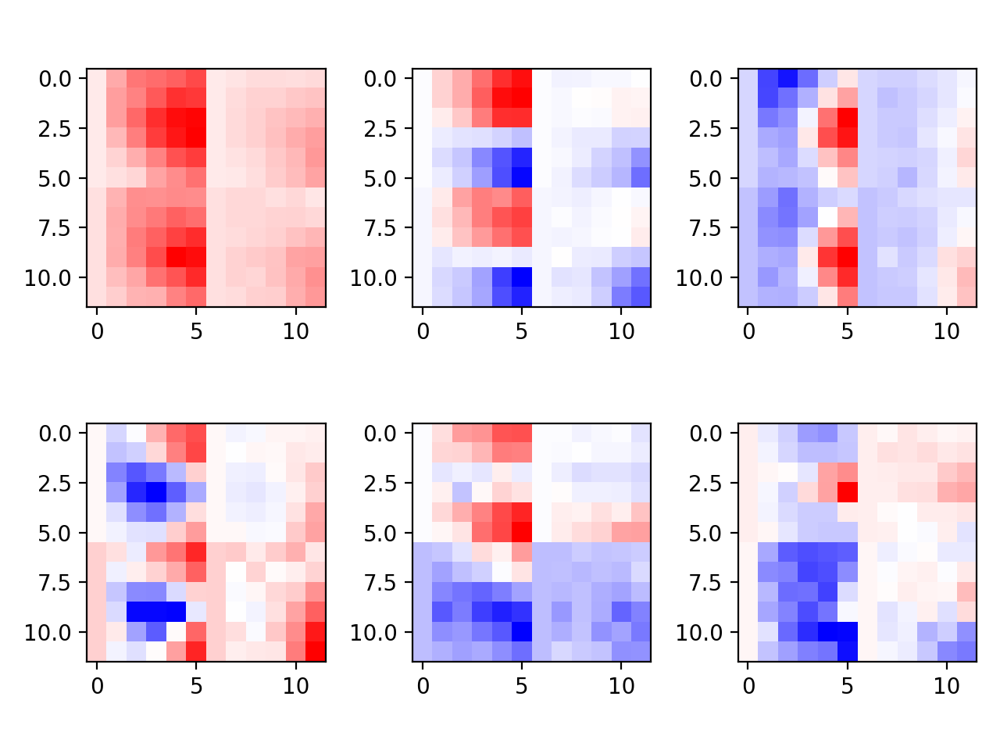

<IPython.core.display.Javascript object>


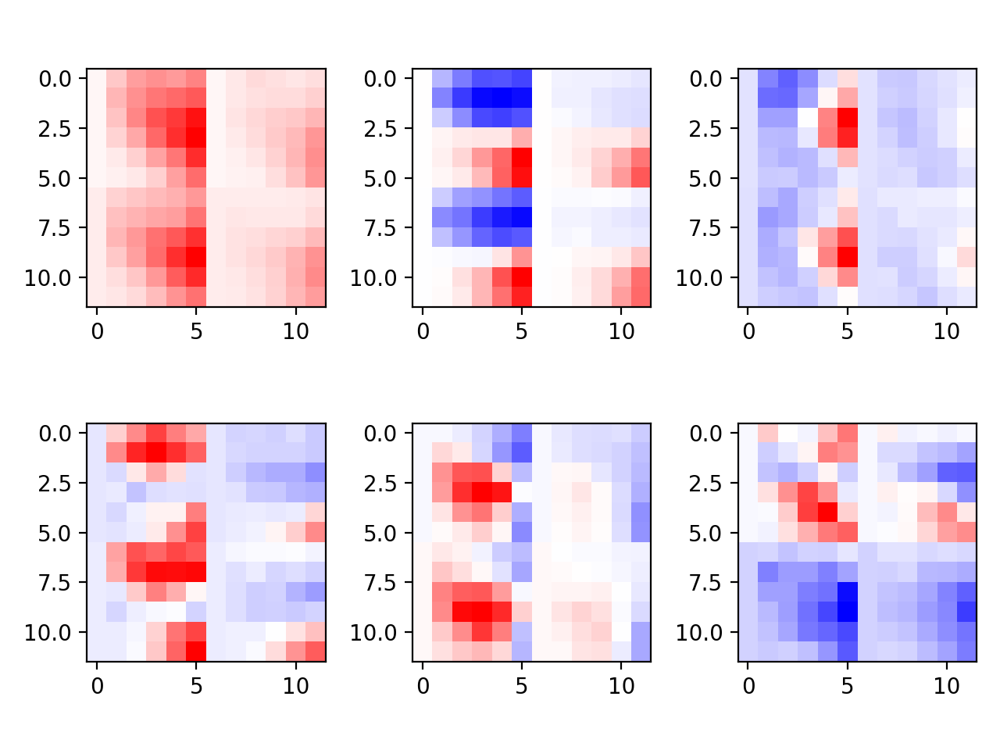

<IPython.core.display.Javascript object>


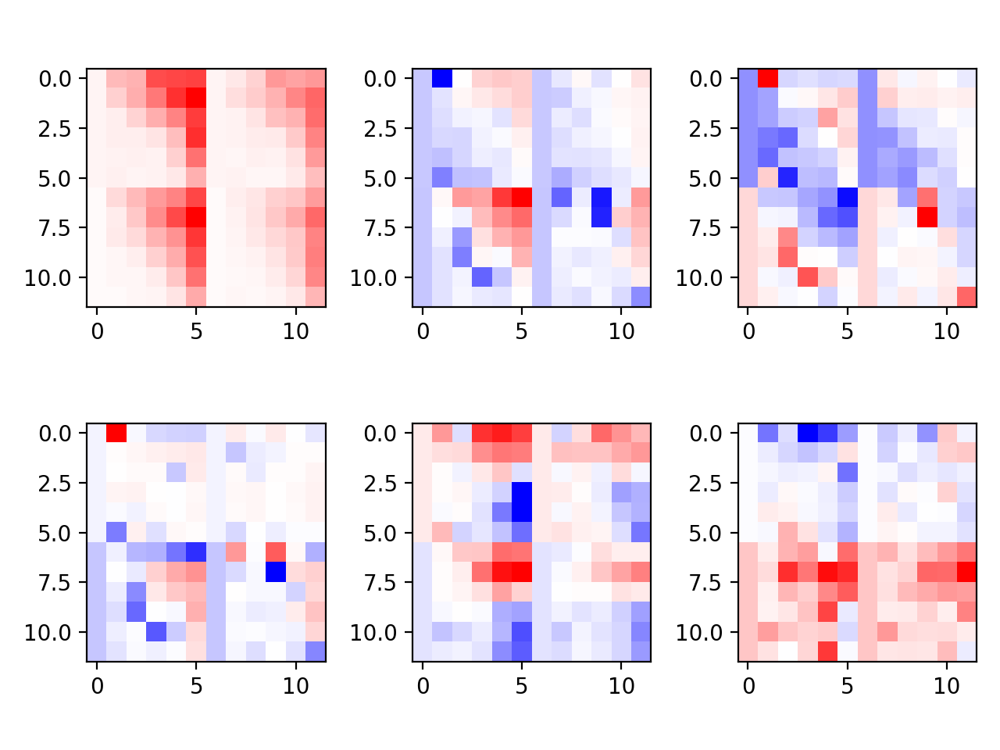

<IPython.core.display.Javascript object>


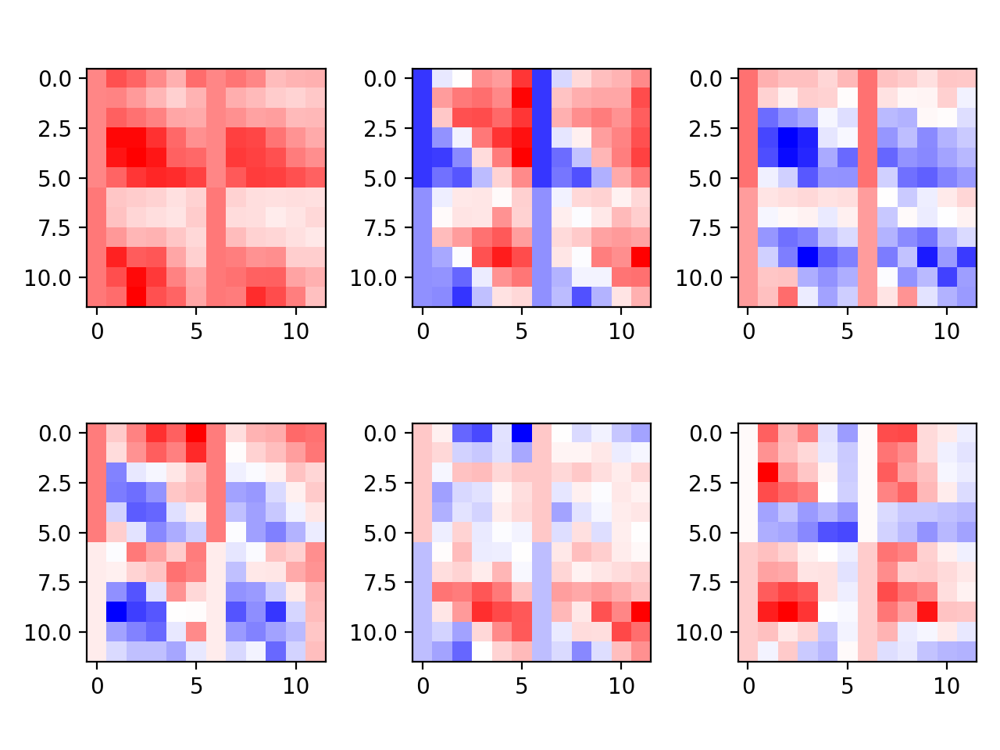

<IPython.core.display.Javascript object>


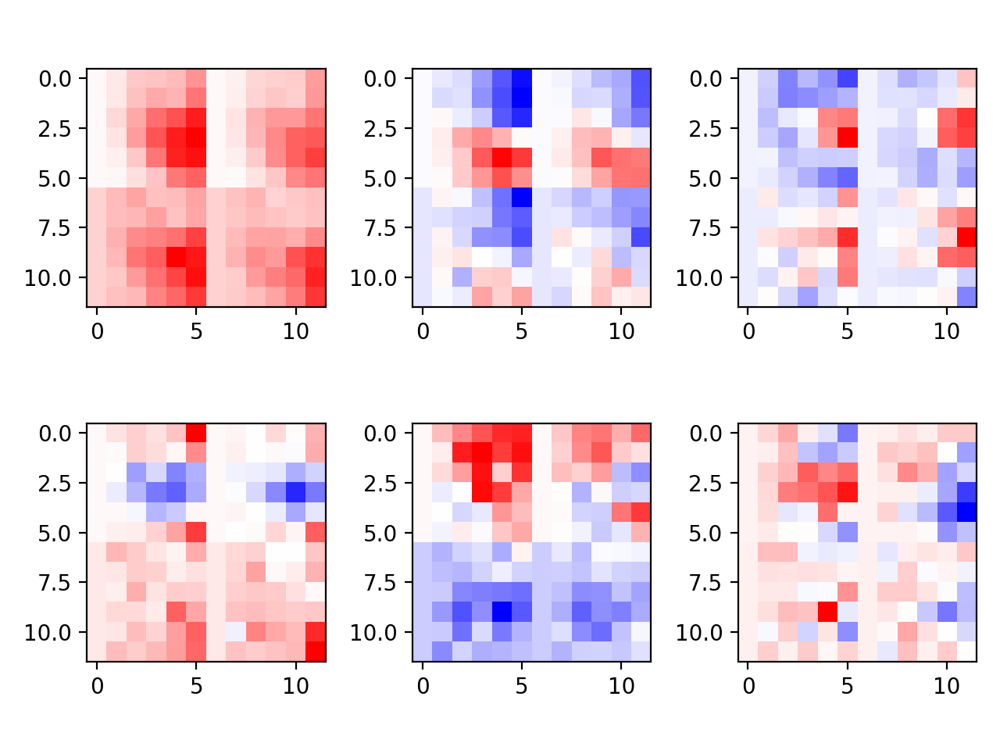

In [35]:
def ori_pixellate(r):
    R = r.reshape((6,6,8))
    ori_dirs = [[0,4],[2,6]]
    pixellated = np.zeros(R.shape[:2]+(len(ori_dirs),))
    for iod,od in enumerate(ori_dirs):
        pixellated[:,:,iod] = np.nanmean(R[:,:,od],2)
    pixellated = pixellated.transpose((0,2,1)).reshape((pixellated.shape[0],pixellated.shape[1]*pixellated.shape[2]))
    return pixellated
def norm(r):
    return r/np.abs(r).max()
plt.close('all')
ialign = 0
for itype in range(5):
    plt.figure()
    plt.subplot(2,3,1)
    non_running_data = ori_pixellate(Rso_mean_run[itype][ialign][:6*6*8])
    running_data = ori_pixellate(Rso_mean_run[itype][ialign][6*6*8:2*6*6*8])
    ut.imshow_hot_cold(np.flipud(np.concatenate((norm(non_running_data),norm(running_data)),axis=0)))
    # non_running_data = Rso_mean_run[itype][ialign][:6*6*8].reshape((6,6,8))
    # running_data = np.nanmean(Rso_mean_run[itype][ialign][6*6*8:2*6*6*8].reshape((6,6,8)),2)
    # ut.imshow_hot_cold(np.flipud(np.concatenate((non_running_data,running_data),axis=1)))
    for idim in range(5):
        plt.subplot(2,3,idim+1+1)
        non_running_data = ori_pixellate(Rso_cov_run[itype][ialign][idim][1][:6*6*8])
        running_data = ori_pixellate(Rso_cov_run[itype][ialign][idim][1][6*6*8:2*6*6*8])
        ut.imshow_hot_cold(np.flipud(np.concatenate((norm(non_running_data),norm(running_data)),axis=0)))
    #     non_running_data = np.nanmean(Rso_cov_run[itype][ialign][idim][1][:6*6*8].reshape((6,6,8)),2)
    #     running_data = np.nanmean(Rso_cov_run[itype][ialign][idim][1][6*6*8:2*6*6*8].reshape((6,6,8)),2)
    #     ut.imshow_hot_cold(np.flipud(np.concatenate((non_running_data,running_data),axis=1)))
    #     ut.imshow_hot_cold(np.flipud(np.nanmean(Rso_cov[irun][itype][ialign][idim][1][:6*6*8].reshape((6,6,8)),2)))
    plt.tight_layout()
itype = 1
# plt.figure()
# # for idim in range(1):
# #     plt.hist(Rso_weights[irun][itype][ialign][idim],bins=np.linspace(-1,1,200),alpha=0.5)
# x,y = [Rso_weights[irun][itype][ialign][idim] for idim in range(2)]
# plt.scatter(x,y,s=1,alpha=0.25)
# plt.axhline(0,c='k',linestyle='dashed')
# plt.axvline(0,c='k',linestyle='dashed')
# plt.figure()
# bins = np.linspace(-0.5,0.5,20)
# h,_,_ = np.histogram2d(x,y,bins=bins)
# # plt.imshow(h/h.sum(1)[:,np.newaxis])
# plt.imshow(np.flipud(h.T/h.T.sum(1)[:,np.newaxis]))

In [1749]:
Rso_cov_run[itype][ialign][idim][1].shape

(666,)

In [79]:
Rso_mean_run[itype][ialign].shape

(666,)

<IPython.core.display.Javascript object>


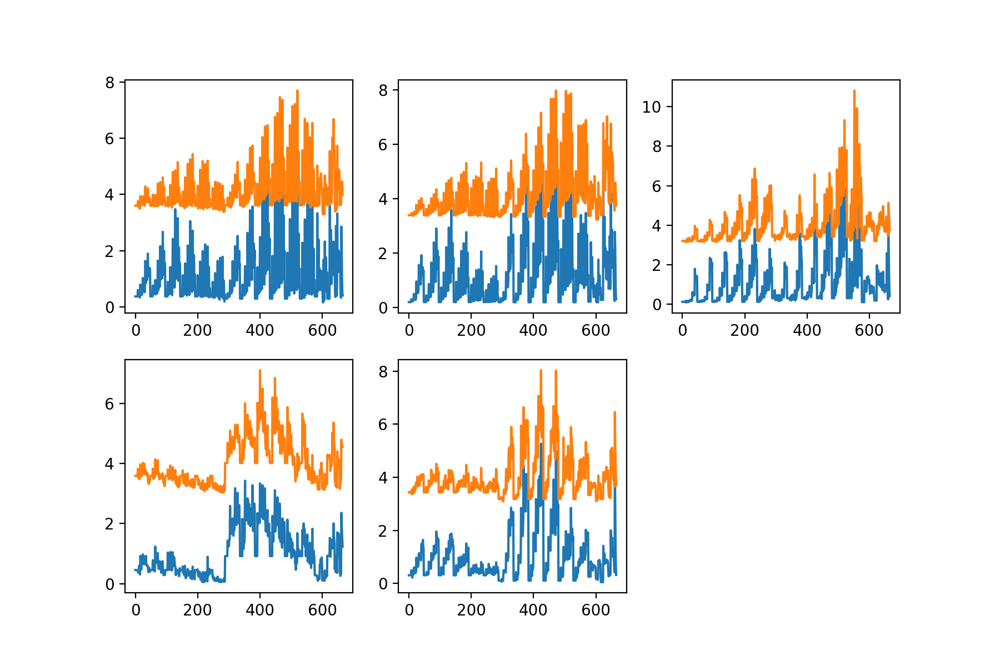

In [99]:
plt.figure(figsize=(9,6))
for itype in range(5):
    plt.subplot(2,3,itype+1)
    for ialign in range(2):
        plt.plot(Rso_mean_run[itype][ialign]+3*ialign) #[:-50]

In [ ]:
print(s)
print(sn)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


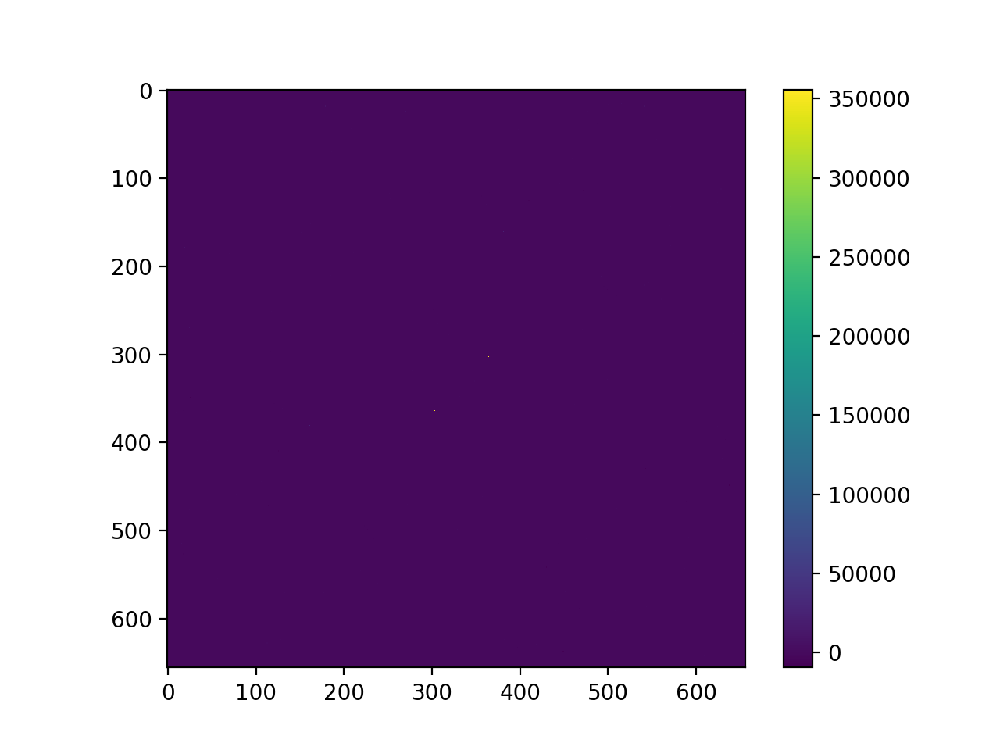

In [1092]:
u,s,v = np.linalg.svd(rcov)
ndims = 5
plt.figure()
plt.imshow(rcov)
plt.imshow((rcov - (v[:ndims,:].T @ np.diag(s[:ndims]) @ v[:ndims,:]))**1/rcov**1)
plt.colorbar()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


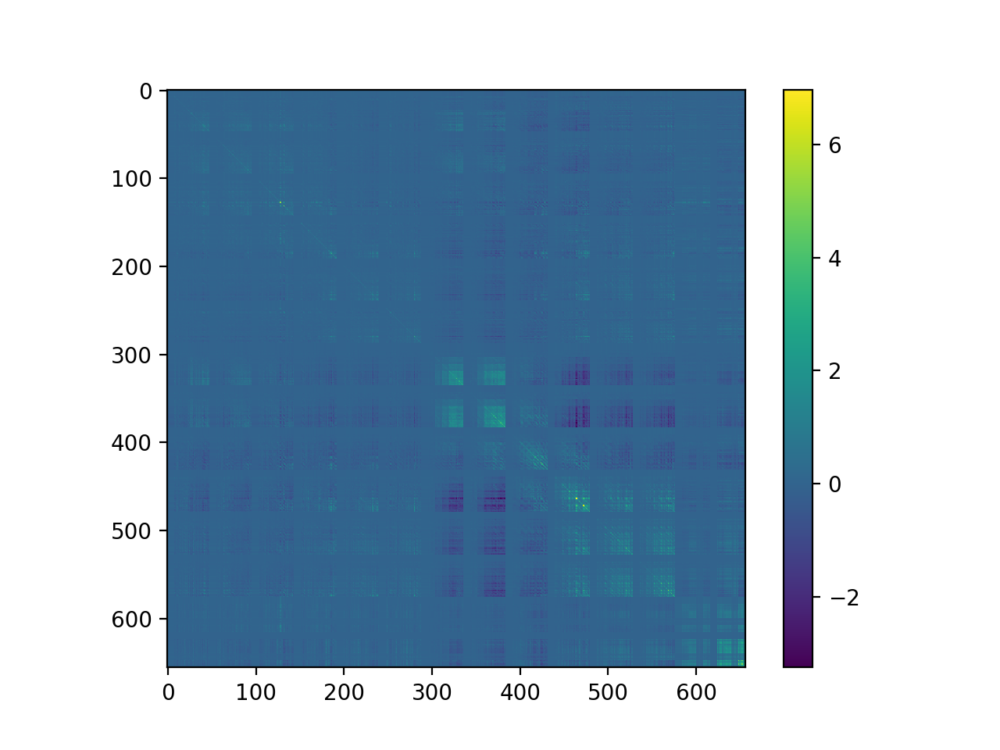

In [1101]:
plt.figure()
plt.imshow(rcov)
plt.colorbar()

In [1094]:
this_summed_data.shape

(109, 656)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


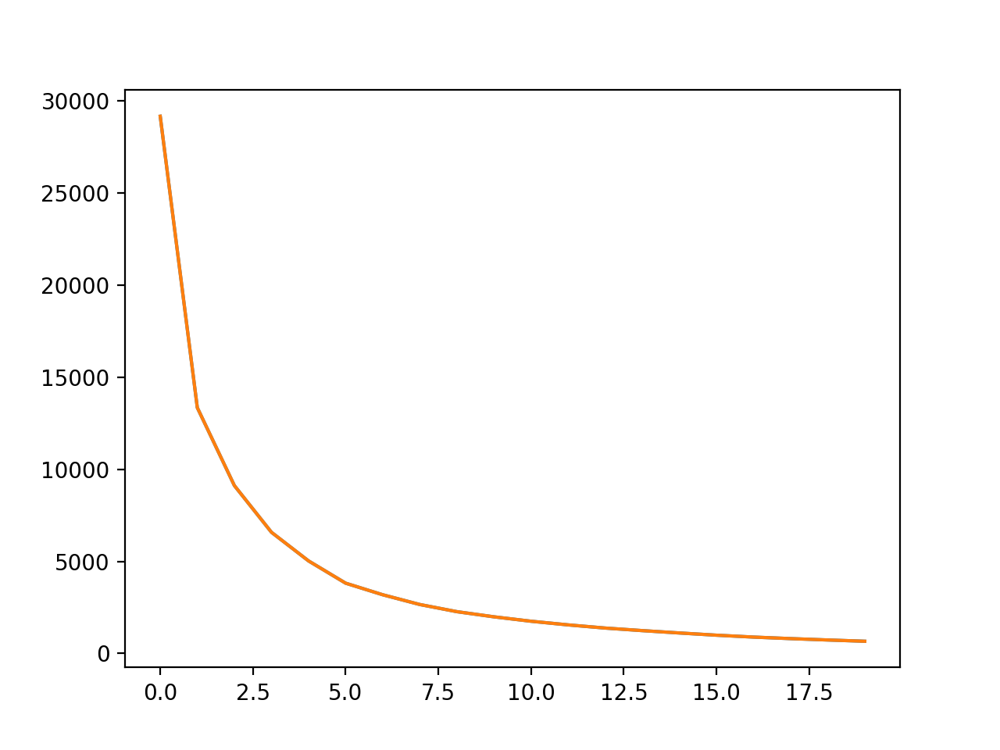

In [1114]:
u,s,v = np.linalg.svd(rcov)
ndims = 5
plt.figure()
# plt.imshow(rcov)
# plt.plot(np.array([np.sum((rcov - rcov.T)**2) for ndims in range(100)]))
plt.plot(np.array([np.sum((rcov - (u[:,:ndims] @ np.diag(s[:ndims]) @ v[:ndims,:]))**2) for ndims in range(20)]))
plt.plot(np.array([np.sum((rcov - (v[:ndims,:].T @ np.diag(s[:ndims]) @ v[:ndims,:]))**2) for ndims in range(20)]))
# plt.colorbar()

In [1031]:
pca = sklearn.decomposition.PCA(n_components=ndims)
pca.fit()

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [1111]:
np.array([np.nanmax(Rso_cov[irun][itype][ialign][idim][0]) for idim in range(5)])

array([6.56094651, 6.20450382, 5.75386361, 3.83155747, 3.50544691])

<IPython.core.display.Javascript object>


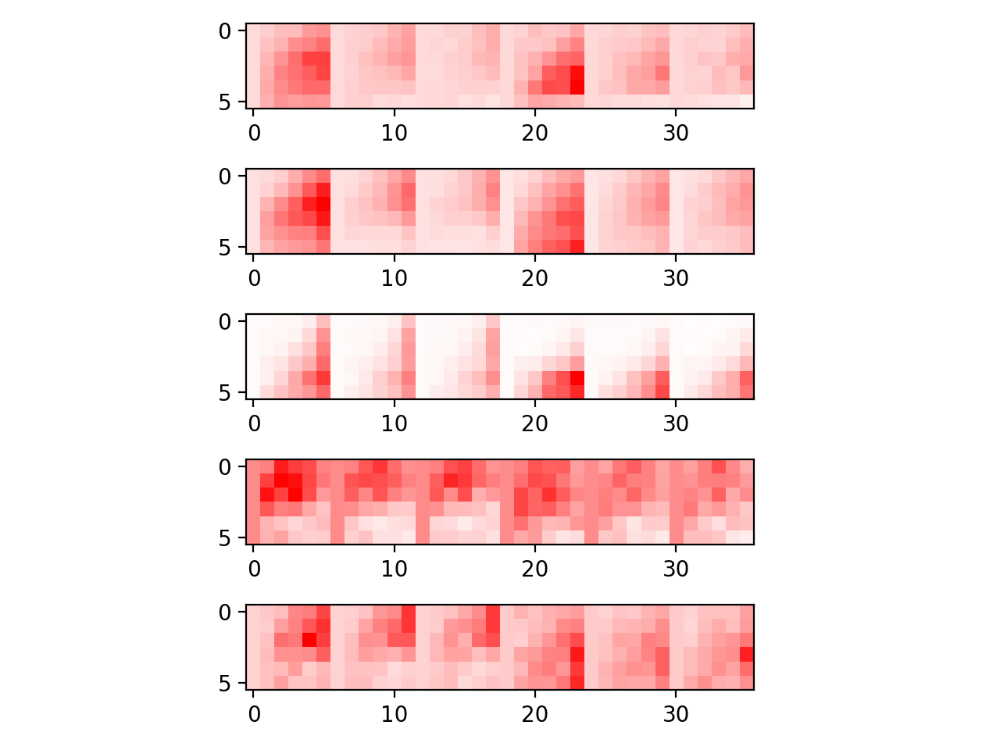

<IPython.core.display.Javascript object>


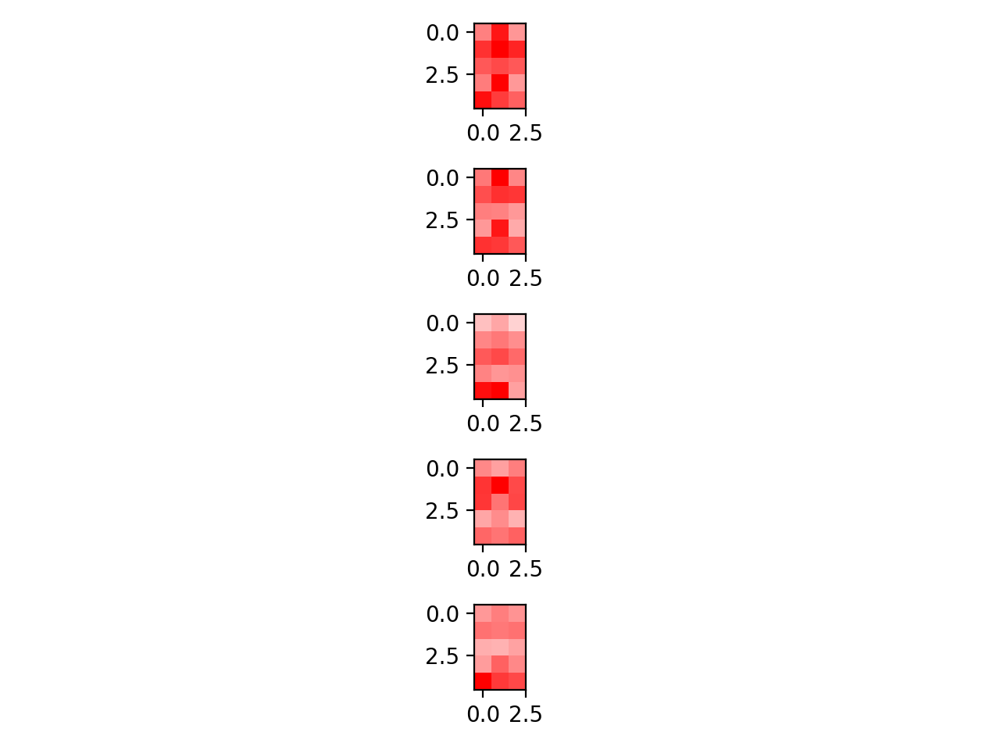

In [1898]:
plt.figure()
irun = 0
ialign = 0
# idim = 0
for itype in range(5):
    mx = np.sqrt(np.nanmax(np.array([np.nanmax(Rso_mean[irun][itype][ialign]) for idim in range(5)])))
    plt.subplot(5,1,itype+1)
#         val = np.sqrt(Rso_cov[irun][itype][ialign][idim][0])
    dirs = [[0,4],[1,3,5,7],[2,6]]
    to_show = []
    for ialign in range(2):
        vec = Rso_mean[irun][itype][ialign]
    #     plt.title('%.1f'%val)
        to_show = to_show + [np.nanmean(vec[:6*6*8].reshape((6,6,8))[:,:,this_dir],2) for this_dir in dirs]
    to_show = np.concatenate(to_show,axis=1)
    ut.imshow_hot_cold(to_show)
plt.tight_layout()

plt.figure()
irun = 0
ialign = 0
# idim = 0
for itype in range(5):
    mx = np.nanmax(Rso_mean[irun][itype][ialign])
    plt.subplot(5,1,itype+1)
#         val = np.sqrt(Rso_cov[irun][itype][ialign][idim][0])
    vec = Rso_mean[irun][itype][ialign]
#     plt.title('%.1f'%val)
    dirs = [[0,4],[1,3,5,7],[2,6]]
    to_show = [np.nanmean(vec[-5*8:].reshape((5,8))[:,this_dir],1)[:,np.newaxis] for this_dir in dirs]
    to_show = np.concatenate(to_show,axis=1)
    ut.imshow_hot_cold(to_show)
plt.tight_layout()

<IPython.core.display.Javascript object>


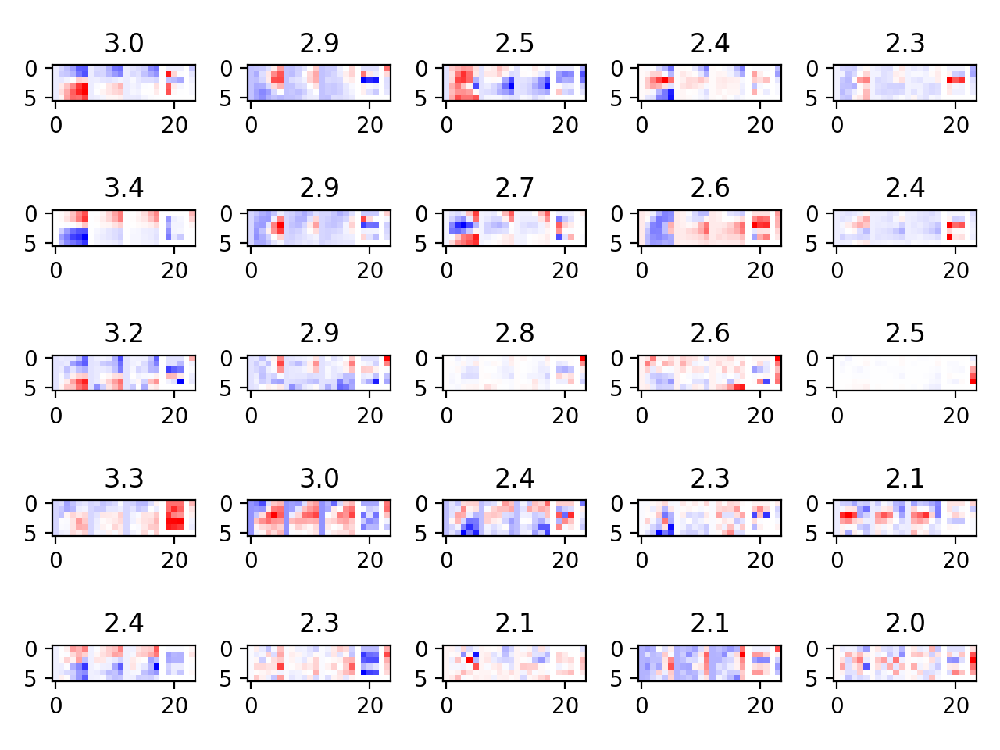

In [41]:
plt.figure()
irun = 0
ialign = 0
# idim = 0
for itype in range(5):
    mx = np.sqrt(np.nanmax(np.array([np.nanmax(Rso_cov[irun][itype][ialign][idim][0]) for idim in range(5)])))
    for idim in range(5):
        plt.subplot(5,5,5*itype+idim+1)
        val = np.sqrt(Rso_cov[irun][itype][ialign][idim][0])
        vec = Rso_cov[irun][itype][ialign][idim][1]
        plt.title('%.1f'%val)
        dirs = [[0,4],[1,3,5,7],[2,6]]
        to_show = [np.nanmean(val*vec[:6*6*8].reshape((6,6,8))[:,:,this_dir],2) for this_dir in dirs]
        to_show = np.concatenate(to_show,axis=1)
        to_show_fg = np.nan*np.ones((6,4))
        to_show_fg[:5,1:] = np.concatenate([np.nanmean(val*vec[-5*8-5:-5].reshape((5,8))[:,this_dir],1)[:,np.newaxis] for this_dir in dirs],axis=1)
        to_show_ret = np.nan*np.ones((6,2))
        to_show_ret[:5,1:] = val*vec[-5:].reshape((5,1))
        to_show = np.concatenate((to_show,to_show_fg,to_show_ret),axis=1)
        ut.imshow_hot_cold(to_show)
plt.tight_layout()

# plt.figure()
# irun = 0
# ialign = 0
# # idim = 0
# for itype in range(5):
#     mx = np.sqrt(np.nanmax(np.array([np.nanmax(Rso_cov[irun][itype][ialign][idim][0]) for idim in range(5)])))
#     for idim in range(5):
#         plt.subplot(5,5,5*itype+idim+1)
#         val = np.sqrt(Rso_cov[irun][itype][ialign][idim][0])
#         vec = Rso_cov[irun][itype][ialign][idim][1]
#         plt.title('%.1f'%val)
#         dirs = [[0,4],[1,3,5,7],[2,6]]
#         to_show = [np.nanmean(val*vec[-5*8:].reshape((5,8))[:,this_dir],1)[:,np.newaxis] for this_dir in dirs]
#         to_show = np.concatenate(to_show,axis=1)
#         ut.imshow_hot_cold(to_show)
# plt.tight_layout()

<IPython.core.display.Javascript object>


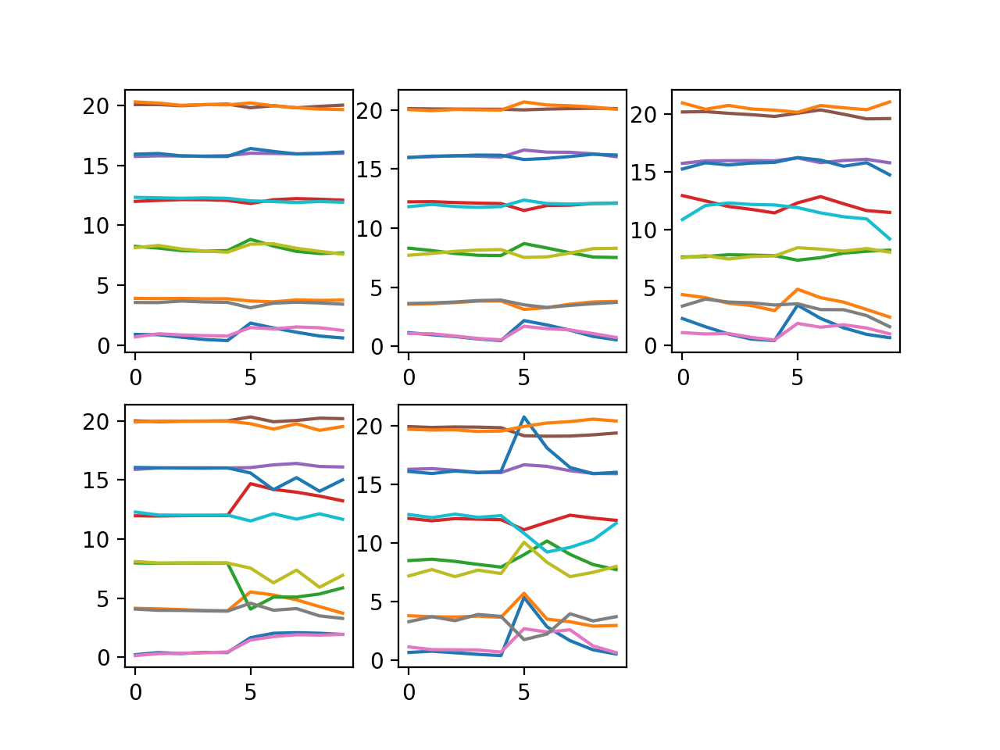

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  after removing the cwd from sys.path.


In [58]:
plt.figure()
for ialign in range(2):
    for iR in range(5):
        plt.subplot(2,3,iR+1)
        plt.plot(Rso_mean_run[iR][ialign][-10:])
        for idim in range(5):
            s,v = Rso_cov_run[iR][ialign][idim]
            plt.plot(s*v[-10:]+4*(idim+1))

In [1100]:
var_dict = {'Rs_sc':Rso,'Rs_fg':Rso_fg,'Rs_mean':Rso_mean,'Rs_cov':Rso_cov,\
           'Rs_run_sc':Rso_run,'Rs_run_fg':Rso_run_fg,'Rs_mean_run':Rso_mean_run,'Rs_cov_run':Rso_cov_run}
np.save('../shared_data/calnet_data/rs_sc_fg_pval_0_05_210410.npy',var_dict,allow_pickle=True)

In [37]:
# var_dict = {'Rs_sc':Rso,'Rs_fg':Rso_fg,'Rs_ret':Rso_ret,'Rs_mean':Rso_mean,'Rs_cov':Rso_cov,\
#            'Rs_run_sc':Rso_run,'Rs_run_fg':Rso_run_fg,'Rs_run_ret':Rso_run_ret,'Rs_mean_run':Rso_mean_run,'Rs_cov_run':Rso_cov_run}
# np.save('../shared_data/calnet_data/rs_sc_fg_ret_rf_dist_pval_0_05_210425.npy',var_dict,allow_pickle=True)

In [100]:
var_dict = {'Rs_sc':Rso,'Rs_fg':Rso_fg,'Rs_ret':Rso_ret,'Rs_mean':Rso_mean,'Rs_cov':Rso_cov,\
           'Rs_run_sc':Rso_run,'Rs_run_fg':Rso_run_fg,'Rs_run_ret':Rso_run_ret,'Rs_mean_run':Rso_mean_run,'Rs_cov_run':Rso_cov_run}
np.save('../shared_data/calnet_data/rs_sc_fg_ret_rf_dist_pval_0_05_norm_by_expt_210428.npy',var_dict,allow_pickle=True)

In [60]:
# var_dict = {'Rs_sc':Rso,'Rs_fg':Rso_fg,'Rs_ret':Rso_ret,'Rs_mean':Rso_mean,'Rs_cov':Rso_cov,\
#            'Rs_run_sc':Rso_run,'Rs_run_fg':Rso_run_fg,'Rs_run_ret':Rso_run_ret,'Rs_mean_run':Rso_mean_run,'Rs_cov_run':Rso_cov_run}
# np.save('../shared_data/calnet_data/rs_sc_fg_ret_no_pval_210427.npy',var_dict,allow_pickle=True)

In [84]:
var_dict = {'Rs_sc':Rso,'Rs_fg':Rso_fg,'Rs_ret':Rso_ret,'Rs_mean':Rso_mean,'Rs_cov':Rso_cov,\
           'Rs_run_sc':Rso_run,'Rs_run_fg':Rso_run_fg,'Rs_run_ret':Rso_run_ret,'Rs_mean_run':Rso_mean_run,'Rs_cov_run':Rso_cov_run}
np.save('../shared_data/calnet_data/rs_sc_fg_ret_no_pval_norm_by_expt_210428.npy',var_dict,allow_pickle=True)

In [1264]:
import scipy.io as sio
reload(calnet.utils)

irun = 0
ialign = 0

def norm_to_exptwise_mean_non_running(vip_sc_event_rate,vip_sc_expt_ids):
    nexpt = int(vip_sc_expt_ids.max()+1)
    mn = np.ones((nexpt,))
    for iexpt in range(nexpt):
        mn[iexpt] = np.nanmean(vip_sc_event_rate[vip_sc_expt_ids==iexpt,0])
    print(mn)
    try:
        return vip_sc_event_rate/mn[vip_sc_expt_ids.astype('int')][:,np.newaxis,np.newaxis]
    except:
        return vip_sc_event_rate/mn[vip_sc_expt_ids.astype('int')][:,np.newaxis,np.newaxis,np.newaxis]

def gen_vip_sst_matdict(rs,expt_ids,lbl='sc'):
    if lbl=='sc':
        ori_axis = 3
    else:
        ori_axis = 2

    itype = 3
    lkat = [(expt_ids[irun][itype][ialign]!=10) for irun in range(2)]
    vip_fg_event_rate = [np.nanmean(rs[irun][itype][ialign][lkat[irun]],ori_axis) for irun in range(2)]
    vip_fg_expt_ids = [expt_ids[irun][itype][ialign][lkat[irun]] for irun in range(2)]
    vip_fg_event_rate,vip_fg_expt_ids,vip_fg_neuron_ids = calnet.utils.merge_by_neuron(*vip_fg_event_rate,*vip_fg_expt_ids)
    vip_fg_event_rate_norm = norm_to_exptwise_mean_non_running(vip_fg_event_rate,vip_fg_expt_ids)

    itype = 2
    lkat = [(expt_ids[irun][itype][ialign]!=10) for irun in range(2)]
    sst_fg_event_rate = [np.nanmean(rs[irun][itype][ialign][lkat[irun]],ori_axis) for irun in range(2)]
    sst_fg_expt_ids = [expt_ids[irun][itype][ialign][lkat[irun]] for irun in range(2)]
    sst_fg_event_rate,sst_fg_expt_ids,sst_fg_neuron_ids = calnet.utils.merge_by_neuron(*sst_fg_event_rate,*sst_fg_expt_ids)
    sst_fg_event_rate_norm = norm_to_exptwise_mean_non_running(sst_fg_event_rate,sst_fg_expt_ids)

    if lbl=='sc':
        array_dims = 'Neuron_x_Running_x_Size_x_Contrast'
        usize = np.array((5,8,13,22,36,60))
        ucontrast = np.array((0,6,12,25,50,100))
    else:
        array_dims = 'Neuron_x_Running_x_Stim'
        stim_lbls = ['ctrl','figure','ground','iso','cross']

    running_lbls = ['non_running','running']

    matdict = {'vip_%s_event_rate'%lbl:vip_fg_event_rate,\
               'vip_%s_event_rate_norm'%lbl:vip_fg_event_rate_norm,\
               'sst_%s_event_rate'%lbl:sst_fg_event_rate,\
               'sst_%s_event_rate_norm'%lbl:sst_fg_event_rate_norm,\
               'array_dims':array_dims,\
               'running_lbls':running_lbls,\
               'vip_%s_expt_ids'%lbl:vip_fg_expt_ids,\
               'sst_%s_expt_ids'%lbl:sst_fg_expt_ids,\
               'vip_%s_neuron_ids'%lbl:vip_fg_neuron_ids,\
               'sst_%s_neuron_ids'%lbl:sst_fg_neuron_ids}
    
    if lbl=='sc':
        matdict['sizes'] = usize
        matdict['contrasts'] = ucontrast
    else:
        matdict['stim_lbls'] = stim_lbls
    
    return matdict

matdict_sc = gen_vip_sst_matdict(rs,expt_ids,lbl='sc')
matdict_fg = gen_vip_sst_matdict(rs_fg,expt_ids_fg,lbl='fg')

sio.savemat('vip_sst_fg_responses_by_running_210418.mat',matdict_fg)
sio.savemat('vip_sst_sc_responses_by_running_210418.mat',matdict_sc)

[       nan        nan        nan        nan 0.02195694        nan
        nan 0.03285119        nan        nan        nan 0.02974594
 0.02190532]
[       nan        nan        nan 0.02404265 0.11475154        nan
 0.04273884 0.03785731        nan 0.01780959]
[       nan        nan 0.02283233        nan 0.00903046        nan
        nan        nan        nan        nan        nan 0.0214125
 0.01611602]
[       nan        nan        nan 0.03466579 0.07996248        nan
        nan 0.03681282        nan 0.02050619]


In [1238]:
matfile_fg = sio.loadmat('vip_sst_fg_responses_by_running.mat')
matfile_sc = sio.loadmat('vip_sst_sc_responses_by_running.mat')

In [1263]:
matdict_sc['sizes']

array([ 5,  8, 13, 22, 36, 60])

In [1255]:
def print_neuron_nos(matfile_fg,matfile_sc):
    for i in range(int(matfile_fg['vip_fg_expt_ids'].max()+1)):
        print(np.sum(matfile_fg['vip_fg_expt_ids']==i))
    print('\n')
    for i in range(int(matfile_sc['vip_sc_expt_ids'].max()+1)):
        print(np.sum(matfile_sc['vip_sc_expt_ids']==i))
    print('\n')
    for i in range(int(matfile_fg['sst_fg_expt_ids'].max()+1)):
        print(np.sum(matfile_fg['sst_fg_expt_ids']==i))
    print('\n')
    for i in range(int(matfile_sc['sst_sc_expt_ids'].max()+1)):
        print(np.sum(matfile_sc['sst_sc_expt_ids']==i))

# print_neuron_nos(matdict_fg,matdict_sc)
print_neuron_nos(matfile_fg,matfile_sc)

0
0
233
0
24
0
0
0
0
205
0
256
252


0
441
98
0
70
0
0
170
0
148
0
256
252


185
0
0
85
87
0
0
122
0
59


191
0
0
27
27
0
113
122
0
59


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


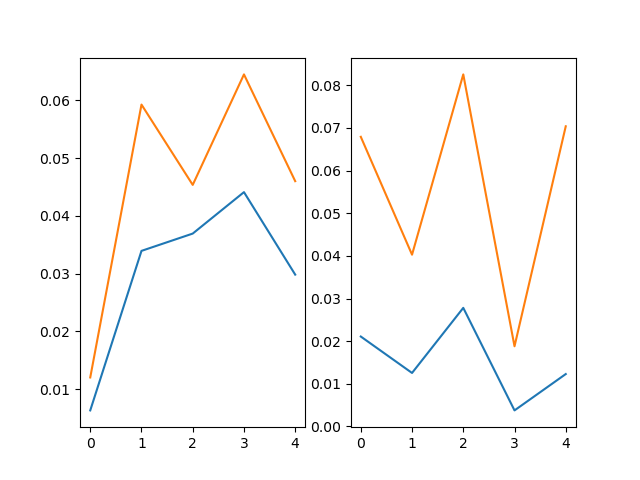

In [1247]:
plt.figure()
plt.subplot(1,2,1)
for irun in range(2):
    plt.plot(np.nanmean(matfile_fg['sst_fg_event_rate'],0)[irun])
plt.subplot(1,2,2)
for irun in range(2):
    plt.plot(np.nanmean(matfile_fg['vip_fg_event_rate'],0)[irun])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


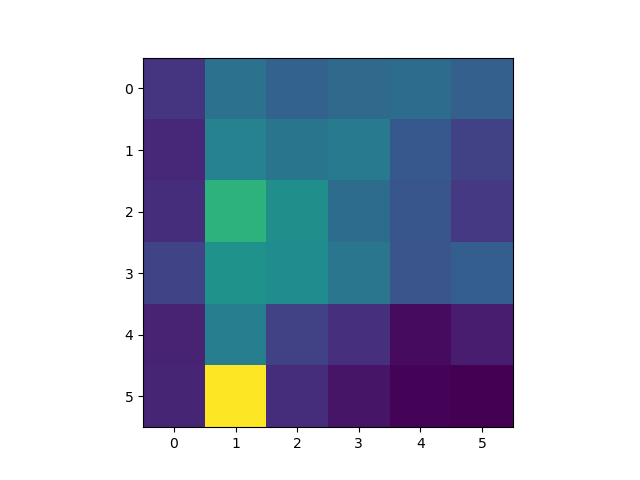

In [1251]:
plt.figure()
plt.imshow(np.nanmean(matdict_sc['vip_sc_event_rate'],0)[1])

In [ ]:
plt.figure()
plt.

In [1015]:
np.ones((3,3)) @ np.diag((1,2,3))

array([[1., 2., 3.],
       [1., 2., 3.],
       [1., 2., 3.]])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


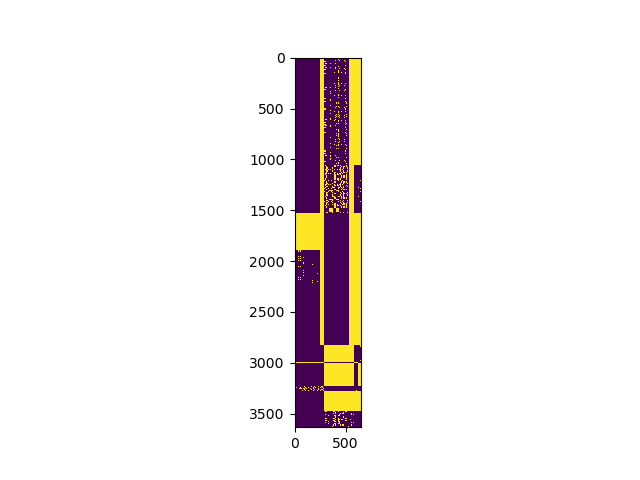

In [929]:
plt.figure()
plt.imshow(np.isnan(this_summed_data))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


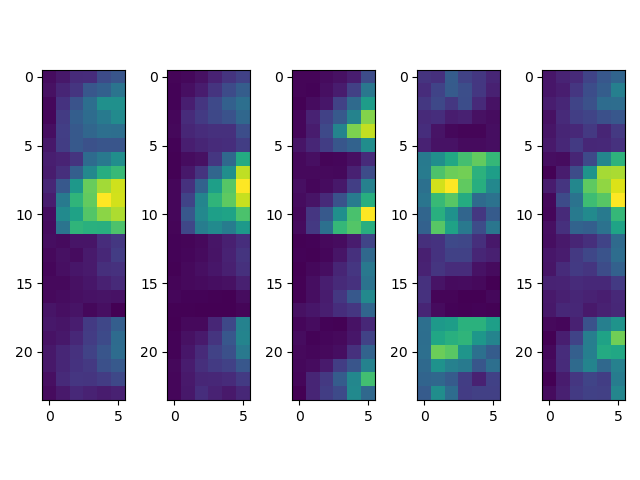

In [997]:
ialign = 0
sc_run_dims = (2,nsize,ncontrast,ndir)
fg_run_dims = (2,nstim_fg,ndir)
nsc,nfg = [np.prod(x) for x in [sc_run_dims,fg_run_dims]]
plt.figure()
for itype in range(5):
    plt.subplot(1,5,itype+1)
#     data1 = np.nanmean(np.nanmean(Rso_run[itype][ialign][:,:,:,:,[0,4]],4),0).reshape((12,6))
#     data2 = np.nanmean(np.nanmean(Rso_run[itype][ialign][:,:,:,:,[2,6]],4),0).reshape((12,6))
    data1 = np.nanmean(Rso_mean_run[itype][ialign][:nsc].reshape(sc_dims)[:,:,:,[0,4]],3).reshape((12,6))
    data2 = np.nanmean(Rso_mean_run[itype][ialign][:nsc].reshape(sc_dims)[:,:,:,[2,6]],3).reshape((12,6))
    plt.imshow(np.concatenate((data1,data2),axis=0))
plt.tight_layout()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


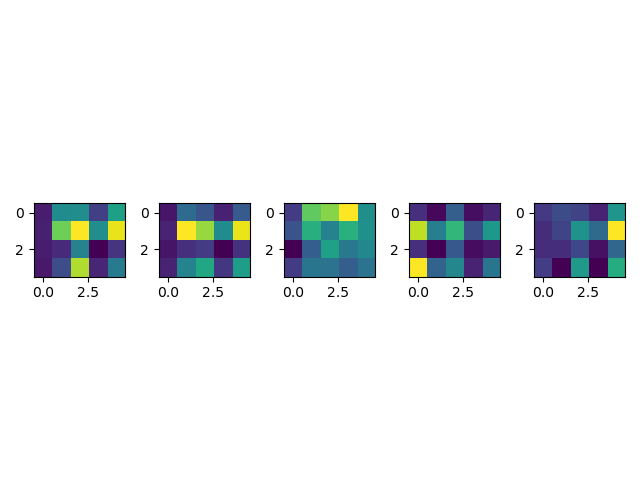

In [998]:
ialign = 0
plt.figure()
for itype in range(5):
    plt.subplot(1,5,itype+1)
    data1 = np.nanmean(np.nanmean(Rso_run_fg[itype][ialign][:,:,:,[0,4]],3),0).reshape((2,5))
    data2 = np.nanmean(np.nanmean(Rso_run_fg[itype][ialign][:,:,:,[2,6]],3),0).reshape((2,5))
    plt.imshow(np.concatenate((data1,data2),axis=0))
plt.tight_layout()

In [1853]:
with ut.hdf5read(dsnames[1]) as ds:
    keylist = list(ds.keys())
    print(keylist[0])
    print(ds[keylist[0]]['retinotopy_0']['rf_ctr'][:].mean(1))

session_181205_M10130
[0. 0.]


<IPython.core.display.Javascript object>


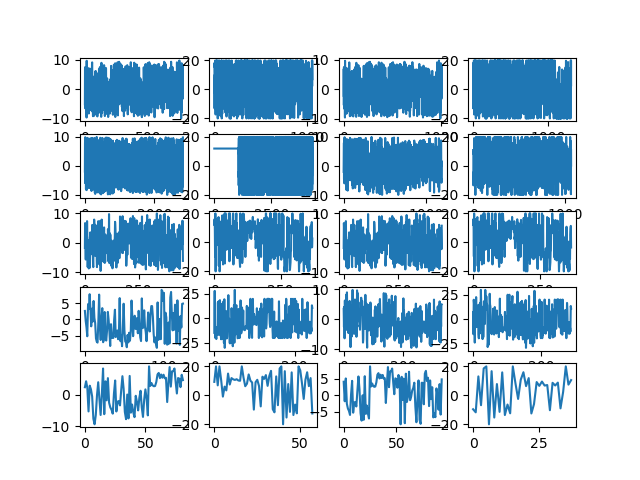

In [1855]:
plt.figure()
for irun in range(2):
    for itype in range(5):
        for ialign in range(2):
            plt.subplot(5,4,2*irun+4*itype+ialign+1)
            plt.plot(disps_ret[irun][itype][ialign][:,0])

<IPython.core.display.Javascript object>


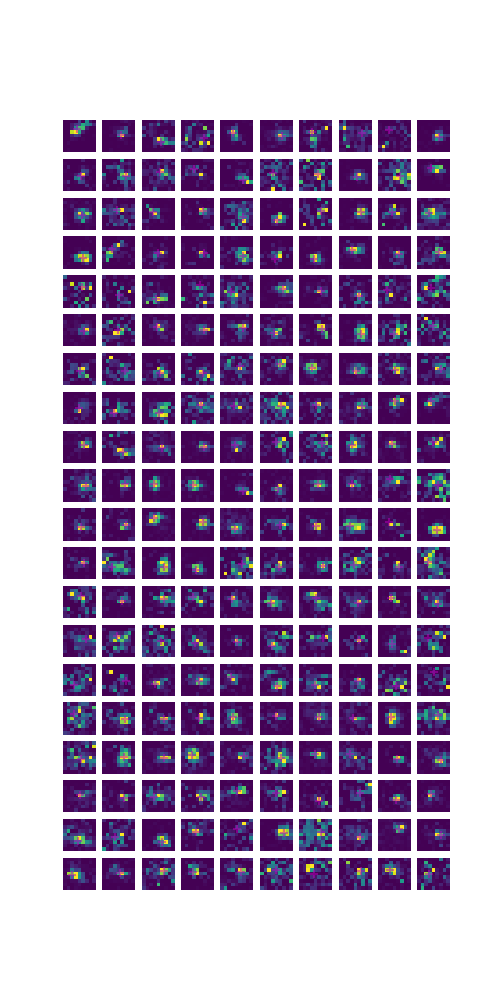

In [1856]:
# ut.imshow_in_rows(rs_ret[0][1][0][:100])
# print(disps_ret[0][1][0][:100])
plt.figure(figsize=(5,10))
irun = 0
itype = 1
ialign = 0
for iiroi,iroi in enumerate(np.arange(0,200)):#np.random.choice(1000,100)):
    plt.subplot(20,10,iiroi+1)
    plt.imshow(rs_ret[irun][itype][ialign][iroi],extent=[-20,20,-20,20])
    rad = np.sqrt(disps_ret[irun][itype][ialign][iroi,0]**2 + disps_ret[irun][itype][ialign][iroi,1]**2)
    circle1 = plt.Circle((0, 0), rad, color='m',fill=False)
#     plt.gca().add_patch(circle1)
    plt.scatter(disps_ret[irun][itype][ialign][iroi,0],-disps_ret[irun][itype][ialign][iroi,1],c='m',marker='+',alpha=0.5)
#     plt.scatter(disps_ret[irun][itype][ialign][iroi,0],disps_ret[irun][itype][ialign][iroi,1],c='m',marker='+')
#     plt.scatter(-disps_ret[irun][itype][ialign][iroi,0],-disps_ret[irun][itype][ialign][iroi,1],c='m',marker='+')
#     plt.scatter(-disps_ret[irun][itype][ialign][iroi,0],disps_ret[irun][itype][ialign][iroi,1],c='m',marker='+')
    plt.axis('off')

In [884]:
res

{'grad': array([ 0.00441685,  0.00229751, -0.00961495, ..., -0.00287001,
        -0.00484106, -0.01914044]),
 'task': b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH',
 'funcalls': 27,
 'nit': 23,
 'warnflag': 0}

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


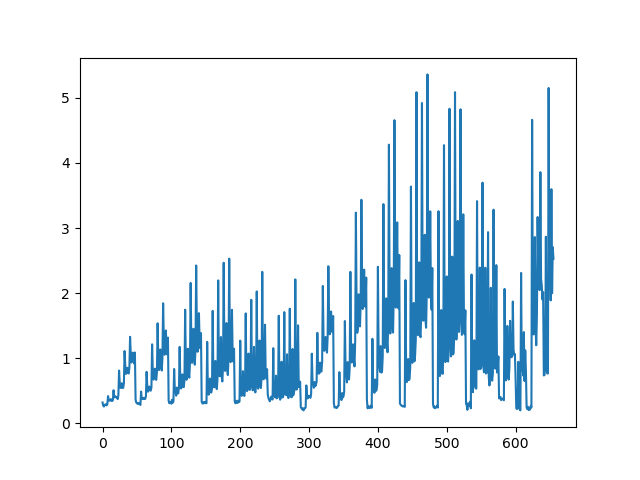

In [886]:
plt.figure()
plt.imshow()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


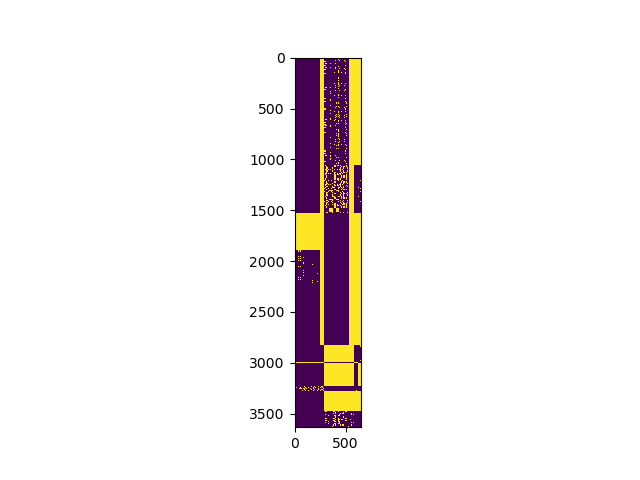

In [840]:
plt.figure()
plt.imshow(np.isnan(this_data))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


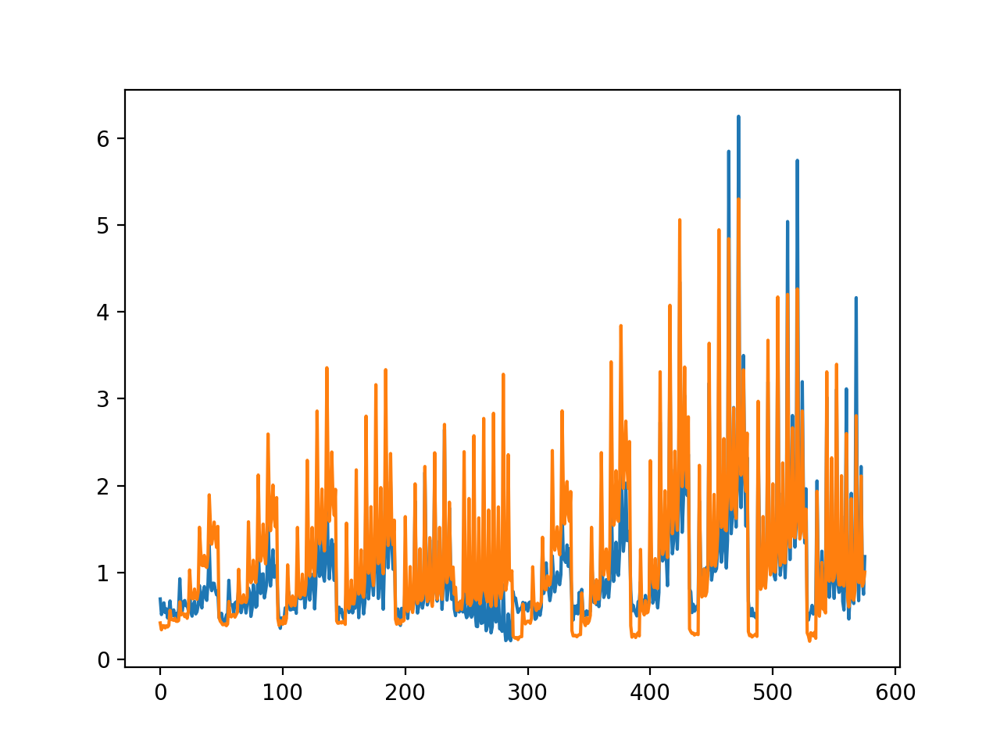

In [839]:
plt.figure()
for itype in range(2):
    plt.plot(np.nanmean(Rso_run[itype][ialign],0).flatten())

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


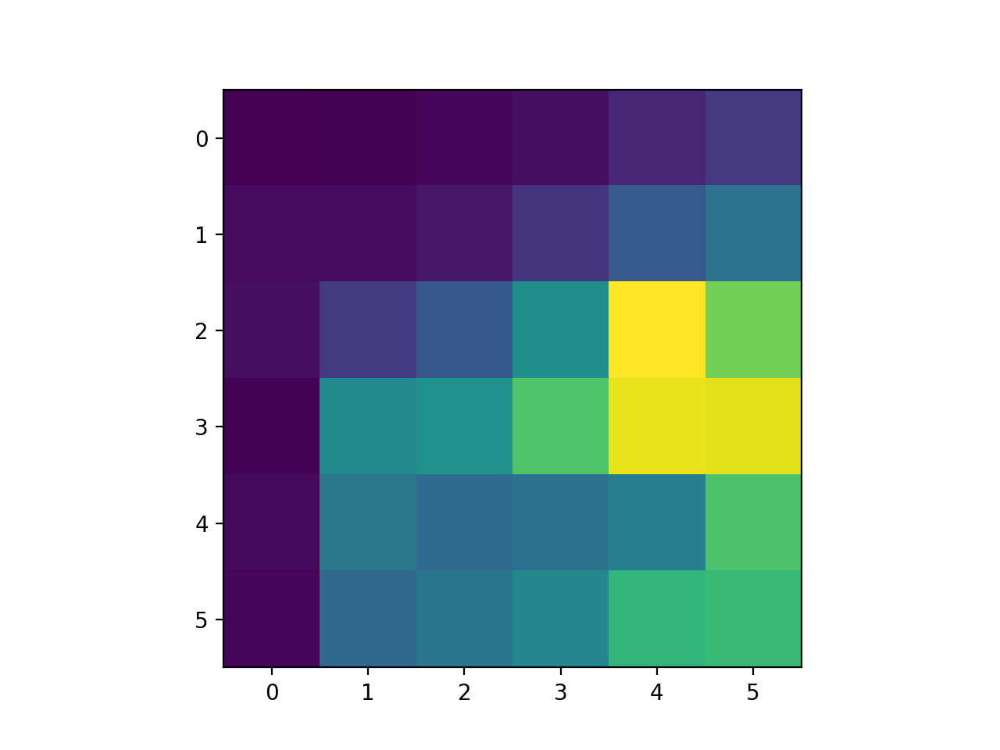

In [834]:
plt.figure()
plt.imshow(np.nanmean(np.nanmean(Rso_run[1][0][:,0,:,:,0:1],-1),0))

In [617]:
reload(calnet.utils)
reload(ut)
nsize,ncontrast,ndir = 6,6,8
nstim_fg = 5 # number of figure-ground stims
ids_to_exclude = [np.array((2,3,3)),np.array((3,2,4))]
ori_dirs = [[0,4],[2,6]] #[[0,4],[1,3,5,7],[2,6]] #[np.arange(8)]#
nT = len(ori_dirs)
nS = len(rs[0][0])
irun = 0
# entry_fg = [np.array((0,0,2,2,0)),np.array((0,0,2,2,2))] # entry corresponding to the 0 degree direction 
entry_fg = [np.array((0,0,2,2,0)),np.array((0,0,2,2,0))] # entry corresponding to the 0 degree direction 
# for the grating on the "receptive field location" for this pixel

def sum_to_1(r):
    R = r.reshape((r.shape[0],-1))
    R = R/np.nansum(R[:,~np.isnan(R.sum(0))],axis=1)[:,np.newaxis]
    return R

def norm_to_mean(r):
    R = r.reshape((r.shape[0],-1))
    R = R/np.nanmean(R[:,~np.isnan(R.sum(0))],axis=1)[:,np.newaxis]
    return R
    
Rs = [[None,None] for i in range(len(rs[irun]))]
Rs_fg = [[None,None] for i in range(len(rs[irun]))]
expt_ids_all = [[None,None] for i in range(len(rs[irun]))]

for iR,(r,r_fg,ei,ei_fg) in enumerate(zip(rs[irun],rs_fg[irun],expt_ids[irun],expt_ids_fg[irun])):
    if True:#iR < 4:
        print(iR)
        for ialign in range(nS):
            r_flat = r[ialign][:,:nsize,:].reshape((r[ialign].shape[0],-1))
            r_fg_flat = r_fg[ialign].reshape((r_fg[ialign].shape[0],-1))
            this_ei = ei[ialign]
            this_ei_fg = ei_fg[ialign]
            if iR in ids_to_exclude[0]:
                these_ids_to_exclude = ids_to_exclude[1][ids_to_exclude[0]==iR]
                r_flat = r_flat[~np.in1d(ei[ialign],these_ids_to_exclude)]
                r_fg_flat = r_fg_flat[~np.in1d(ei_fg[ialign],these_ids_to_exclude)]
                this_ei = this_ei[~np.in1d(ei[ialign],these_ids_to_exclude)]
                this_ei_fg = this_ei_fg[~np.in1d(ei_fg[ialign],these_ids_to_exclude)]
            r_flat,r_fg_flat,ei_all,ni_all = calnet.utils.align_by_neuron(r_flat,r_fg_flat,this_ei,this_ei_fg)
            this_data = np.concatenate((r_flat,r_fg_flat),axis=1)
            this_summed_data = sum_to_1(this_data)
            Rs[iR][ialign] = this_summed_data[:,:r_flat.shape[1]].reshape(r_flat.shape[:1]+r[ialign].shape[1:])
            Rs_fg[iR][ialign] = this_summed_data[:,r_flat.shape[1]:].reshape(r_flat.shape[:1]+r_fg[ialign].shape[1:])
            Rs_fg[iR][ialign] = ut.circ_align_to_entry_axiswise(Rs_fg[iR][ialign],entry_fg[ialign],based_axis=1,entry_axis=2)
            expt_ids_all[iR][ialign] = ei_all
            #         Rs_fg[iR][ialign] = sum_to_1()
    #         Rs[iR][ialign] = von_mises_denoise(Rs[iR][ialign].reshape((-1,nsize,ncontrast,ndir)))

0
1
2
3
4


In [597]:
Rs_fg[0][1].shape

(1646, 5, 8)

In [618]:
irun = 0
reload(opto_utils)
Rso = [None for ialign in range(2)]
Rso_sem = [None for ialign in range(2)]
Rso_fg = [None for ialign in range(2)]
Rso_sem_fg = [None for ialign in range(2)]
for ialign in range(2):
    Rso[ialign] = [None for icelltype in range(len(rs[irun]))]
    Rso_sem[ialign] = [None for icelltype in range(len(rs_sem[irun]))]
    Rso_fg[ialign] = [None for icelltype in range(len(rs_fg[irun]))]
    Rso_sem_fg[ialign] = [None for icelltype in range(len(rs_sem_fg[irun]))]
    for icelltype in range(len(Rs)):
        if not rs[irun][icelltype][ialign] is None or not rs[irun][icelltype][ialign] is None:
#             Rso[ialign][icelltype],Rso_sem[ialign][icelltype],Rso_fg[ialign][icelltype],Rso_sem_fg[ialign][icelltype]\
#     = opto_utils.sort_all_by_pref_dir((Rs[ialign][icelltype].copy(),3),(rs_sem[ialign][icelltype].copy(),3),(rs_fg[ialign][icelltype].copy(),2),(rs_sem_fg[ialign][icelltype].copy(),2))
#             Rso[ialign][icelltype],Rso_fg[ialign][icelltype]\
#     = opto_utils.sort_all_by_pref_dir(([Rs[icelltype][ialign].copy()],3),([Rs_fg[icelltype][ialign].copy()],2))
#             Rso_fg[ialign][icelltype],Rso[ialign][icelltype]\
#     = opto_utils.sort_all_by_pref_dir(([Rs_fg[icelltype][ialign][:,1:2,:].copy()],2),([Rs[icelltype][ialign][:,3:4,-1:,:].copy()],3))
            Rso[ialign][icelltype],Rso_fg[ialign][icelltype]\
    = opto_utils.sort_all_by_pref_dir(([Rs[icelltype][ialign][:,:,:,:].copy()],3),([Rs_fg[icelltype][ialign][:,:,:].copy()],2))
#             Rso_fg[ialign][icelltype],Rso[ialign][icelltype]\
#     = opto_utils.sort_all_by_pref_dir(([Rs[icelltype][ialign][:,4:5,-1:,:].copy()],3),([Rs[icelltype][ialign][:,3:4,-1:,:].copy()],3))
#             for ialign in range(2):
#                 these_expt_ids = expt_ids[ialign][icelltype][ialign]
#                 for expt_id in np.unique(these_expt_ids):
#                     mn = np.nanmean(Rso[ialign][icelltype][ialign][these_expt_ids==expt_id])
#                     Rso[ialign][icelltype][ialign][these_expt_ids==expt_id] = Rso[ialign][icelltype][ialign][these_expt_ids==expt_id]/mn
#                     Rso_sem[ialign][icelltype][ialign][these_expt_ids==expt_id] = Rso_sem[ialign][icelltype][ialign][these_expt_ids==expt_id]/mn

/Users/dan/Documents/code/adesnal/opto_utils.py:312: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/opto_utils.py:321: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer[ori_axis-1] = order
/Users/dan/Documents/code/adesnal/opto_utils.py:324: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  other_slicers[iother][other_ori_axes[iother]-1] = order


In [607]:
np.nanmean(Rso_fg[1][icelltype][0])

0.004288344246295252

In [619]:
# Rso = [[[None for iT in range(nT)] for iS in range(nS)] for icelltype in range(len(rs[0]))]
# Rso_fg = [[[None for iT in range(nT)] for iS in range(nS)] for icelltype in range(len(rs[0]))]
Rso_both = [[[None for iT in range(nT)] for iS in range(nS)] for icelltype in range(len(rs[0]))]

for iR,r in enumerate(rs[0]):
    for ialign in range(nS):
        for iori in range(nT):
            this_rso = np.nanmean(Rso[ialign][iR][0].reshape((-1,nsize,ncontrast,ndir))[:,:,:,ori_dirs[iori]],-1)
            this_rso = this_rso.reshape(Rso[ialign][iR][0].shape[0],-1)
            this_rso_fg = np.nanmean(Rso_fg[ialign][iR][0].reshape((-1,nstim_fg,ndir))[:,:,ori_dirs[iori]],-1)
            this_rso_fg = this_rso_fg.reshape(Rso_fg[ialign][iR][0].shape[0],-1)
            Rso_both[iR][ialign][iori] = np.concatenate((this_rso,this_rso_fg),axis=1)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


In [815]:
np.nanmean(Rso_fg[itype][ialign][:,:,:],2)

array([[       nan,        nan,        nan,        nan,        nan],
       [       nan,        nan,        nan,        nan,        nan],
       [       nan,        nan,        nan,        nan,        nan],
       ...,
       [0.00174019, 0.00359563, 0.06374191, 0.00126385, 0.00576268],
       [0.00775783, 0.00727297, 0.00465409, 0.00074235, 0.00550314],
       [0.00042127, 0.00821737, 0.01027356, 0.00310587, 0.01280284]])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


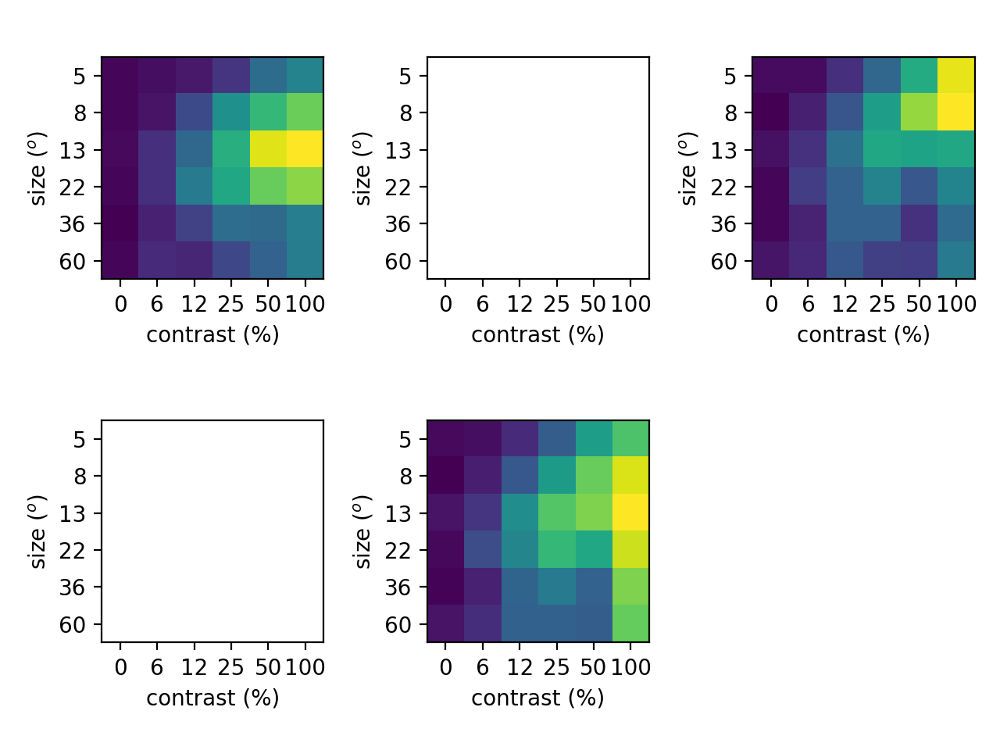

In [820]:
itype = 4
ialign = 0
fg_pref = np.argmax(np.nanmean(Rso_fg[itype][ialign][:,:,:],2),axis=1)
plt.figure()
for ifg in range(5):
    plt.subplot(2,3,ifg+1)
    sca.show_size_contrast(np.nanmean(np.nanmean(Rso[itype][ialign][fg_pref==ifg],3),0))
plt.tight_layout()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


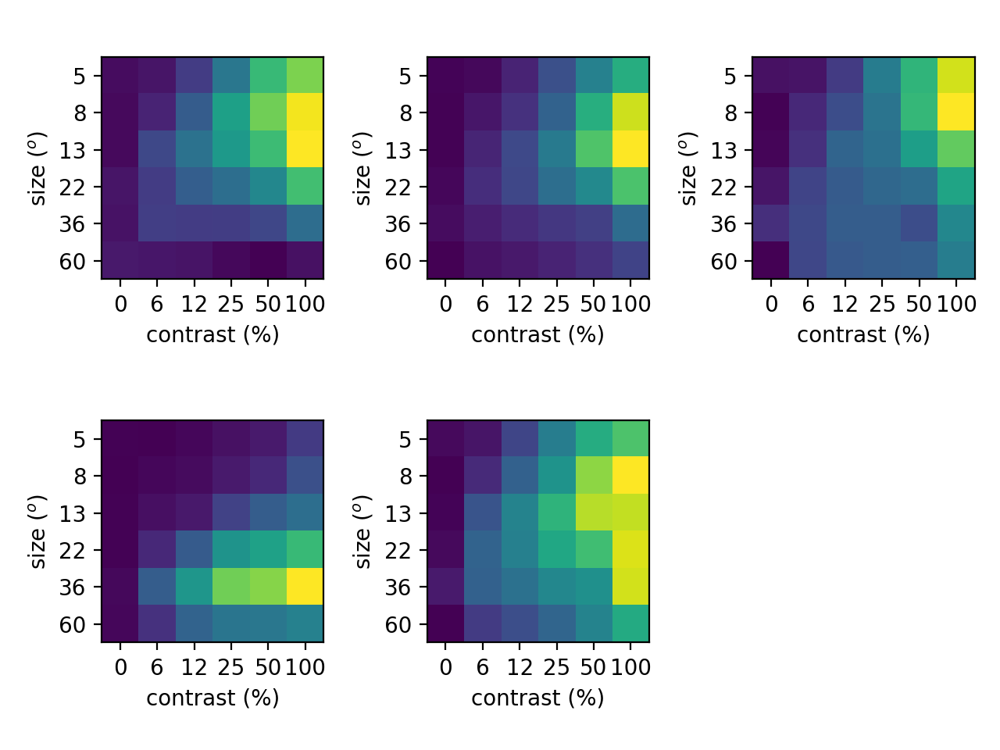

In [811]:
irun = 0
itype = 1
ialign = 0
fg_pref = np.argmax(np.nanmean(rso_fg[irun][itype][ialign][:,:,:],2),axis=1)
plt.figure()
for ifg in range(5):
    plt.subplot(2,3,ifg+1)
    sca.show_size_contrast(np.nanmean(np.nanmean(rso[irun][itype][ialign][fg_pref==ifg],3),0))
plt.tight_layout()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


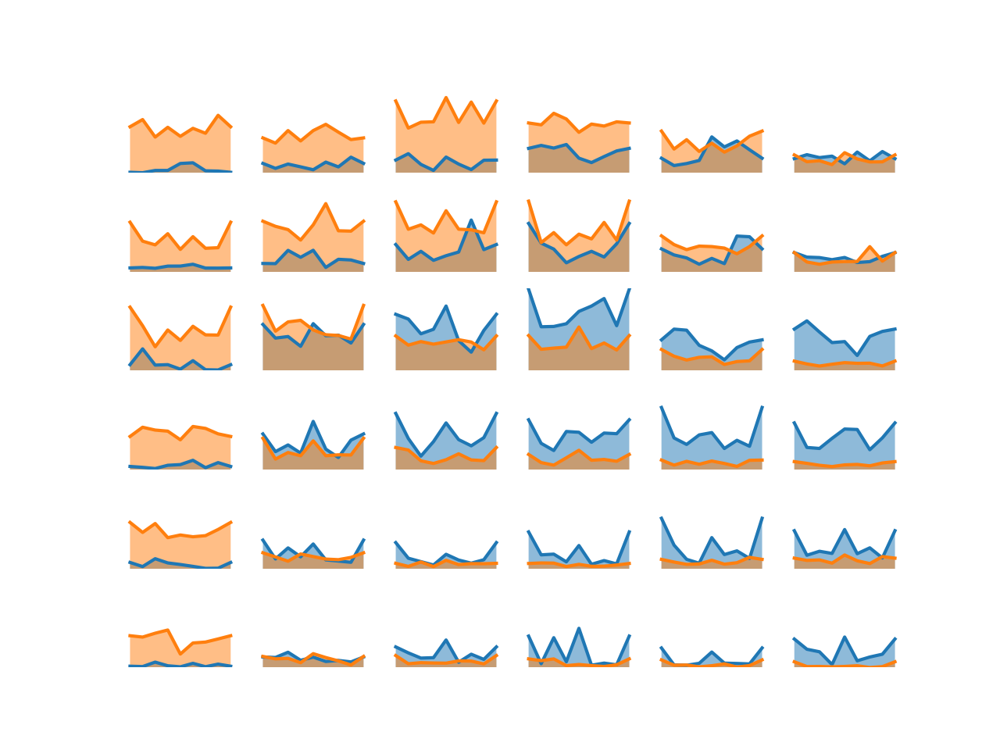

<IPython.core.display.Javascript object>


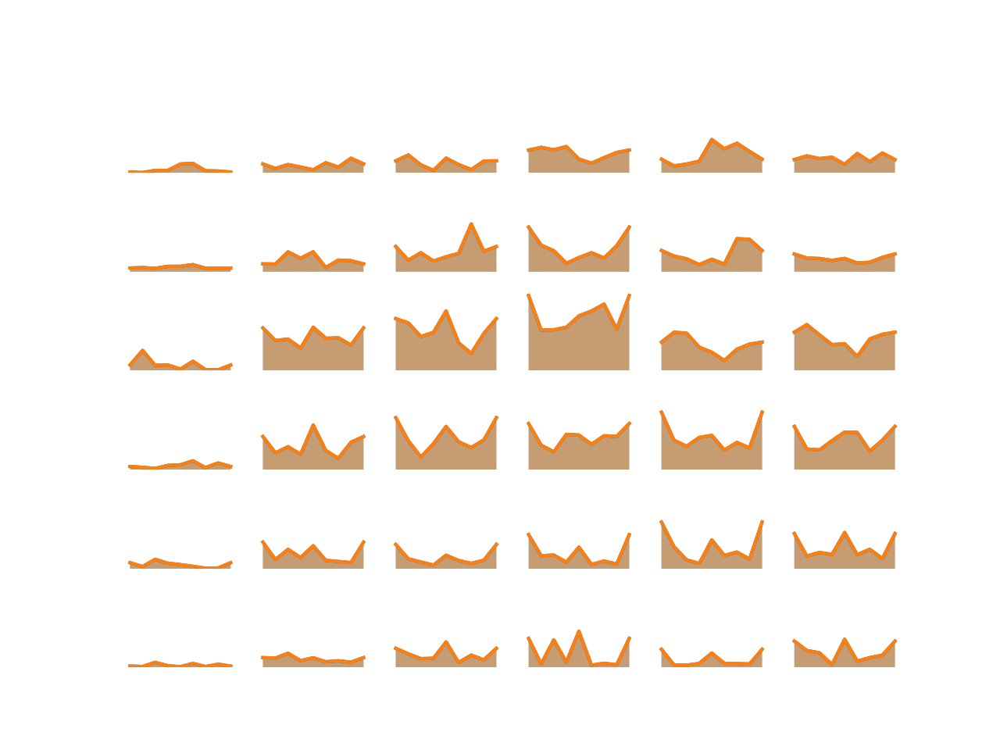

<IPython.core.display.Javascript object>


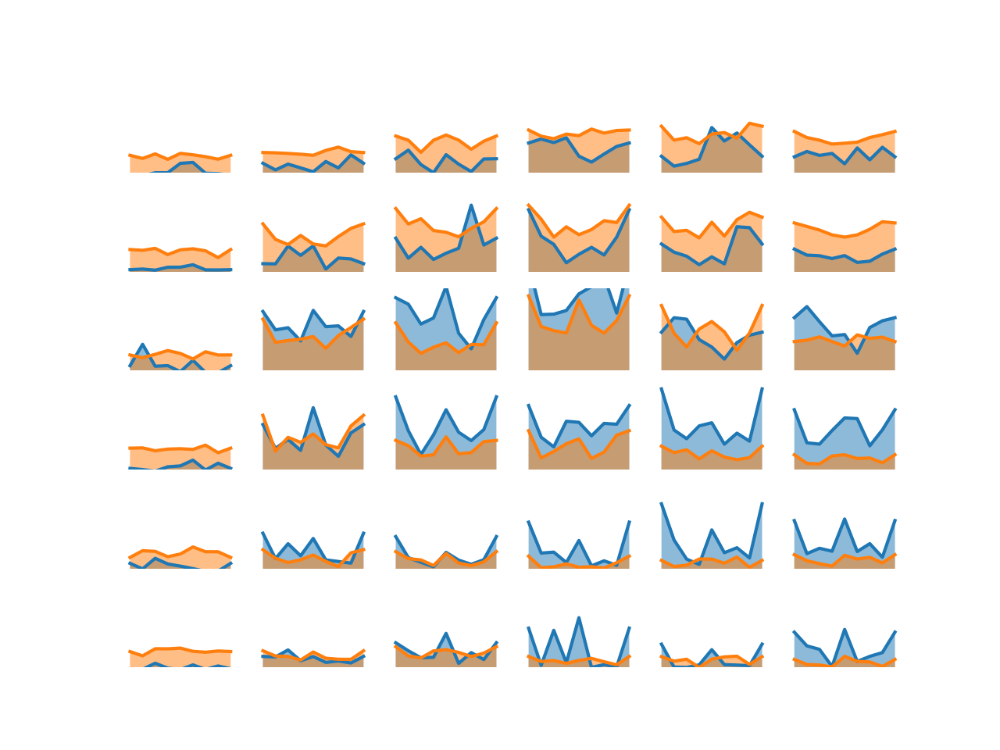

<IPython.core.display.Javascript object>


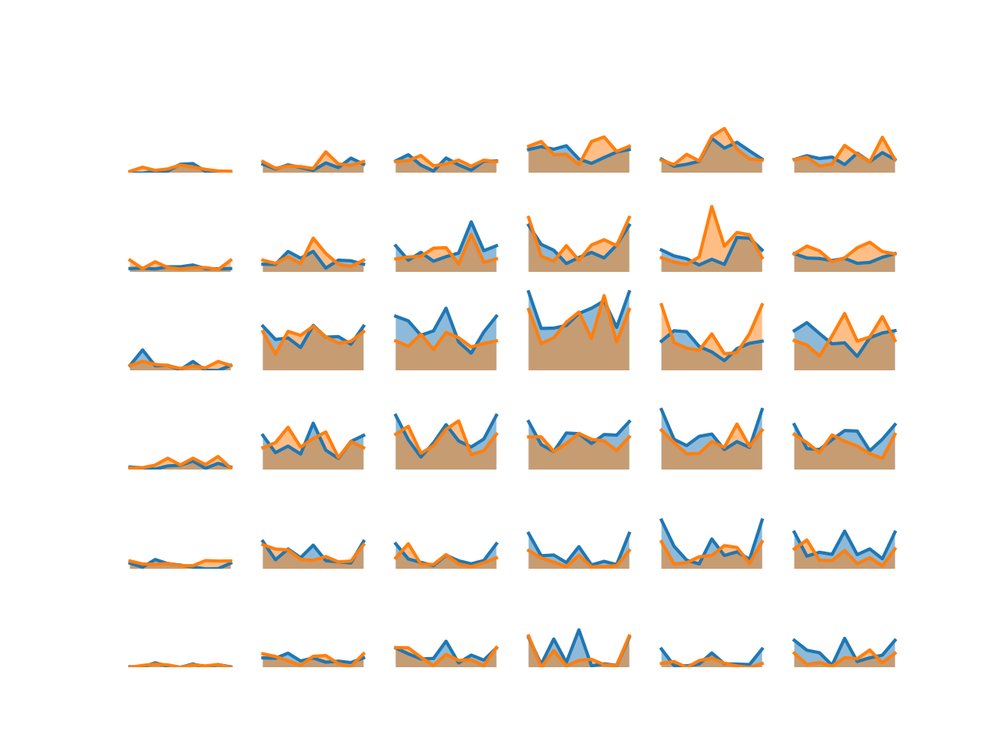

<IPython.core.display.Javascript object>


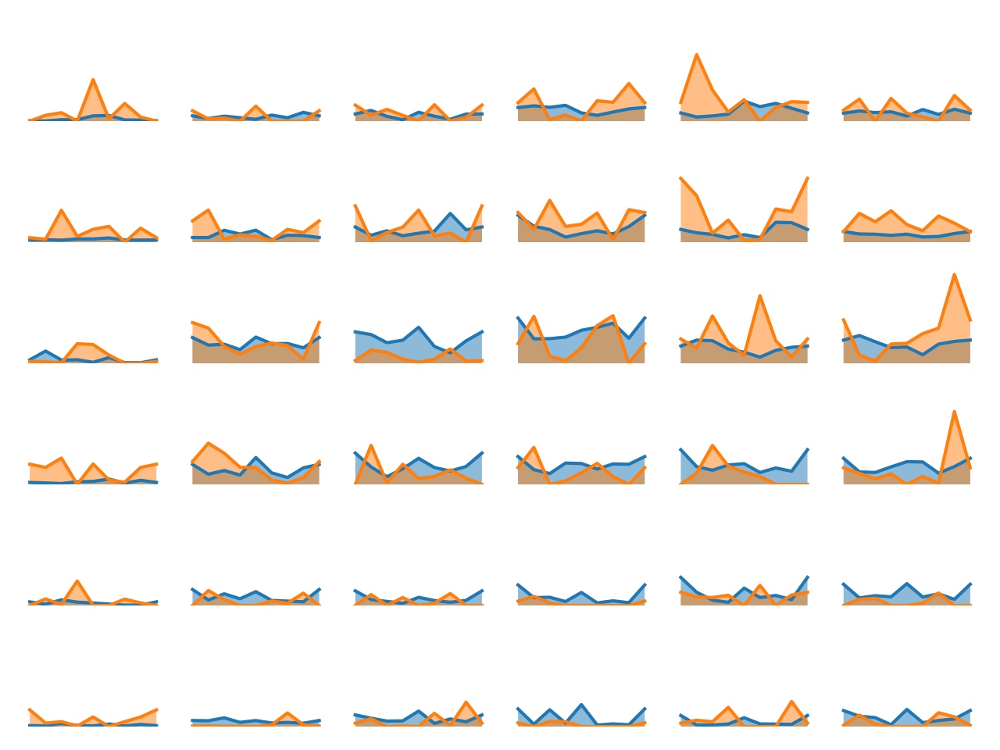

In [810]:
reload(sca)
itype = 3
ialign = 0
fg_pref = np.argmax(np.nanmean(Rso_fg[itype][ialign][:,:,:],2),axis=1)
for ifg in range(5):
#     plt.subplot(2,3,ifg+1)
    plt.figure()
    sca.plot_size_contrast_ori(np.nanmean(Rso[itype][ialign][fg_pref==1],0))
    sca.plot_size_contrast_ori(np.nanmean(Rso[itype][ialign][fg_pref==ifg],0))
plt.tight_layout()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


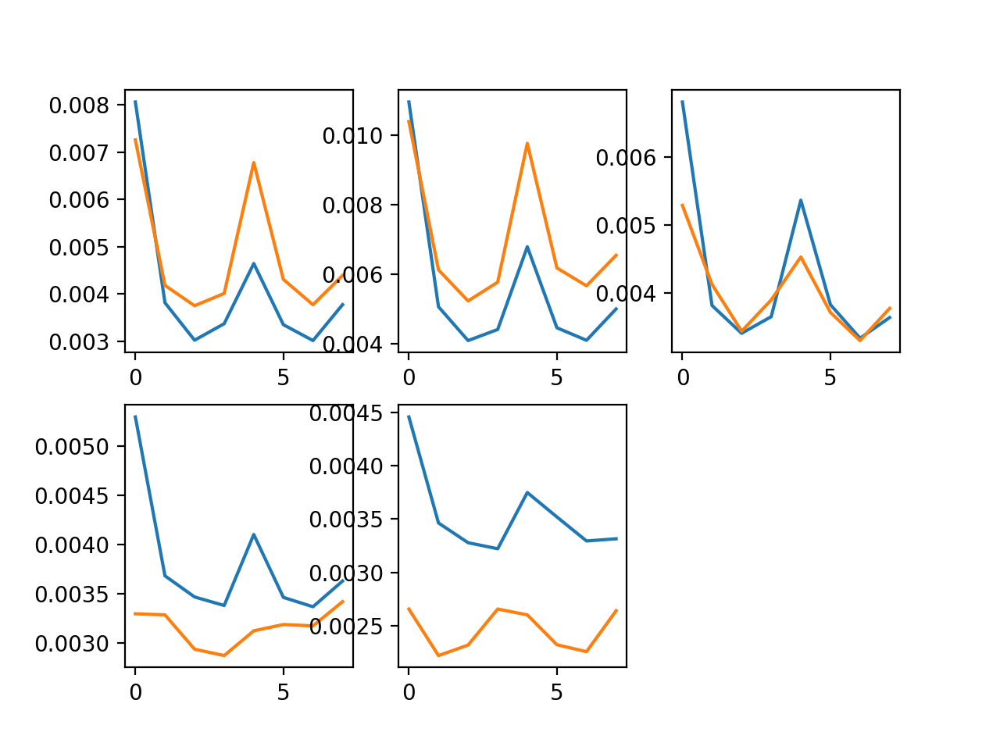

<IPython.core.display.Javascript object>


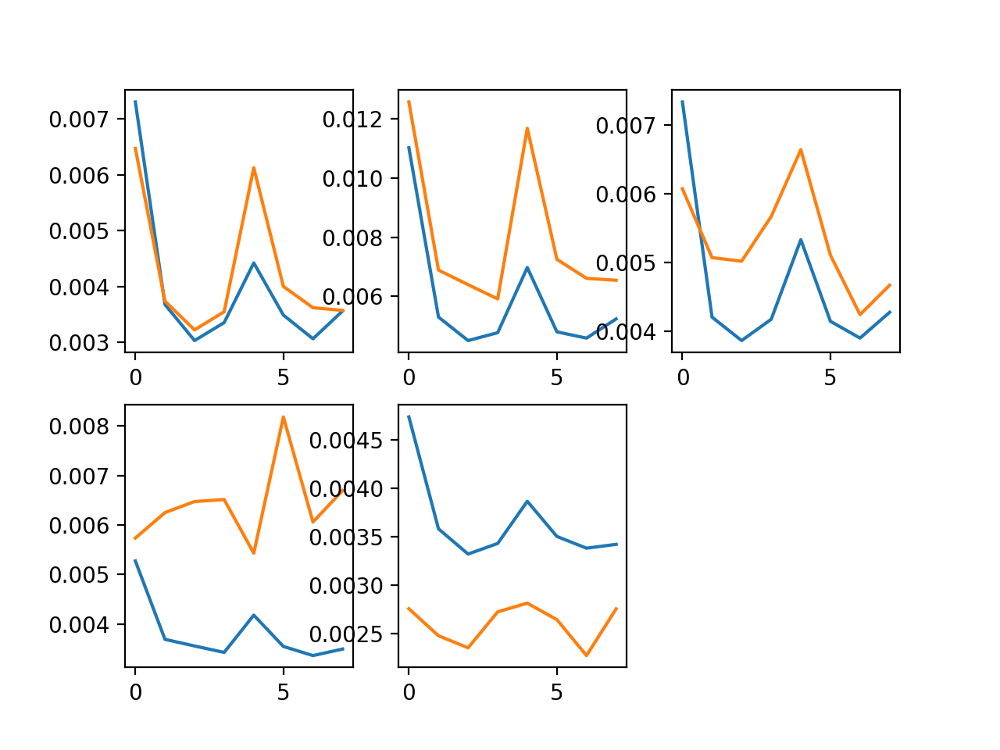

In [622]:
for ialign in range(2):
    plt.figure()
    for itype in range(len(Rso[ialign])):
        plt.subplot(2,3,itype+1)
        plt.plot(np.nanmean(np.nanmean(np.nanmean(Rso[ialign][itype][0],0),0),0))
        plt.plot(np.nanmean(np.nanmean(Rso_fg[ialign][itype][0][:,:],0),0))
        # plt.plot(np.nanmean(np.nanmean(np.nanmean(Rso_fg[0][0][0],0),0),0))

<IPython.core.display.Javascript object>


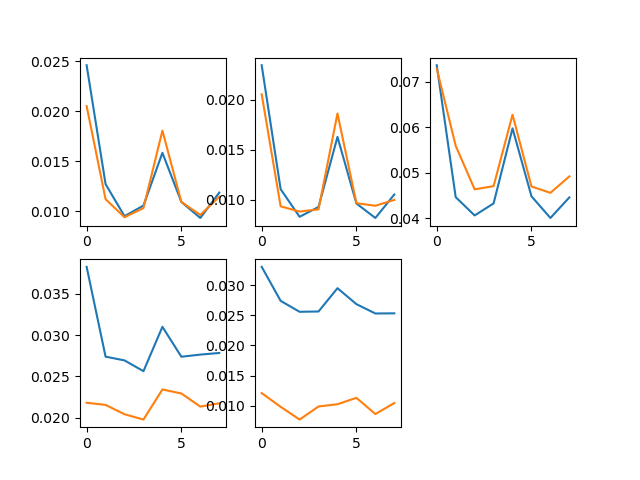

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


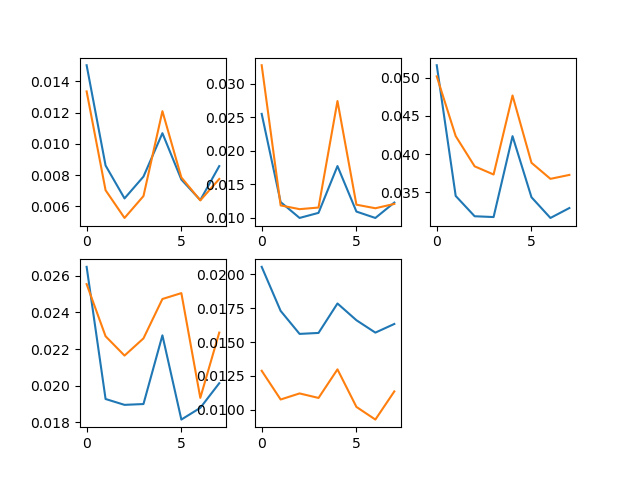

In [731]:
irun = 0
for ialign in range(2):
    plt.figure()
    for itype in range(len(rso[irun])):
        plt.subplot(2,3,itype+1)
        plt.plot(np.nanmean(np.nanmean(np.nanmean(rso[irun][itype][ialign],0),0),0))
        plt.plot(np.nanmean(np.nanmean(rso_fg[irun][itype][ialign][:,:],0),0))
        # plt.plot(np.nanmean(np.nanmean(np.nanmean(Rso_fg[0][0][0],0),0),0))

In [610]:
len(Rso[ialign])

5

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


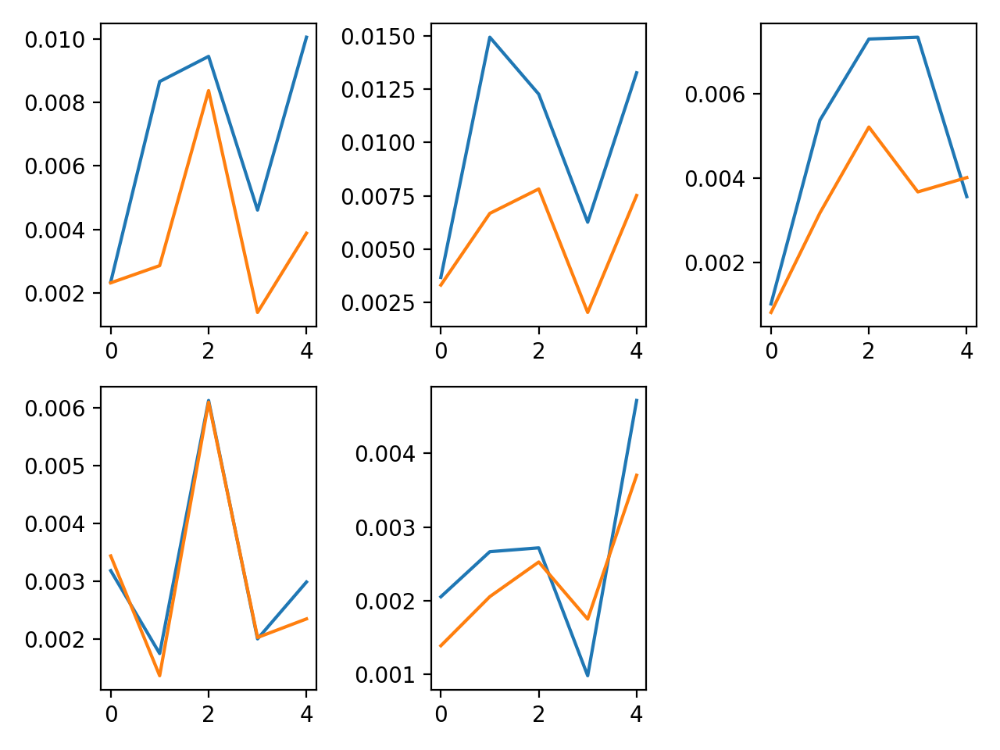

<IPython.core.display.Javascript object>


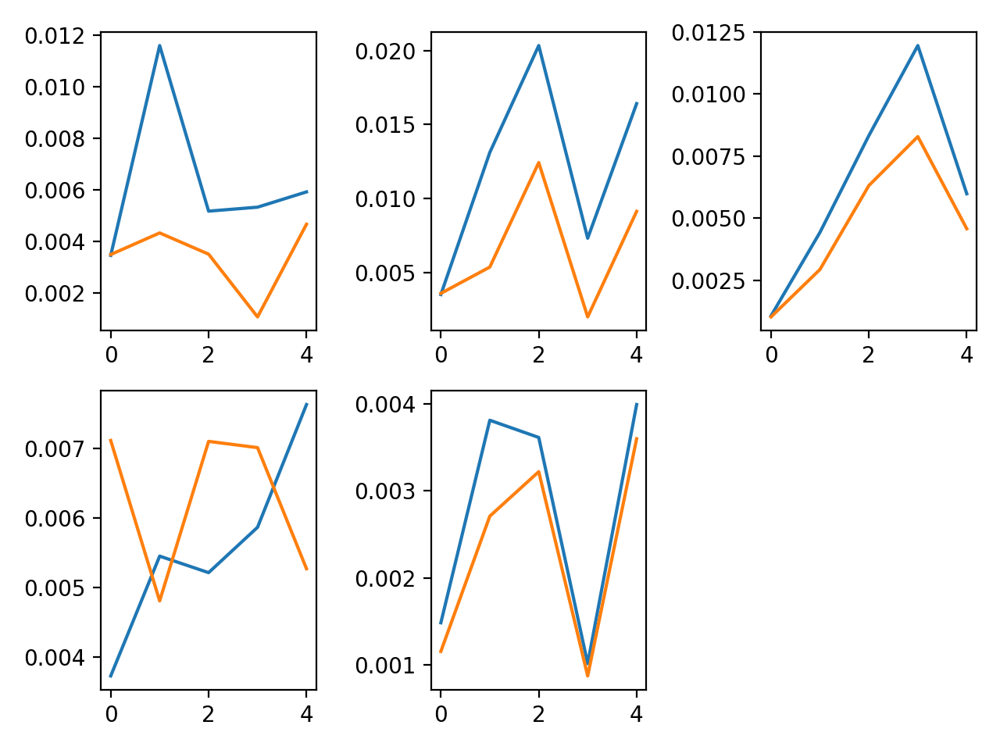

In [623]:
for ialign in range(2):
    plt.figure()
    for iR in range(5):
        plt.subplot(2,3,iR+1)
        for iori in range(2):
            plt.plot(np.nanmean(Rso_both[iR][ialign][iori],0)[-5:])
    plt.tight_layout()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


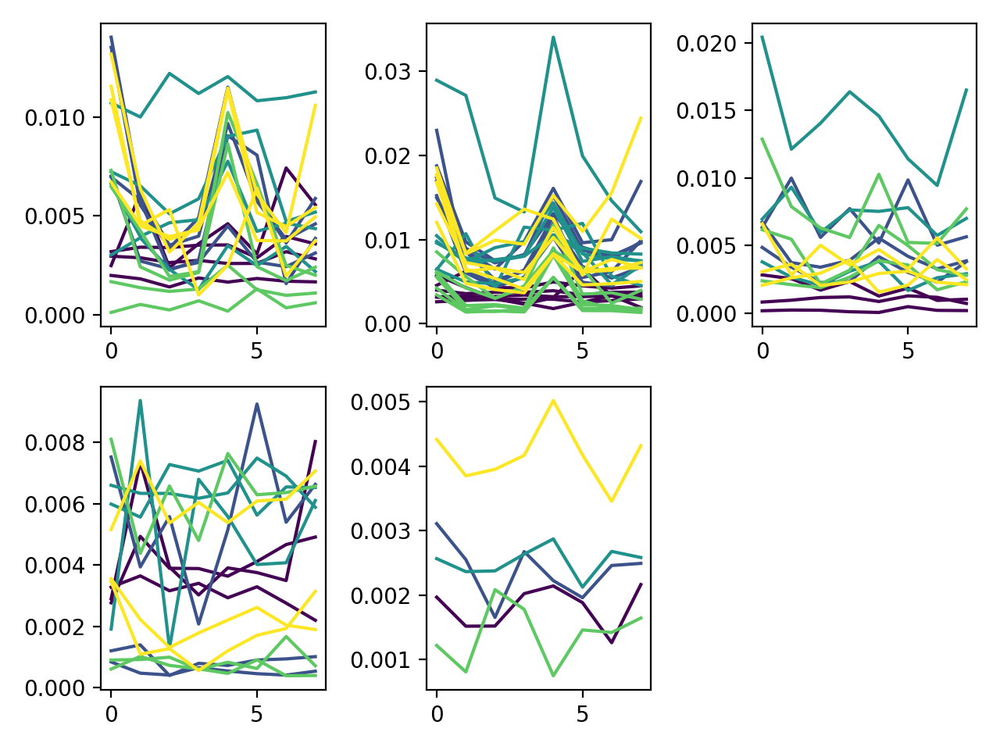

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


0,4:
[7, 14, 1, 31, 12, 21]
0,4:
[7, 14, 1, 31, 12, 21]
0,4:
[7, 14, 1, 31, 12, 21]
0,4:
[7, 14, 1, 31, 12, 21]
0,4:
[7, 14, 1, 31, 12, 21]


<IPython.core.display.Javascript object>


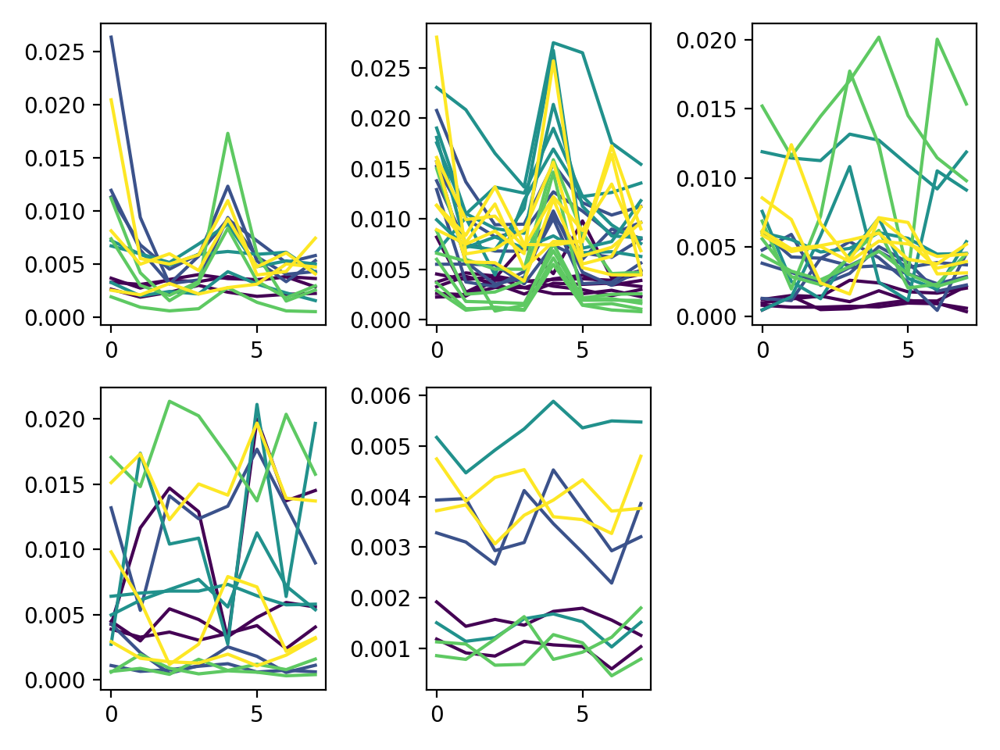

1,4:
[17, 9, 3, 10, 36, 34]
1,4:
[17, 9, 3, 10, 36, 34]
1,4:
[17, 9, 3, 10, 36, 34]
1,4:
[17, 9, 3, 10, 36, 34]
1,4:
[17, 9, 3, 10, 36, 34]


In [624]:
colors = plt.cm.viridis(np.linspace(0,1,5))
for ialign in range(2):
    plt.figure()
    for ifg in range(5):
        for itype in range(5):
            plt.subplot(2,3,itype+1)
            these_ids = np.unique(expt_ids_all[itype][ialign])
            for this_id in these_ids:
                plt.plot(np.nanmean(np.nanmean(Rso_fg[ialign][itype][0][expt_ids_all[itype][ialign]==this_id,ifg:ifg+1],0),0),c=colors[ifg])
        print('%d,%d:\n'%(ialign,itype)+str([np.sum(expt_ids_all[itype][ialign]==this_id) for this_id in these_ids]))
                # plt.plot(np.nanmean(np.nanmean(np.nanmean(Rso_fg[0][0][0],0),0),0))
    plt.tight_layout()

<IPython.core.display.Javascript object>


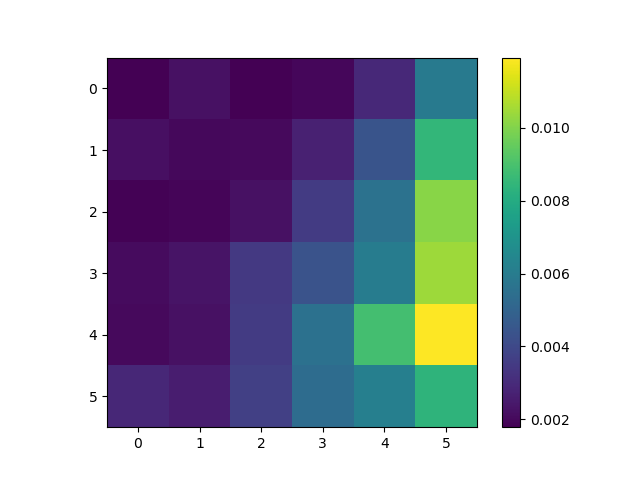

0.004285578955632342


<IPython.core.display.Javascript object>


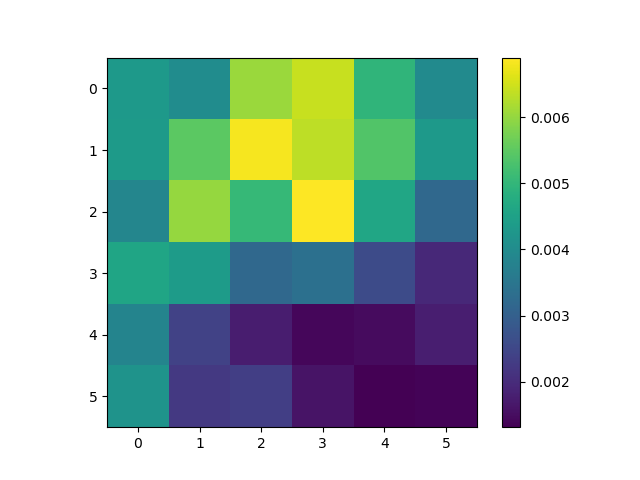

0.0038509615584868023


In [276]:
ialign = 0
iori = 0
for iR in range(2,4):
    plt.figure()
#     print(np.nanmean(np.nanmean(Rso_both[iR][ialign][iori],0)))
#     plt.plot(np.nanmean(Rso_both[iR][ialign][iori],0)[-5:])
#     plt.plot(np.nanmean(Rso_fg[iR][ialign][iori],0))
    plt.imshow(np.nanmean(np.nanmean(Rs[iR][ialign],3),0))
    plt.colorbar()

<IPython.core.display.Javascript object>


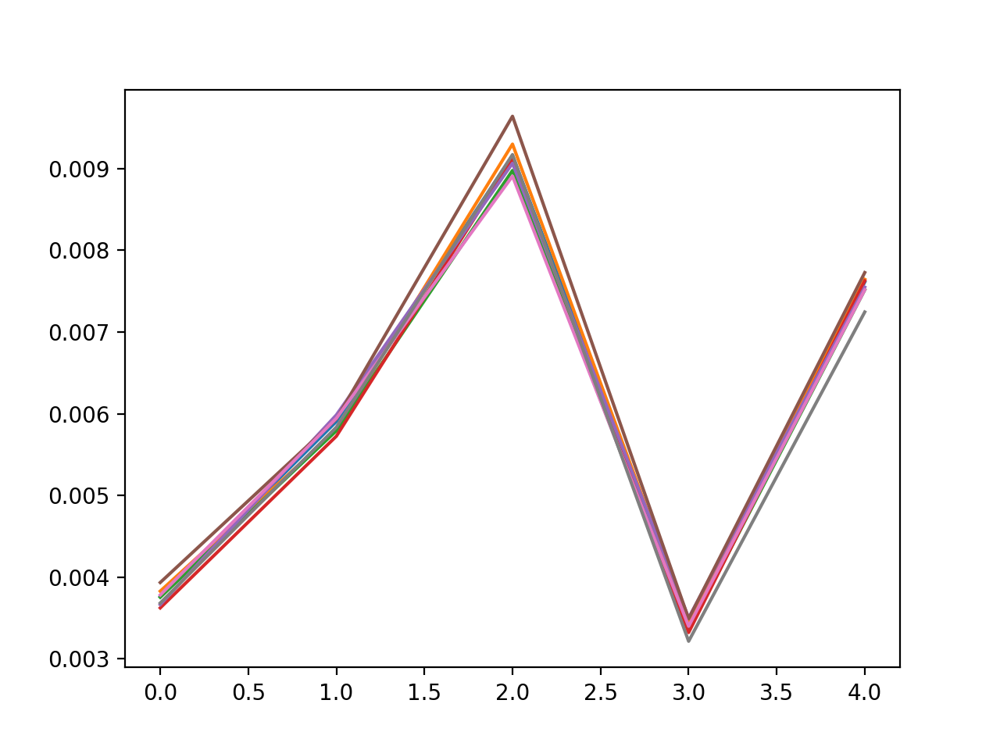

<IPython.core.display.Javascript object>


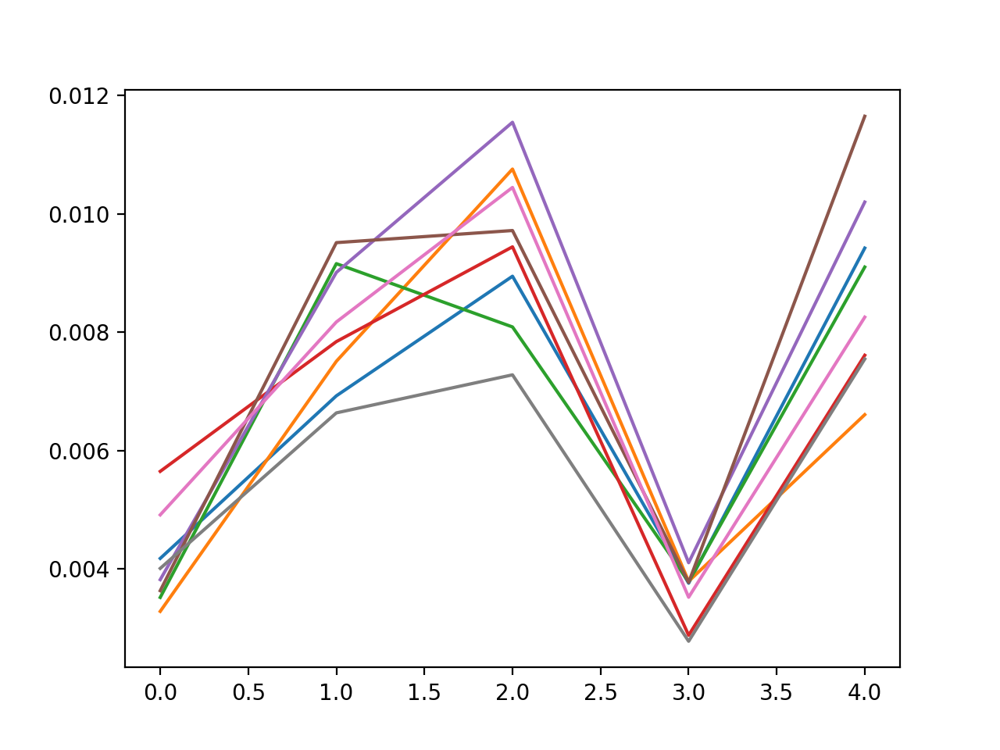

<IPython.core.display.Javascript object>


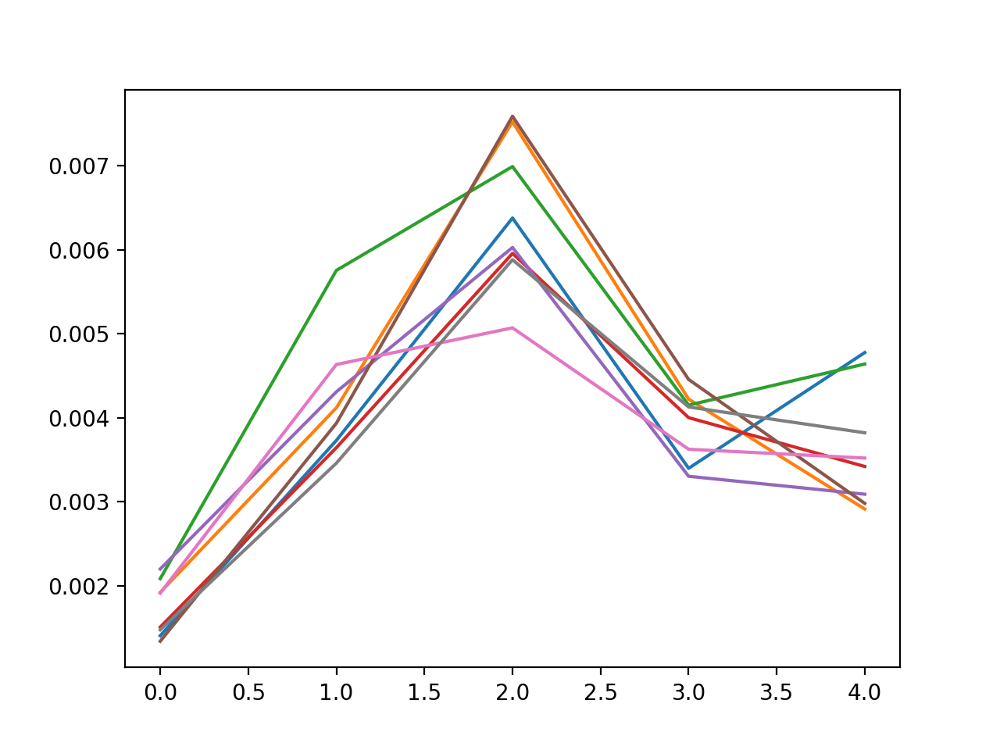

<IPython.core.display.Javascript object>


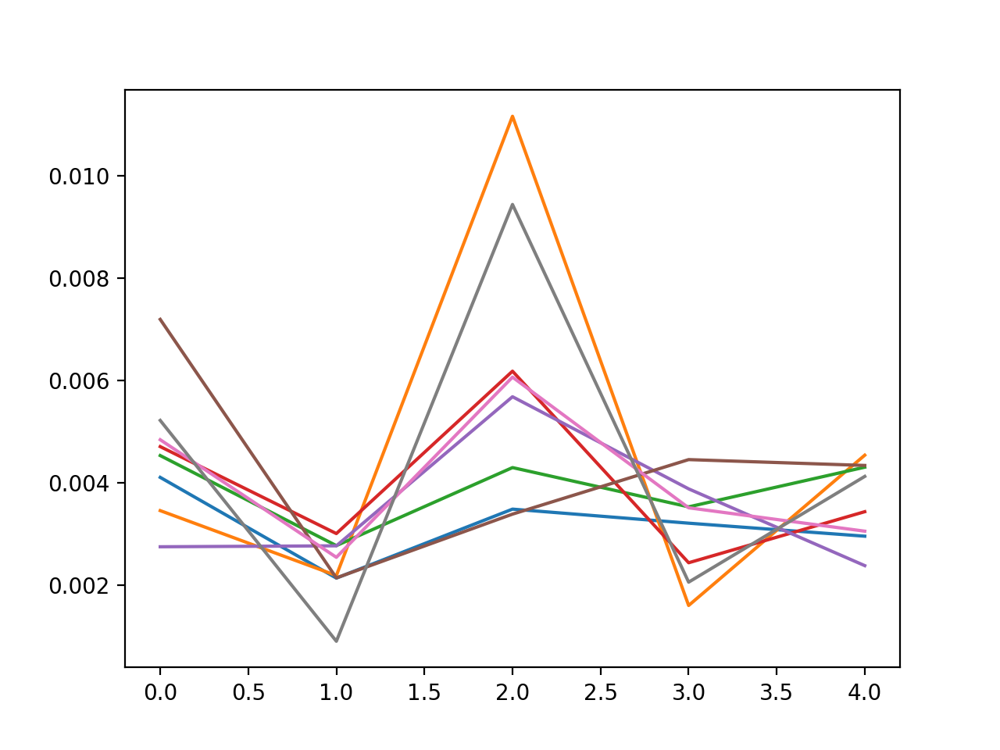

<IPython.core.display.Javascript object>


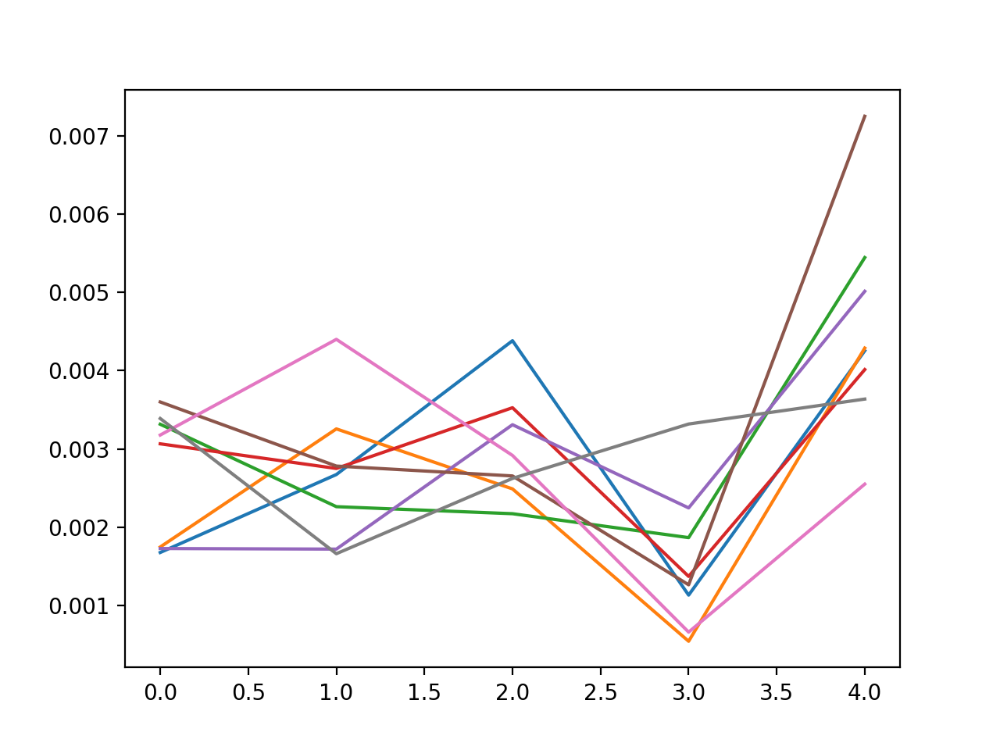

In [282]:
ialign = 0
iori = 0
for iR in range(5):
    plt.figure()
#     print(np.nanmean(np.nanmean(Rso_both[iR][ialign][iori],0)))
#     plt.plot(np.nanmean(Rso_both[iR][ialign][iori],0)[-5:])
    plt.plot(np.nanmean(Rs_fg[iR][ialign],0))
#     plt.imshow(np.nanmean(np.nanmean(Rs[iR][ialign],3),0))
#     plt.colorbar()

In [274]:
Rs[iR][ialign][iori].shape

(6, 6, 8)

<IPython.core.display.Javascript object>


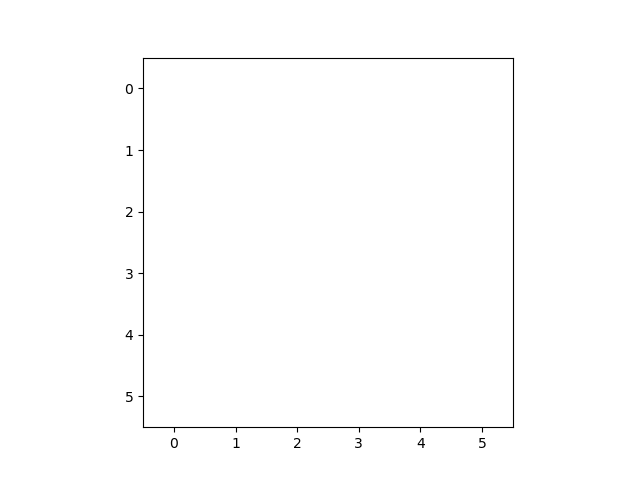

In [235]:
plt.figure()
plt.imshow(np.nanmean(np.nanmean(Rs[3][ialign],3),0))

In [156]:
        ndims = 5
        Yhat = [None for iS in range(nS)]
        Xhat = [None for iS in range(nS)]
        Ypc_list = [None for iS in range(nS)]
        Xpc_list = [None for iS in range(nS)]
        for iS in range(nS):
            Yhat[iS] = [None for iT in range(nT)]
            Xhat[iS] = [None for iT in range(nT)]
            mx = np.zeros((ncelltypes,))
            yy = [None for icelltype in range(ncelltypes)]
            for icelltype in range(ncelltypes):
                yy[icelltype] = np.nanmean(Rso[icelltype][iS][0],0)
                mx[icelltype] = np.nanmax(yy[icelltype])
            for iT in range(nT):
                y = [np.nanmean(Rso[icelltype][iS][iT],axis=0)[:,np.newaxis]/mx[icelltype] for icelltype in range(1,ncelltypes)]
                Yhat[iS][iT] = np.concatenate(y,axis=1)
                icelltype = 0
                x = np.nanmean(Rso[icelltype][iS][iT],0)[:,np.newaxis]/mx[icelltype]
                Xhat[iS][iT] = np.concatenate((x,np.ones_like(x)),axis=1)

            Ypc_list[iS] = [None for icelltype in range(1,ncelltypes)]
            for icelltype in range(1,ncelltypes):
                # Rso: nroi x nN
                rss = np.concatenate([Rso[icelltype][iS][iT].copy() for iT in range(nT)],axis=1)#.reshape(Rs[icelltype][ialign].shape[0],-1)
                rss = rss[np.isnan(rss).sum(1)==0]
                #print('rss shape: '+str(rss.shape))
                try:
                    u,s,v = np.linalg.svd(rss-np.mean(rss,0)[np.newaxis])
                    #print('v shape: '+str(v.shape))
                    Ypc_list[iS][icelltype-1] = [(s[idim],v[idim]) for idim in range(ndims)]
                except:
                    print('nope on Y')

            icelltype = 0
            rss = np.concatenate([Rso[icelltype][iS][iT].copy() for iT in range(nT)],axis=1)#.reshape(Rs[icelltype][ialign].shape[0],-1)
            rss = rss[np.isnan(rss).sum(1)==0]
            u,s,v = np.linalg.svd(rss-rss.mean(0)[np.newaxis])
            Xpc_list[iS] = [None for iinput in range(2)]
            Xpc_list[iS][0] = [(s[idim],v[idim]) for idim in range(ndims)]
            Xpc_list[iS][1] = [(0,np.zeros((Xpc_list[0][0][0][1].shape[0],))) for idim in range(ndims)]

In [158]:
Rso[0][0][0].shape


(7402, 36)